# Capstone - Sales Forecasting

### Problem Statement
Rossmann is a European drug distributor which operates over 3,000 drug stores across seven European countries. Since a lot of drugs come with a short shelf life, that is, they do not have a long expiry date, it becomes imperative for Rossmann to accurately forecast sales at their individual stores. Currently, the forecasting is taken care of by the store managers who are tasked with forecasting daily sales for the next six weeks. 


As expected, store sales are influenced by many factors, including promotional campaigns, competition, state holidays, seasonality, and locality.

### Objective
With thousands of individual managers predicting sales based on their unique circumstances and intuitions, the accuracy of the forecasts is quite varied. To overcome this problem, the company has hired you as a data scientist to work on the forecasting problem. As part of your job role, you are tasked with building a forecasting model to forecast the daily sales for the next six weeks. To help you with the same, you have been provided with historical sales data for 1,115 Rossmann stores.

### Importing library

In [1]:
#importing the useful libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from datetime import datetime

#importing the warnings.
import warnings
warnings.filterwarnings('ignore')


import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.vector_ar.vecm import coint_johansen 
from dateutil.relativedelta import relativedelta
from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score 
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error
from tabulate import tabulate

### Loading/Understanding the data set of Store and train and performing EDA on both Data set

In [2]:
# Loading/Reading the data set of Store and train

# Store.csv - The store table contains the metadata for every single store

# train.csv - The train table contains the sales data for individual stores at a daily level along with the details about the day

store_df = pd.read_csv('store.csv')

train_df = pd.read_csv('train.csv')


In [3]:
# Checking train data loading status

train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


In [4]:
# Checking store data loading status

store_df.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [5]:
# Printing Data size

print(train_df.shape)
print(store_df.shape)

(1017209, 9)
(1115, 10)


#### Preparing train Data for Analysis

In [6]:
# Checking train data info
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 9 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   Store          1017209 non-null  int64 
 1   DayOfWeek      1017209 non-null  int64 
 2   Date           1017209 non-null  object
 3   Sales          1017209 non-null  int64 
 4   Customers      1017209 non-null  int64 
 5   Open           1017209 non-null  int64 
 6   Promo          1017209 non-null  int64 
 7   StateHoliday   1017209 non-null  object
 8   SchoolHoliday  1017209 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 69.8+ MB


In [7]:
# Converting into datetime format
train_df['Date'] = pd.to_datetime(train_df['Date'])


In [8]:
# Creating new feature of Date components

train_df['Year'] = train_df.Date.dt.year
train_df['Month'] = train_df.Date.dt.month
train_df['Day'] = train_df.Date.dt.day
train_df['WeekOfYear'] = train_df.Date.dt.weekofyear

In [9]:
# creating a new feature as SalesPerCustomer

train_df['SalePerCustomer'] = train_df['Sales']/train_df['Customers']

# Checking updated dataframe after updating new features

train_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Year,Month,Day,WeekOfYear,SalePerCustomer
0,1,5,2015-07-31,5263,555,1,1,0,1,2015,7,31,31,9.482883
1,2,5,2015-07-31,6064,625,1,1,0,1,2015,7,31,31,9.702400
2,3,5,2015-07-31,8314,821,1,1,0,1,2015,7,31,31,10.126675
3,4,5,2015-07-31,13995,1498,1,1,0,1,2015,7,31,31,9.342457
4,5,5,2015-07-31,4822,559,1,1,0,1,2015,7,31,31,8.626118


In [10]:
# checking the Data type of all columns of training data

train_df.info(True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1017209 entries, 0 to 1017208
Data columns (total 14 columns):
 #   Column           Non-Null Count    Dtype         
---  ------           --------------    -----         
 0   Store            1017209 non-null  int64         
 1   DayOfWeek        1017209 non-null  int64         
 2   Date             1017209 non-null  datetime64[ns]
 3   Sales            1017209 non-null  int64         
 4   Customers        1017209 non-null  int64         
 5   Open             1017209 non-null  int64         
 6   Promo            1017209 non-null  int64         
 7   StateHoliday     1017209 non-null  object        
 8   SchoolHoliday    1017209 non-null  int64         
 9   Year             1017209 non-null  int64         
 10  Month            1017209 non-null  int64         
 11  Day              1017209 non-null  int64         
 12  WeekOfYear       1017209 non-null  int64         
 13  SalePerCustomer  844340 non-null   float64       
dtypes:

In [11]:
# checking missing values in training data
(train_df.isna().sum()/len(train_df)*100)

Store               0.000000
DayOfWeek           0.000000
Date                0.000000
Sales               0.000000
Customers           0.000000
Open                0.000000
Promo               0.000000
StateHoliday        0.000000
SchoolHoliday       0.000000
Year                0.000000
Month               0.000000
Day                 0.000000
WeekOfYear          0.000000
SalePerCustomer    16.994443
dtype: float64

In [12]:
# Before removing checking closed Storecount so that we can remove

(train_df['Open'] == 0).sum()

172817

In [13]:
# removing closed stores

train_df = train_df[train_df['Open'] != 0]

In [14]:
# Checking count of store which is open but having zero sales

(train_df['Sales'] == 0).sum()


54

In [15]:
# removing non sales stores

train_df = train_df[train_df['Sales'] != 0]

In [16]:
# checking again missing values in training data

(train_df.isna().sum()/len(train_df)*100)


Store              0.0
DayOfWeek          0.0
Date               0.0
Sales              0.0
Customers          0.0
Open               0.0
Promo              0.0
StateHoliday       0.0
SchoolHoliday      0.0
Year               0.0
Month              0.0
Day                0.0
WeekOfYear         0.0
SalePerCustomer    0.0
dtype: float64

In [17]:
# Checking Shape of the training data

train_df.shape

(844338, 14)

#### Preparing Store Data for Analysis

In [18]:
# Now checking Store data set
store_df.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [19]:
# checking missing values in store data
(store_df.isna().sum()/len(store_df)*100)

Store                         0.000000
StoreType                     0.000000
Assortment                    0.000000
CompetitionDistance           0.269058
CompetitionOpenSinceMonth    31.748879
CompetitionOpenSinceYear     31.748879
Promo2                        0.000000
Promo2SinceWeek              48.789238
Promo2SinceYear              48.789238
PromoInterval                48.789238
dtype: float64

In [20]:
# imputing median value into CompetitionDistance columns which is having null value

store_df['CompetitionDistance'].fillna(store_df['CompetitionDistance'].median(), inplace = True)

In [21]:
# imputing most occuring values into CompetitionOpenSinceMonth and CompetitionOpenSinceYear columsn which is having null value

store_df['CompetitionOpenSinceMonth'].fillna(store_df['CompetitionOpenSinceMonth'].mode()[0], inplace = True)
store_df['CompetitionOpenSinceYear'].fillna(store_df['CompetitionOpenSinceYear'].mode()[0], inplace = True)

# imputing with 0 into the given columns instead on nan value.

store_df['Promo2SinceWeek'].fillna(value=0,inplace=True)
store_df['Promo2SinceYear'].fillna(value=0,inplace=True)
store_df['PromoInterval'].fillna(value=0,inplace=True)

In [22]:
# checking missing values in store data
(store_df.isna().sum()/len(store_df)*100)

Store                        0.0
StoreType                    0.0
Assortment                   0.0
CompetitionDistance          0.0
CompetitionOpenSinceMonth    0.0
CompetitionOpenSinceYear     0.0
Promo2                       0.0
Promo2SinceWeek              0.0
Promo2SinceYear              0.0
PromoInterval                0.0
dtype: float64

### Merging Both Data set train and store

In [23]:
# merging both train and store data frame

rossmann_df = pd.merge(train_df, store_df, how='inner', on='Store')

rossmann_df.set_index('Date', inplace=True)


In [24]:
# checking data size

rossmann_df.shape

(844338, 22)

In [25]:
# checking data loading status

rossmann_df.head()

,Store,DayOfWeek,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,Year,Month,...,SalePerCustomer,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,,,,
2015-07-31,1,5,5263,555,1,1,0,1,2015,7,...,9.482883,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2015-07-30,1,4,5020,546,1,1,0,1,2015,7,...,9.194139,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2015-07-29,1,3,4782,523,1,1,0,1,2015,7,...,9.143403,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2015-07-28,1,2,5011,560,1,1,0,1,2015,7,...,8.948214,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0
2015-07-27,1,1,6102,612,1,1,0,1,2015,7,...,9.970588,c,a,1270.0,9.0,2008.0,0,0.0,0.0,0


In [26]:
# Checking rossmann_df columns name

rossmann_df.columns


Index(['Store', 'DayOfWeek', 'Sales', 'Customers', 'Open', 'Promo',
       'StateHoliday', 'SchoolHoliday', 'Year', 'Month', 'Day', 'WeekOfYear',
       'SalePerCustomer', 'StoreType', 'Assortment', 'CompetitionDistance',
       'CompetitionOpenSinceMonth', 'CompetitionOpenSinceYear', 'Promo2',
       'Promo2SinceWeek', 'Promo2SinceYear', 'PromoInterval'],
      dtype='object')

In [27]:
# mapping values of categorical variables

holiday_mapping = {'0': '0', 0: '0', 'a': 'a', 'b': 'b', 'c': 'c'}

rossmann_df['StateHoliday'] = rossmann_df['StateHoliday'].map(holiday_mapping)

In [28]:
# Checking rossmann info

rossmann_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 844338 entries, 2015-07-31 to 2013-01-02
Data columns (total 22 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Store                      844338 non-null  int64  
 1   DayOfWeek                  844338 non-null  int64  
 2   Sales                      844338 non-null  int64  
 3   Customers                  844338 non-null  int64  
 4   Open                       844338 non-null  int64  
 5   Promo                      844338 non-null  int64  
 6   StateHoliday               844338 non-null  object 
 7   SchoolHoliday              844338 non-null  int64  
 8   Year                       844338 non-null  int64  
 9   Month                      844338 non-null  int64  
 10  Day                        844338 non-null  int64  
 11  WeekOfYear                 844338 non-null  int64  
 12  SalePerCustomer            844338 non-null  float64
 13  StoreType    

## Visualising the Data(EDA)

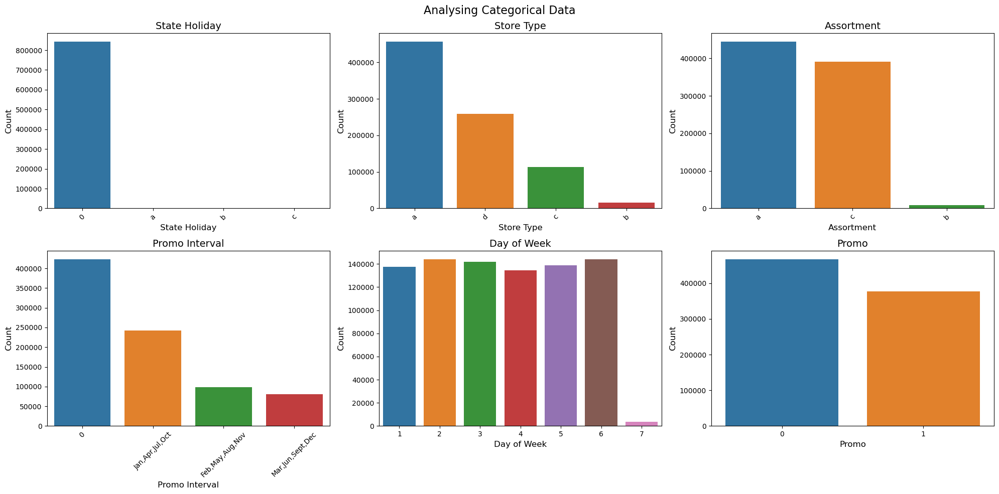

In [29]:
# Creating a figure with subplots
fig, ax = plt.subplots(2, 3, figsize=(20, 10))

# Plotting StateHoliday count
stateholiday_counts = rossmann_df['StateHoliday'].value_counts()
sns.barplot(x=stateholiday_counts.index, y=stateholiday_counts, ax=ax[0, 0])
ax[0, 0].set_title('State Holiday', fontsize=14)
ax[0, 0].set_xlabel('State Holiday', fontsize=12)
ax[0, 0].set_ylabel('Count', fontsize=12)
ax[0, 0].tick_params(axis='x', rotation=45)

# Plotting StoreType count
storetype_counts = rossmann_df['StoreType'].value_counts()
sns.barplot(x=storetype_counts.index, y=storetype_counts, ax=ax[0, 1])
ax[0, 1].set_title('Store Type', fontsize=14)
ax[0, 1].set_xlabel('Store Type', fontsize=12)
ax[0, 1].set_ylabel('Count', fontsize=12)
ax[0, 1].tick_params(axis='x', rotation=45)

# Plotting Assortment count
assortment_counts = rossmann_df['Assortment'].value_counts()
sns.barplot(x=assortment_counts.index, y=assortment_counts, ax=ax[0, 2])
ax[0, 2].set_title('Assortment', fontsize=14)
ax[0, 2].set_xlabel('Assortment', fontsize=12)
ax[0, 2].set_ylabel('Count', fontsize=12)
ax[0, 2].tick_params(axis='x', rotation=45)

# Plotting PromoInterval count
promointerval_counts = rossmann_df['PromoInterval'].value_counts()
sns.barplot(x=promointerval_counts.index, y=promointerval_counts, ax=ax[1, 0])
ax[1, 0].set_title('Promo Interval', fontsize=14)
ax[1, 0].set_xlabel('Promo Interval', fontsize=12)
ax[1, 0].set_ylabel('Count', fontsize=12)
ax[1, 0].tick_params(axis='x', rotation=45)

# Plotting DayOfWeek count
dayofweek_counts = rossmann_df['DayOfWeek'].value_counts()
sns.barplot(x=dayofweek_counts.index, y=dayofweek_counts, ax=ax[1, 1])
ax[1, 1].set_title('Day of Week', fontsize=14)
ax[1, 1].set_xlabel('Day of Week', fontsize=12)
ax[1, 1].set_ylabel('Count', fontsize=12)
ax[1, 1].tick_params(axis='x', rotation=0)

# Plotting Promo count
promo_counts = rossmann_df['Promo'].value_counts()
sns.barplot(x=promo_counts.index, y=promo_counts, ax=ax[1, 2])
ax[1, 2].set_title('Promo', fontsize=14)
ax[1, 2].set_xlabel('Promo', fontsize=12)
ax[1, 2].set_ylabel('Count', fontsize=12)
ax[1, 2].tick_params(axis='x', rotation=0)

# Add title to the entire figure
fig.suptitle('Analysing Categorical Data', fontsize=16)


plt.tight_layout()

plt.show()


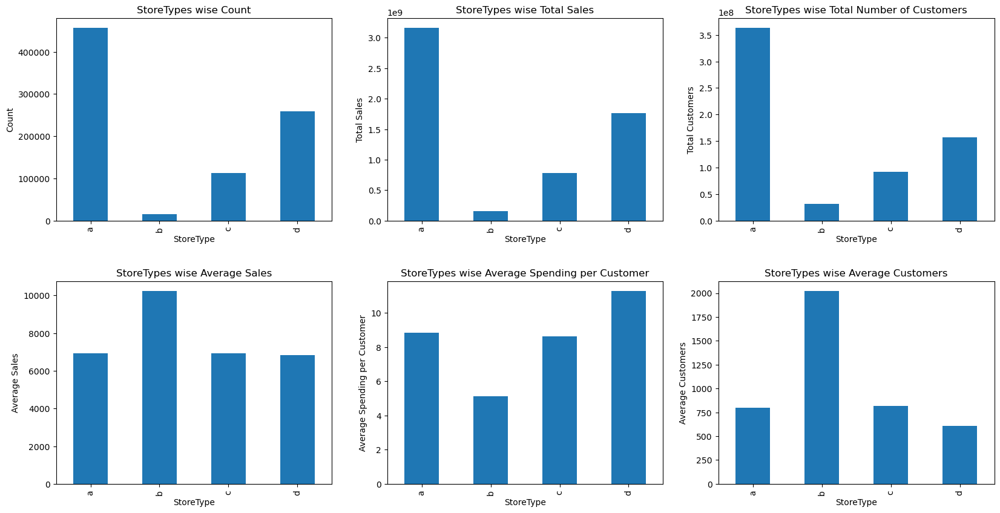

In [30]:
# Ploting Storetype against other variable

f, ax = plt.subplots(2, 3, figsize=(20, 10))

# Plotting total sales for each StoreType
rossmann_df.groupby("StoreType")["Sales"].sum().plot(kind="bar", ax=ax[0, 1], title="StoreTypes wise Total Sales")
ax[0, 1].set_xlabel("StoreType")
ax[0, 1].set_ylabel("Total Sales")


# Plotting total number of customers for each StoreType
rossmann_df.groupby("StoreType")["Customers"].sum().plot(kind="bar", ax=ax[0, 2], title="StoreTypes wise Total Number of Customers")
ax[0, 2].set_xlabel("StoreType")
ax[0, 2].set_ylabel("Total Customers")


# Plotting total count of each StoreType
rossmann_df.groupby("StoreType")["Store"].count().plot(kind="bar", ax=ax[0, 0], title="StoreTypes wise Count")
ax[0, 0].set_xlabel("StoreType")
ax[0, 0].set_ylabel("Count")


# Plotting average sales for each StoreType
rossmann_df.groupby("StoreType")["Sales"].mean().plot(kind="bar", ax=ax[1, 0], title="StoreTypes wise Average Sales")
ax[1, 0].set_xlabel("StoreType")
ax[1, 0].set_ylabel("Average Sales")

# Plotting average spending per customer for each StoreType
rossmann_df.groupby("StoreType")["SalePerCustomer"].mean().plot(kind="bar", ax=ax[1, 1], title="StoreTypes wise Average Spending per Customer")
ax[1, 1].set_xlabel("StoreType")
ax[1, 1].set_ylabel("Average Spending per Customer")

# Plotting average number of customers per StoreType
rossmann_df.groupby("StoreType")["Customers"].mean().plot(kind="bar", ax=ax[1, 2], title="StoreTypes wise Average Customers")
ax[1, 2].set_xlabel("StoreType")
ax[1, 2].set_ylabel("Average Customers")

plt.subplots_adjust(hspace=0.3)

plt.show()


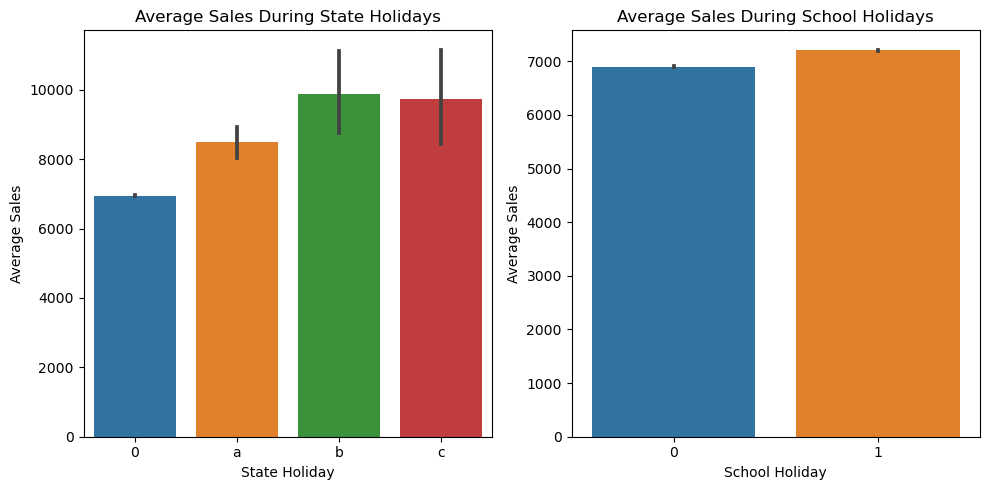

In [31]:
# Ploting the Holiday Analysis Vs Sales for State holiday and School Holiday

# Set up the figure and axes for subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Plotting State Holiday Sales
sns.barplot(x='StateHoliday', y='Sales', data=rossmann_df, estimator=np.mean, ax=axes[0])
axes[0].set_title('Average Sales During State Holidays')
axes[0].set_xlabel('State Holiday')
axes[0].set_ylabel('Average Sales')

# Plotting School Holiday Sales
sns.barplot(x='SchoolHoliday', y='Sales', data=rossmann_df, estimator=np.mean, ax=axes[1])
axes[1].set_title('Average Sales During School Holidays')
axes[1].set_xlabel('School Holiday')
axes[1].set_ylabel('Average Sales')


plt.tight_layout()

plt.show()


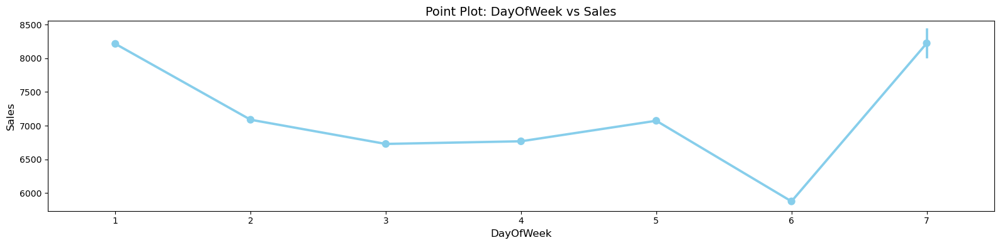

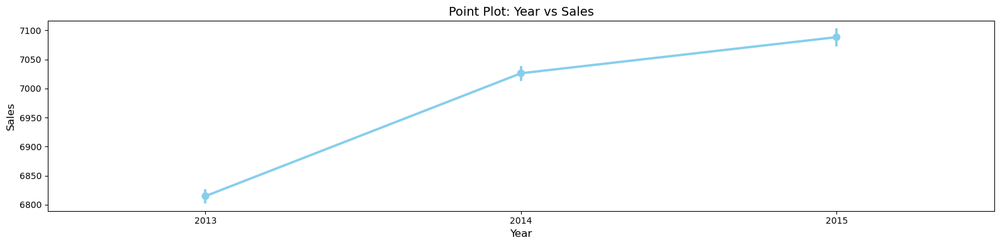

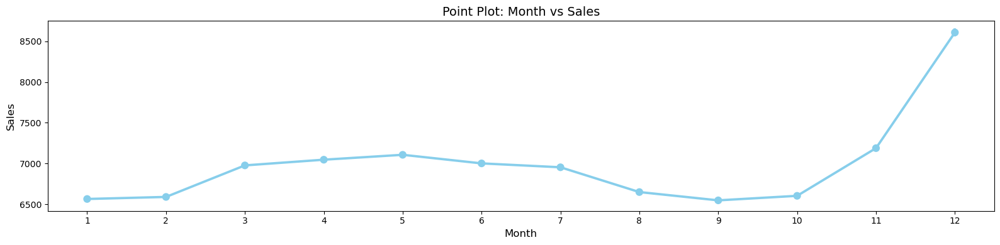

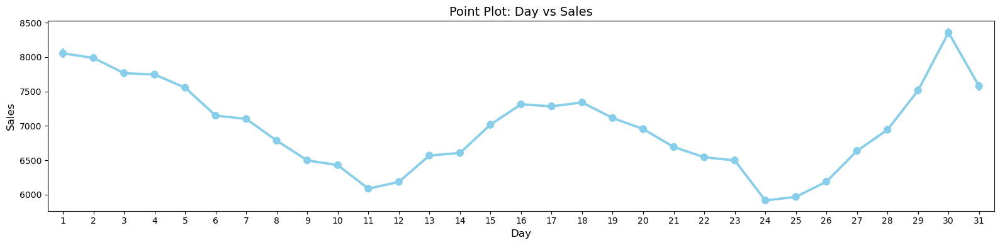

In [32]:
# Ploting a point plot against Sales

date_cols = ['DayOfWeek','Year','Month','Day']

for col in date_cols:
    plt.figure(figsize=(16, 4))
    
    sns.pointplot(x=col, y='Sales', data=rossmann_df, color='skyblue')
    

    plt.title(f'Point Plot: {col} vs Sales', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Sales', fontsize=12)
    
    plt.tight_layout()
    plt.show()


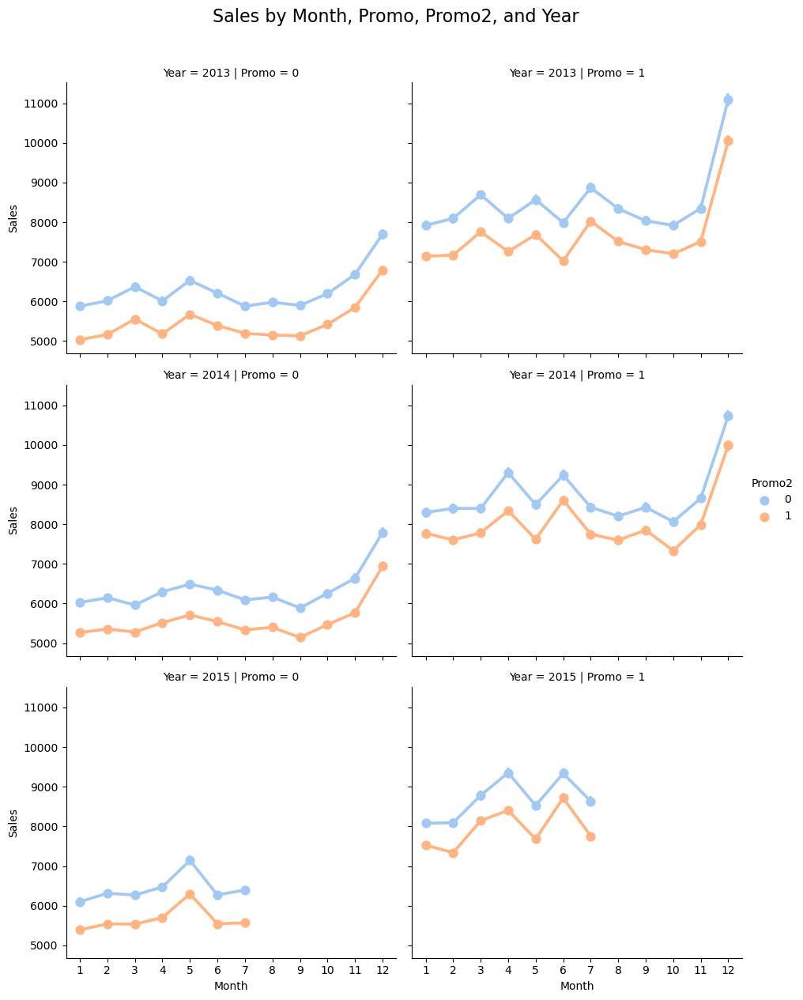

In [33]:
# Ploting Year wise trends for Promo and Promo2 to analyse data

sns.catplot(data=rossmann_df, x="Month", y="Sales",
            col='Promo',
            hue='Promo2',
            row="Year", 
            kind='point', 
            height=4, aspect=1.2,
            palette='pastel' 
            )

plt.suptitle('Sales by Month, Promo, Promo2, and Year', y=1.05, fontsize=16)


plt.show()


In [34]:
# Droping these open column as this is not required for analysis

rossmann_df.drop(['Open'], inplace=True, axis=1)

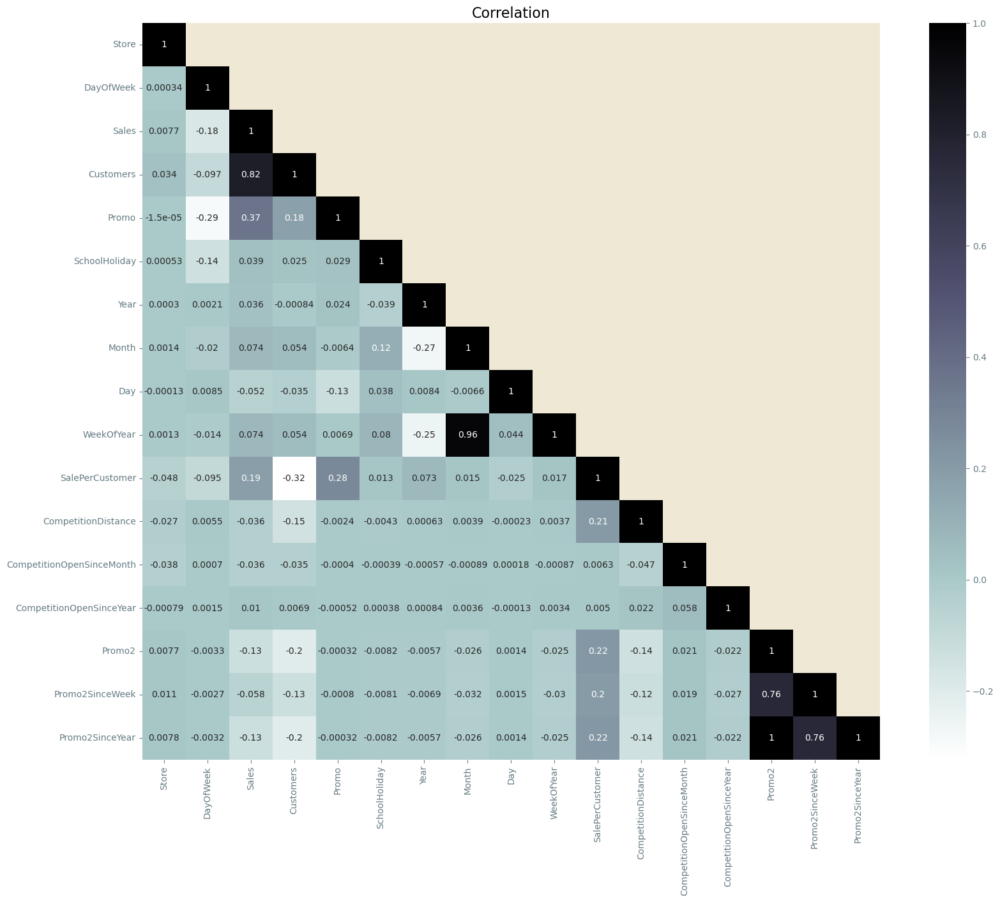

In [35]:
# Ploting heatmap to understand the Corr

plt.figure(figsize = (20, 15))
plt.style.use('Solarize_Light2')
correlation_map = rossmann_df[rossmann_df.columns].corr()
obj = np.array(correlation_map)
obj[np.tril_indices_from(obj)] = False
sns.heatmap(rossmann_df.corr(), mask= obj,annot = True, square=True, cmap = 'bone_r')
plt.title('Correlation')
plt.show()

In [36]:
# Checking Highly Correlated Features with Sales

corr_matrix = rossmann_df.corr()
corr_with_sales = abs(corr_matrix["Sales"])
relevant_features = corr_with_sales[corr_with_sales > 0.5]
print("Highly Correlated Features with Sales:")
print(relevant_features)


Highly Correlated Features with Sales:
Sales        1.000000
Customers    0.823552
Name: Sales, dtype: float64


### Outlier Checks and Treatment

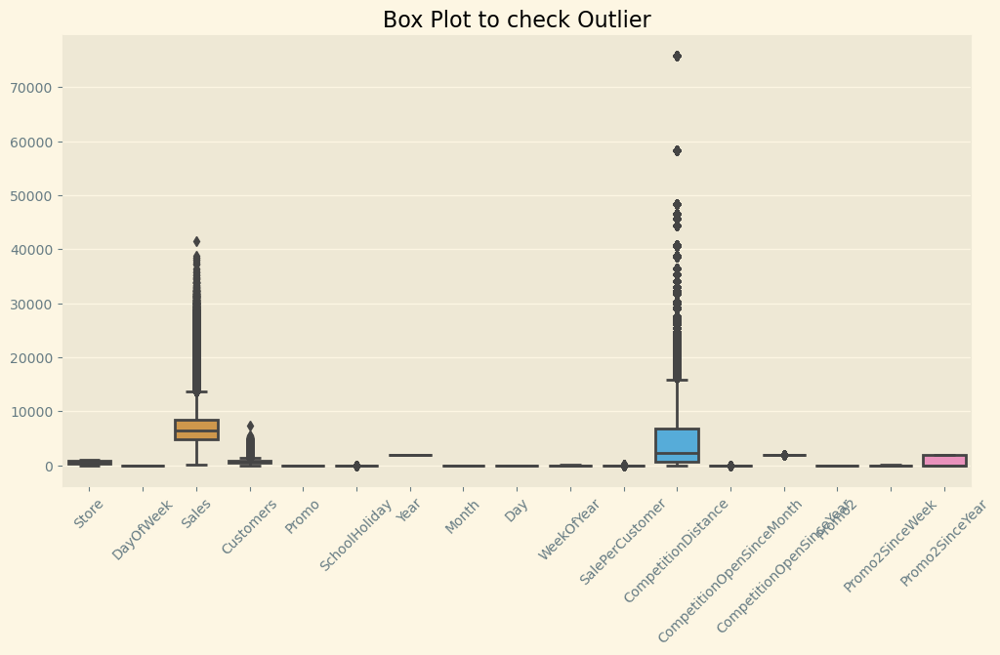

In [37]:
# Ploting boxplot to checks outliers

num_cols = rossmann_df.select_dtypes(include='number').columns

plt.figure(figsize=(12,6))
sns.boxplot(data=rossmann_df[num_cols])
plt.title("Box Plot to check Outlier")
plt.xticks(rotation=45)
plt.show()

#### Box plot shows that we have a very high outliers in sales and salespercustomer
#### Removing Outlier by taking 99%

In [38]:
# Removing Outliers for 'Sales' and 'SalePerCustomer' columns
outlier_cols = ['Sales', 'SalePerCustomer']

for col in outlier_cols:
    # Calculate the 1st and 99th percentiles for the column
    percentile_01 = rossmann_df[col].quantile(0.01)
    percentile_99 = rossmann_df[col].quantile(0.99)
    
    # Replace outliers with the nearest percentile value
    rossmann_df[col] = rossmann_df[col].clip(lower=percentile_01, upper=percentile_99)


## EDA Output for train and Store data set

- Categorical Analysis
        State Holiday: Most sales occur during non-state holidays, with negligible impact on sales during state holidays.
        Store Type: Store type "a" is the most prevalent, followed by "d", "c", and "b".
        Assortment: Majority of stores have assortment type "a".
- Store Type Analysis:
        Sales and Customers: Store type "a" exhibits the highest total sales and number of customers, followed by type "d".
        Count of Stores: Store type "a" has the highest count of stores.
        Average Sales and Spending: Store type "d" shows the highest average sales and spending per customer.
        Average Customers: Store type "d" also attracts the highest average number of customers.
- Holiday Analysis:
        State Holidays vs. School Holidays: Average sales are consistent irrespective of state or school holidays.
- Time Series Analysis:
        Day of Week vs. Sales: Sales are relatively consistent across days of the week.
        Yearly Trends: Sales have been relatively stable over the years.
        Monthly Trends: Sales peak around the end of the year, particularly during November and December.
        Promotional Trends: Promo significantly impacts sales, with an added boost when Promo2 is active.
- correlation:
        The analysis shows strong positive correlation between Sales and Customers with a correlation coefficient of approximately 0.824, indicating that there is a significant relationship between the number of customers and the sales generated. This finding suggesting that higher customer footfall tends to drive increased sales, highlighting the importance of customer engagement and traffic in influencing retail performance.
        
##### Overall, the analysis provides insights into the behavior of sales and customer patterns across different store types, promotional strategies, and holiday occurrences, which can guide further predictive modeling and business decisions.

### Data Prepration for Key Stores

In [39]:
# Define Key store no
key_stores = [1, 3, 8, 9, 13, 25, 29, 31, 46]

# Create a dictionary to store DataFrames for each key store
keystore_Data = {}
for store in key_stores:
    keystore_Data[store] = rossmann_df[rossmann_df['Store'] == store]


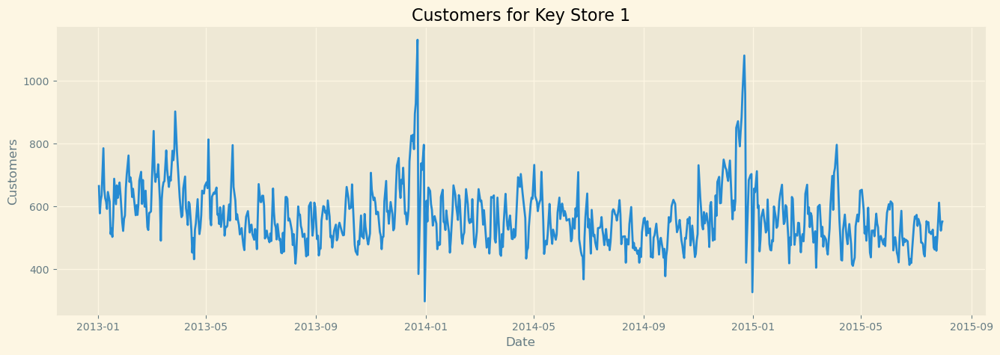

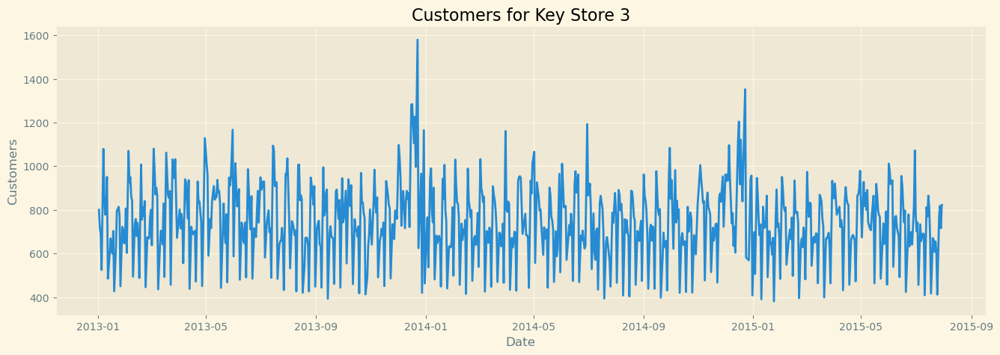

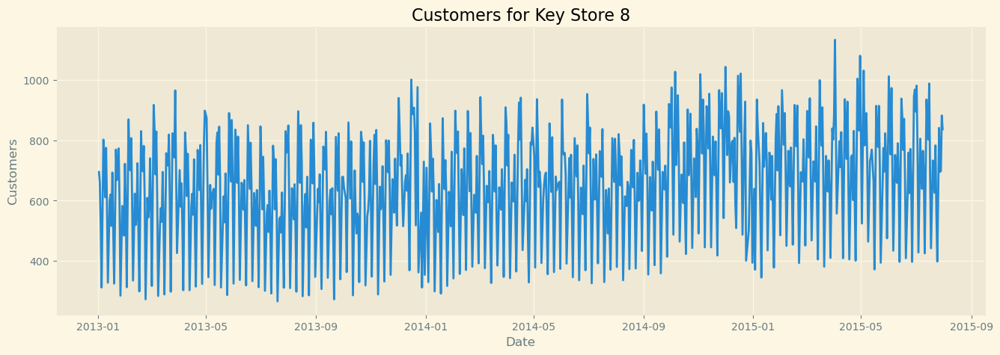

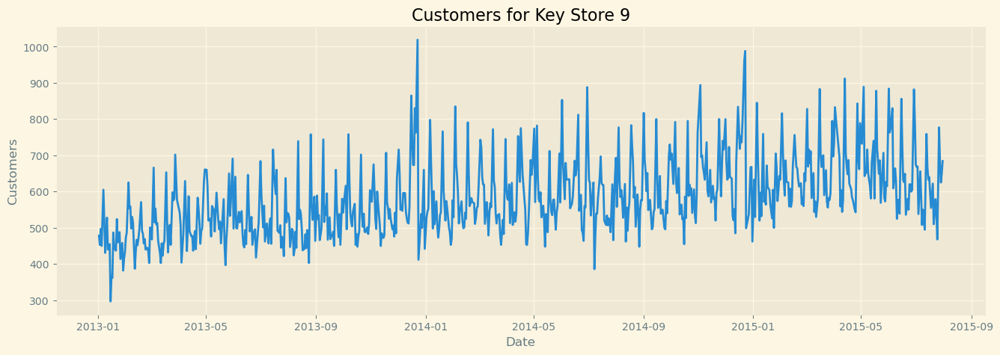

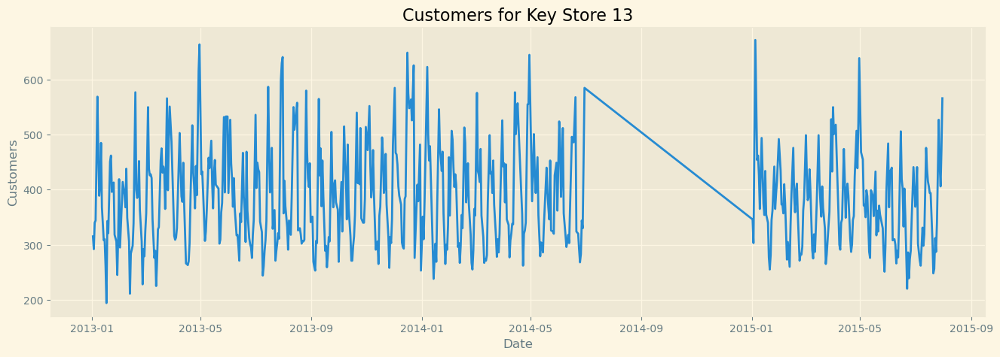

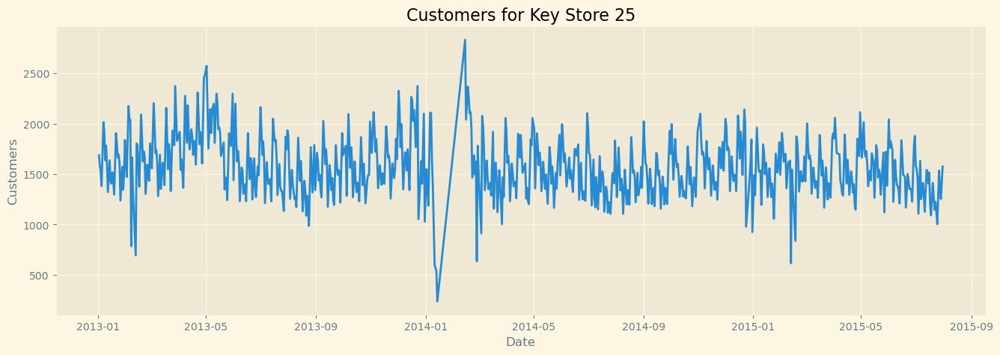

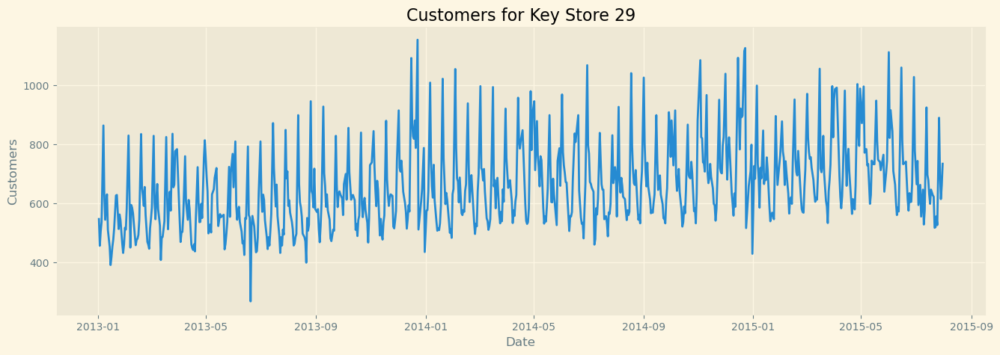

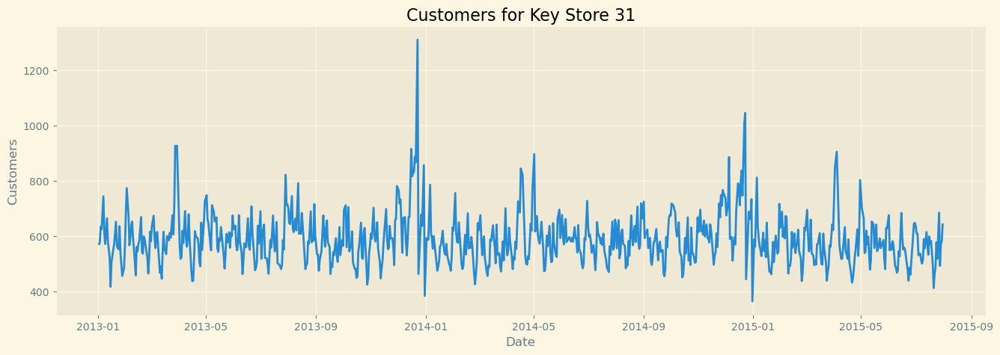

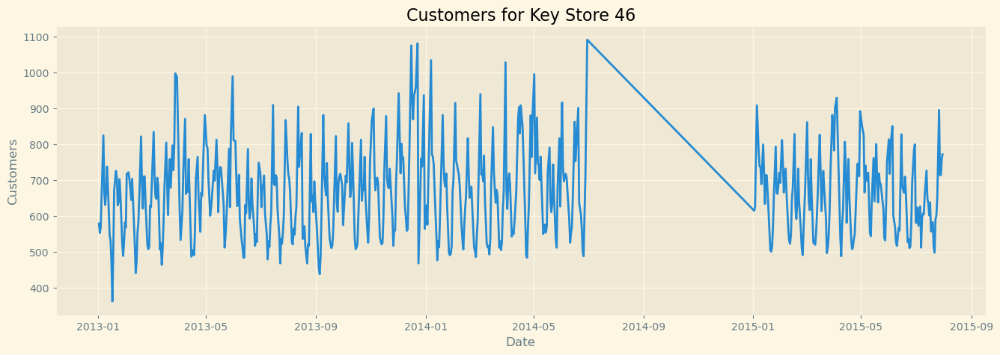

In [40]:
# Ploting treds for each stores customer wise sales for Analysis

for store in key_stores:
    plt.figure(figsize=(16, 5))
    
    # Retrieving the DataFrame for the current store from the dictionary
    store_data = keystore_Data[store]
    
    # Ploting sales against date for the current store
    plt.plot(store_data.index, store_data['Customers'])
    
    plt.title('Customers for Key Store ' + str(store))
    plt.xlabel('Date')
    plt.ylabel('Customers')
    plt.show()



### Performing Additive Seasonal Decomposition for all key store

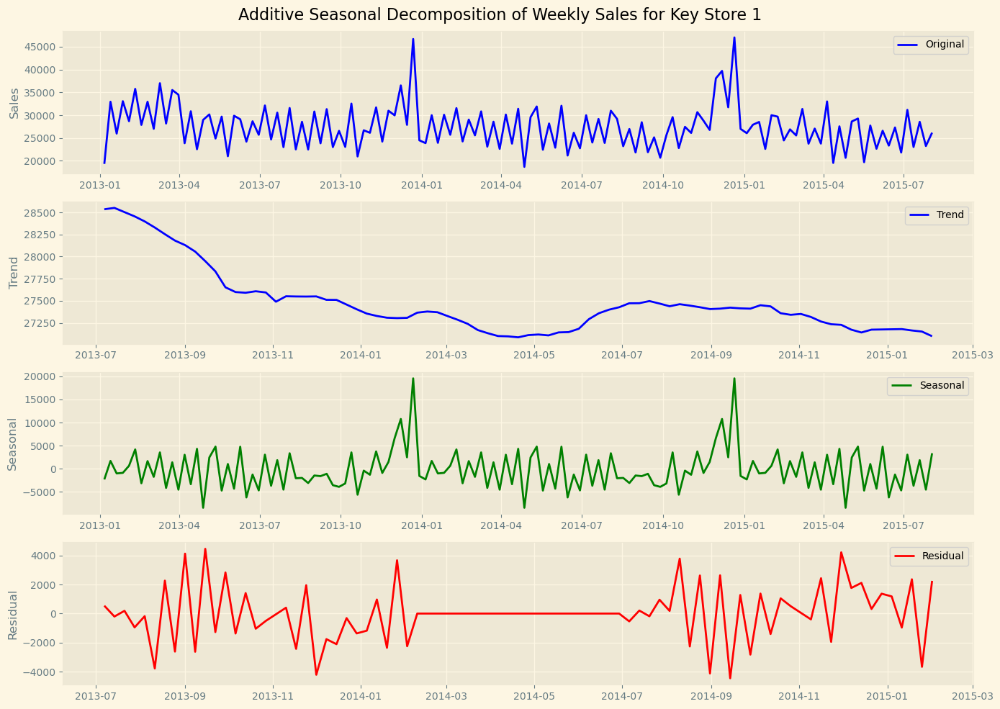

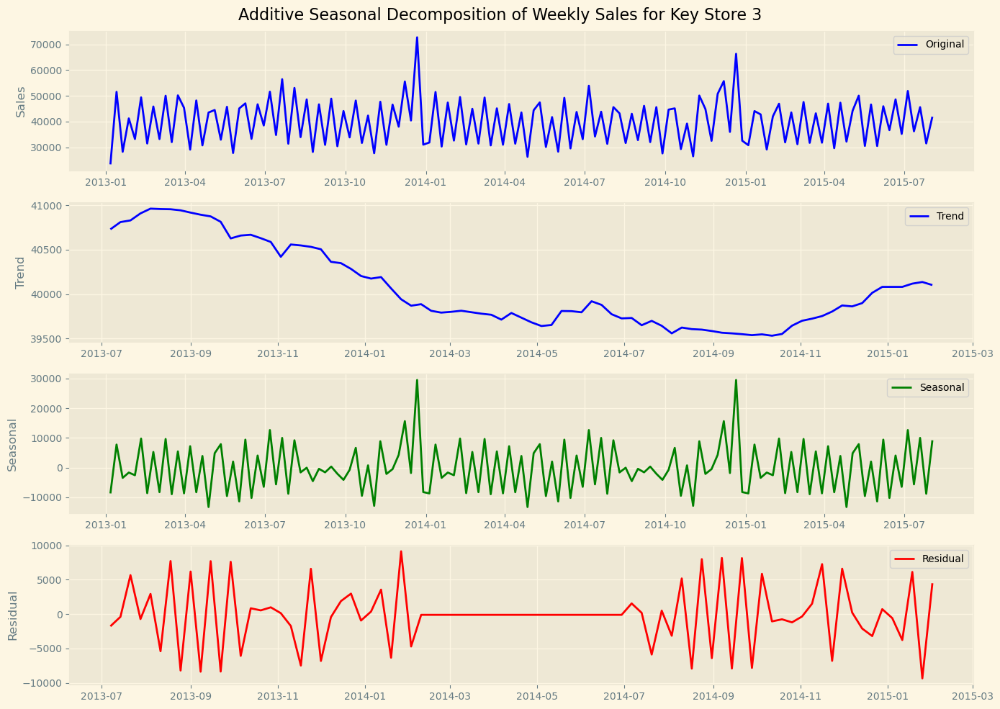

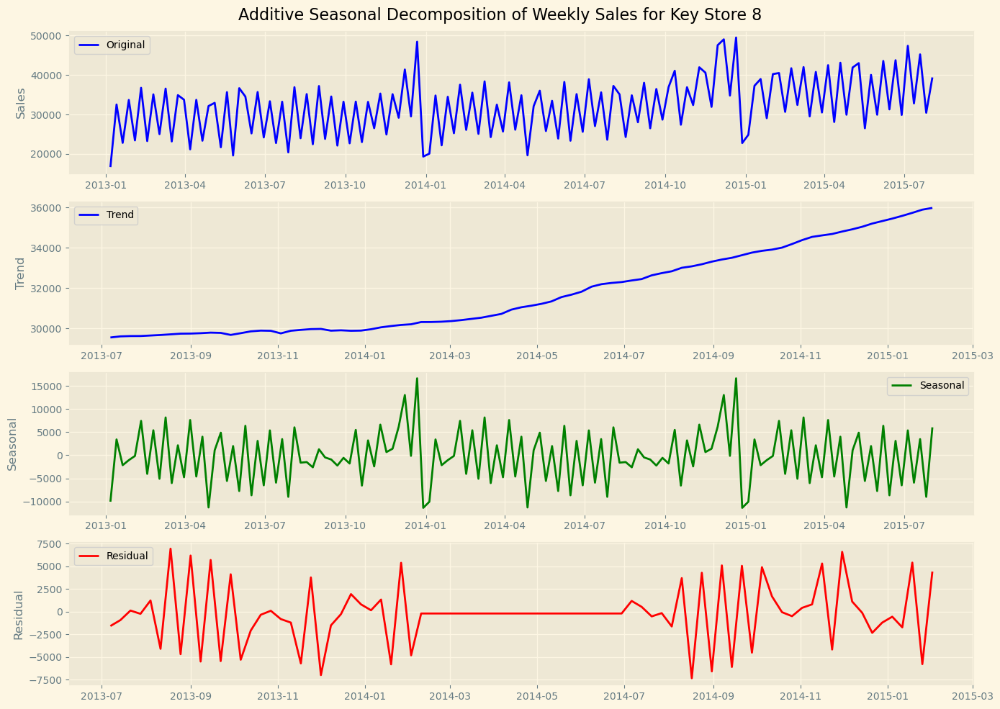

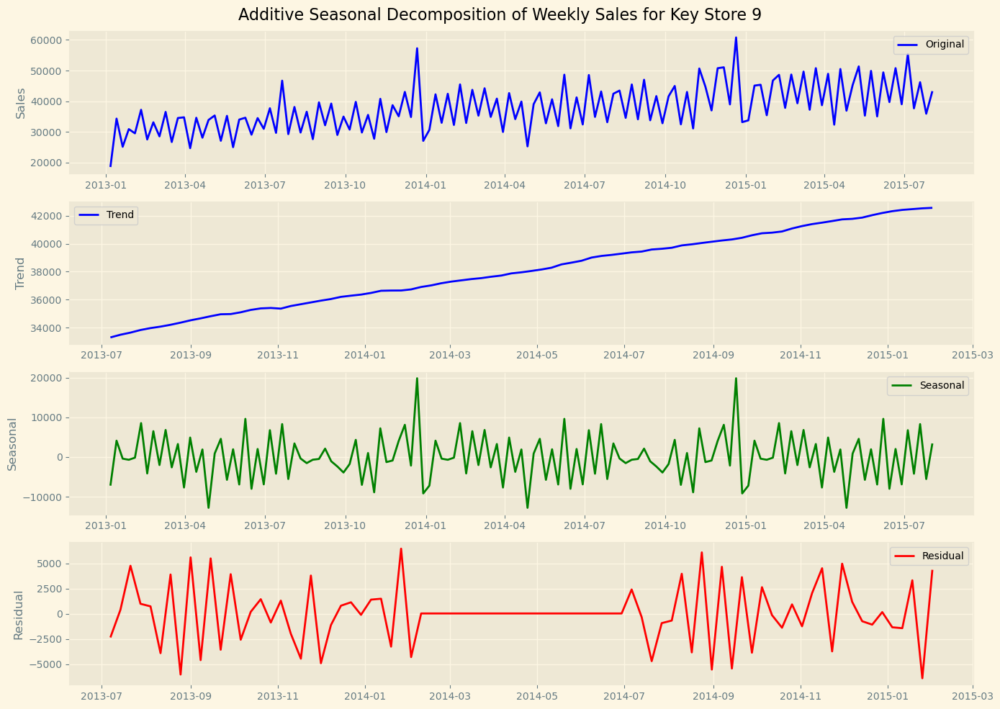

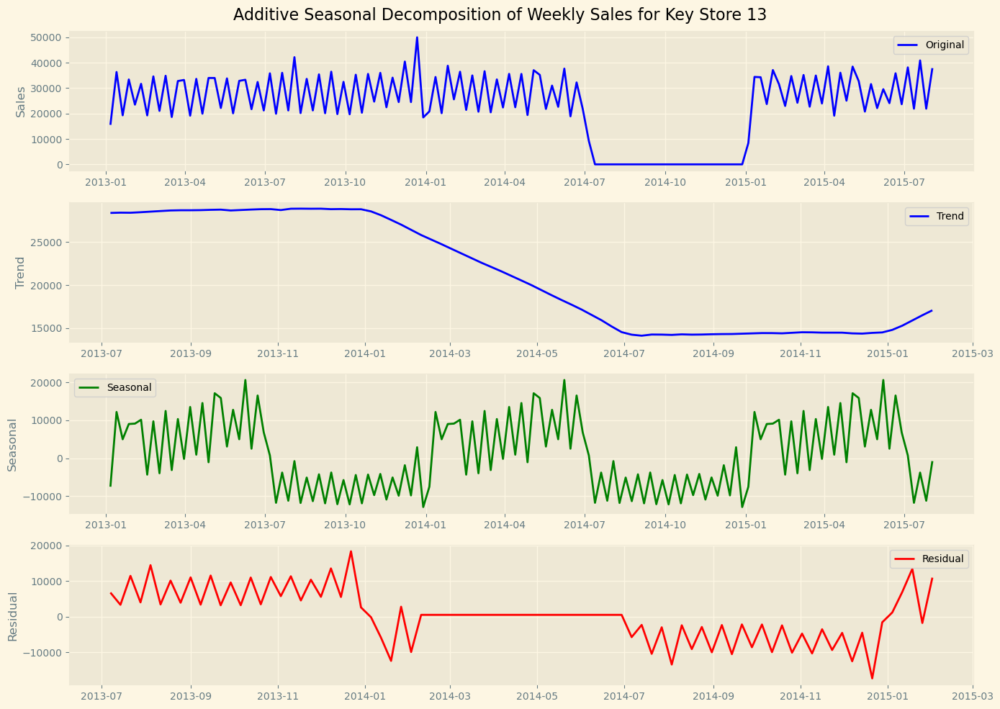

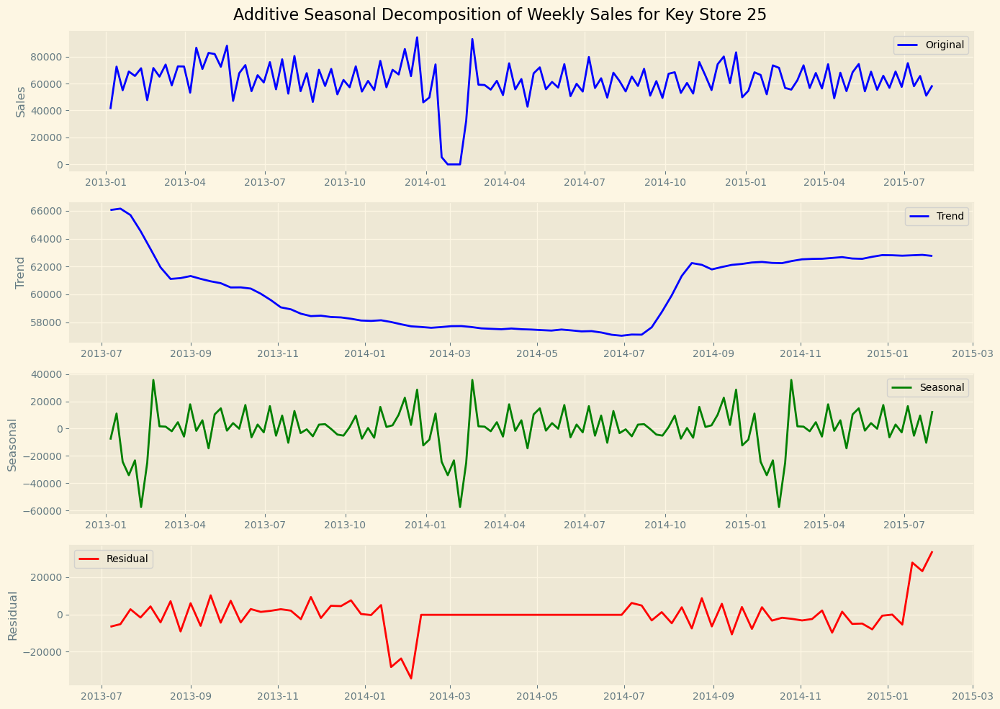

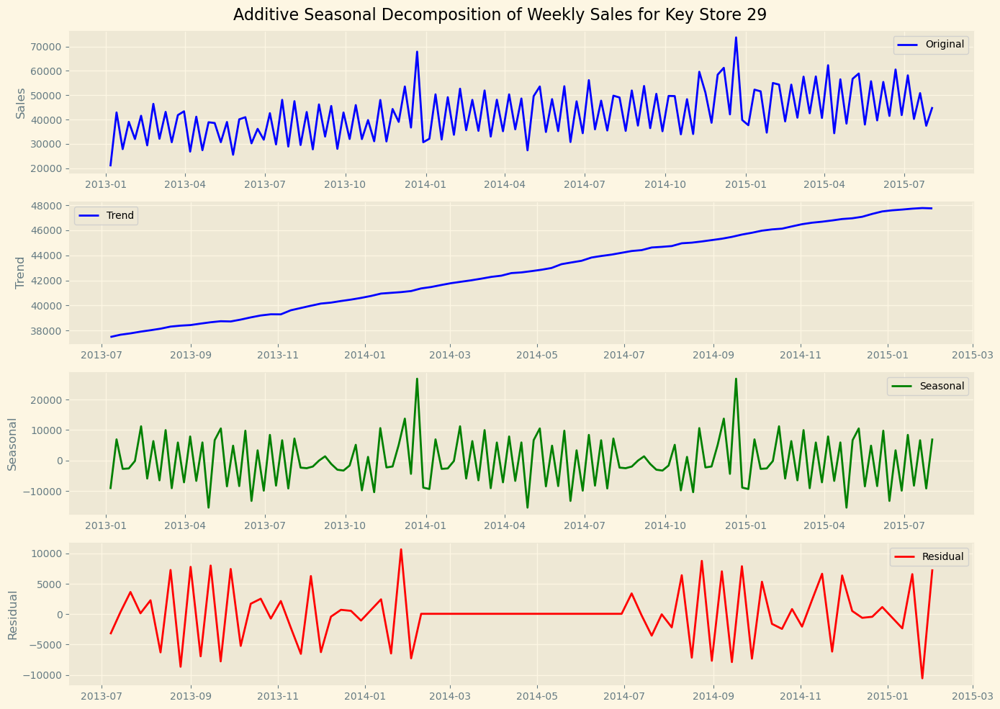

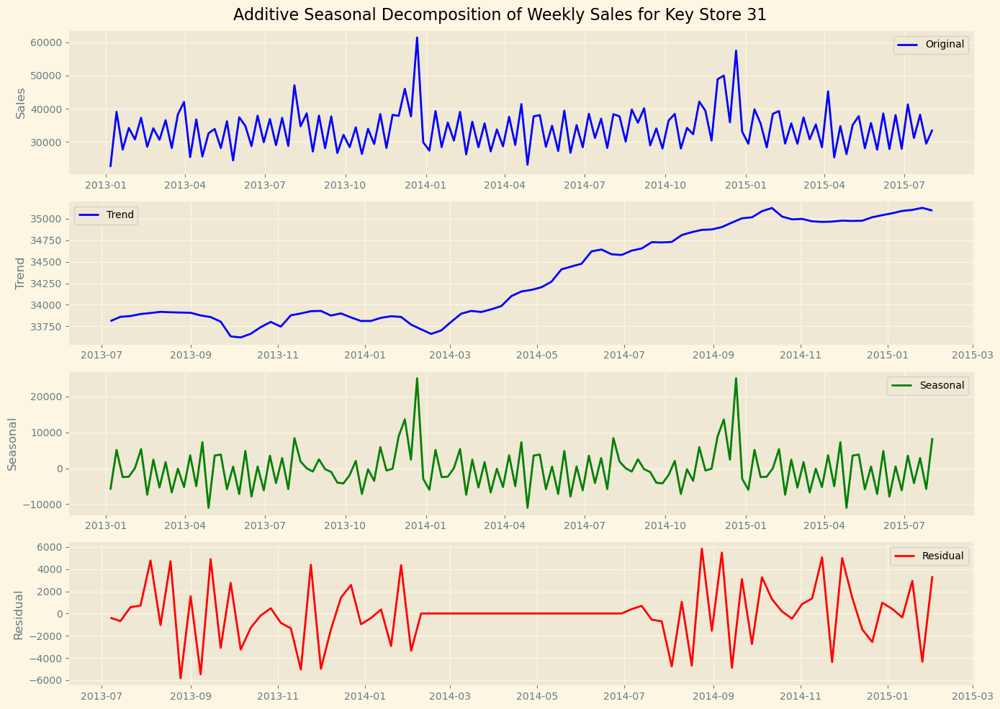

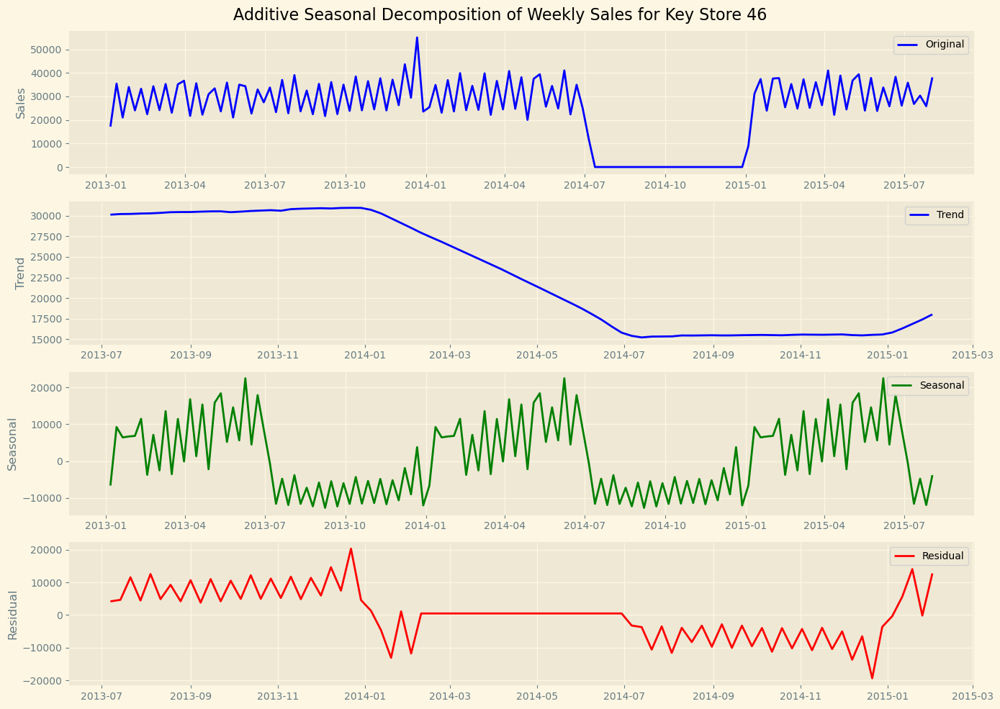

In [41]:
# Performing additive seasonal decomposition
# Ploting the decomposition components (trend, seasonal, residual)

for store in key_stores:
    
    store_data = keystore_Data[store]
    weekly_sales = store_data['Sales'].resample('W').sum()
    
    decomposition = sm.tsa.seasonal_decompose(weekly_sales, model='additive')
    
    fig, ax = plt.subplots(4, 1, figsize=(14, 10))
    
    ax[0].plot(weekly_sales, label='Original', color='blue')
    ax[0].set_ylabel('Sales')
    ax[0].legend()
    
    ax[1].plot(decomposition.trend, label='Trend', color='b')
    ax[1].set_ylabel('Trend')
    ax[1].legend()
    
    ax[2].plot(decomposition.seasonal, label='Seasonal', color='green')
    ax[2].set_ylabel('Seasonal')
    ax[2].legend()
    
    ax[3].plot(decomposition.resid, label='Residual', color='red')
    ax[3].set_ylabel('Residual')
    ax[3].legend()
    
    plt.suptitle(f'Additive Seasonal Decomposition of Weekly Sales for Key Store {store}', fontsize=16)
    plt.tight_layout()
    plt.show()


In [42]:
# Defining function to fill date.

def fill_Dates(data_frame):
    date_range = pd.date_range(data_frame.index.min(), data_frame.index.max())

    data_frame = data_frame.reindex(date_range, fill_value=np.nan)
    data_frame.index.name = 'Date'
    
    return data_frame


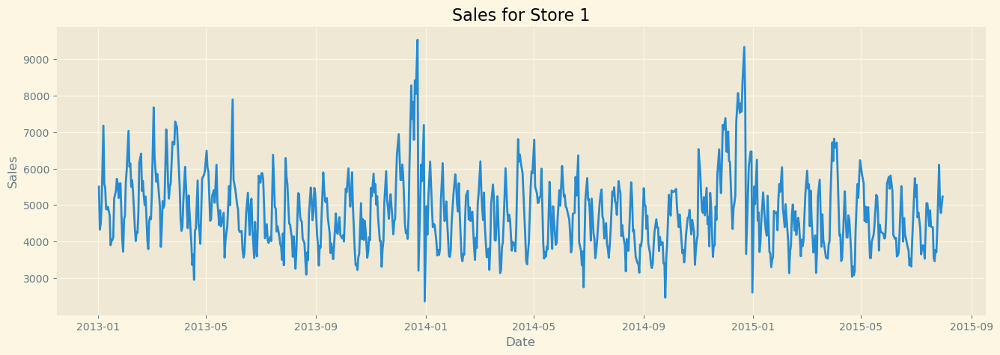

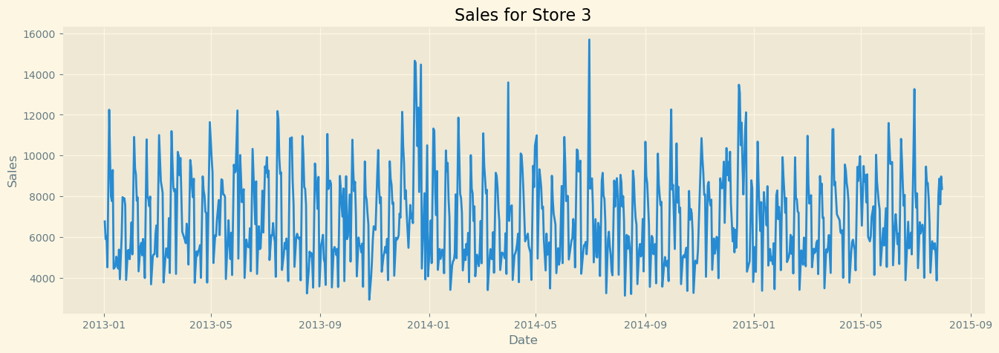

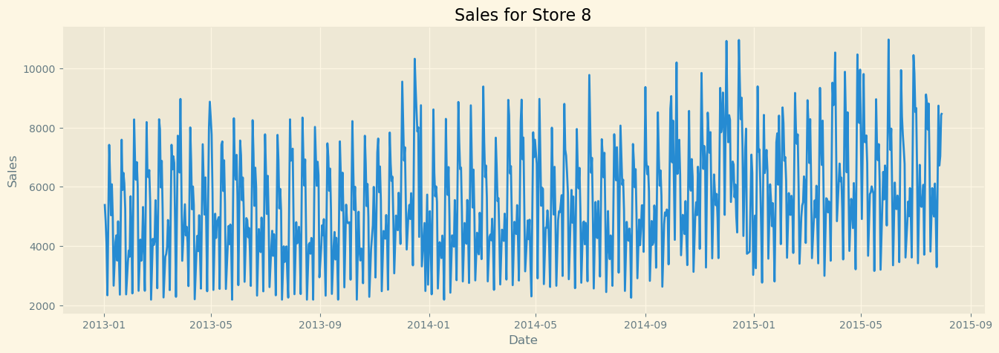

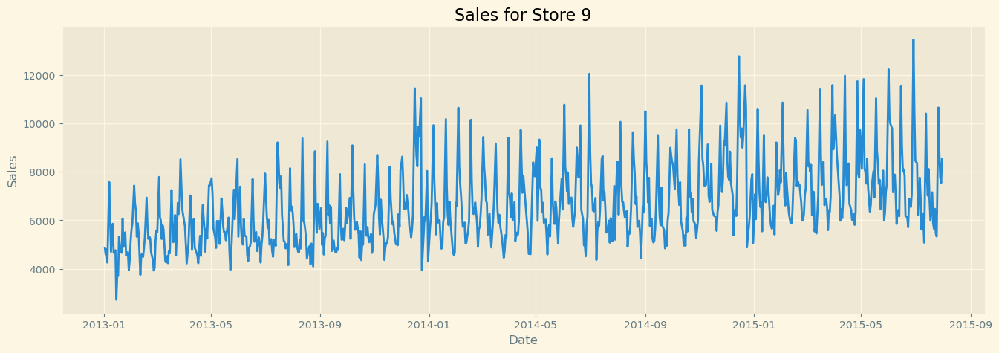

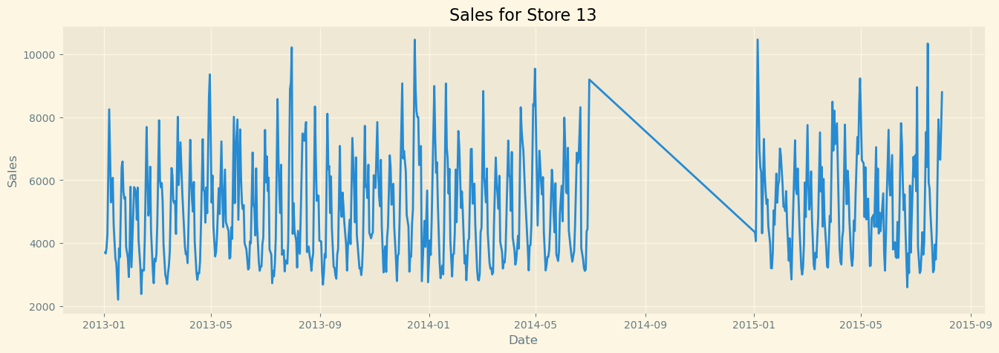

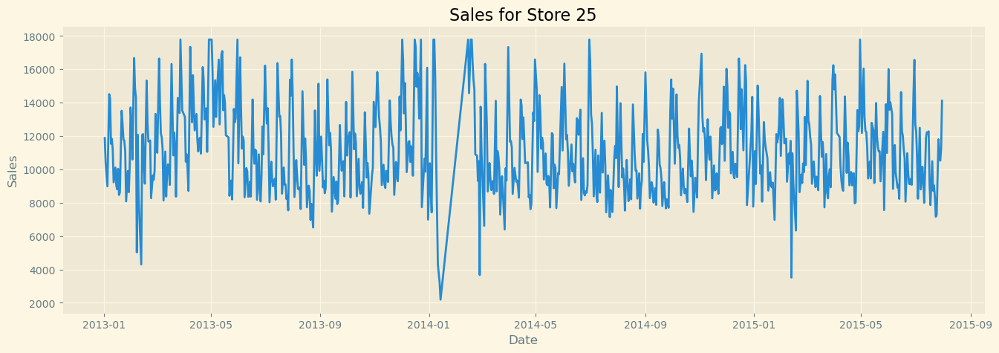

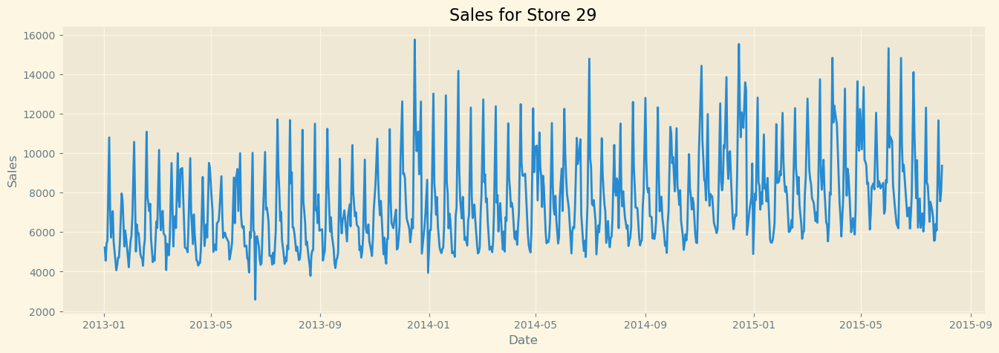

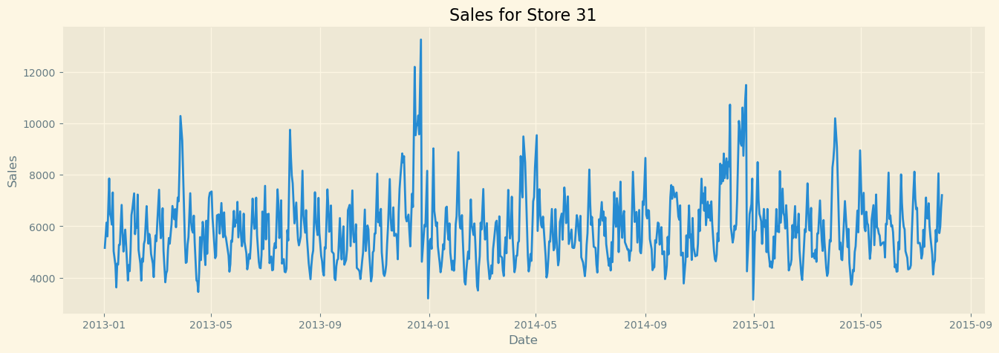

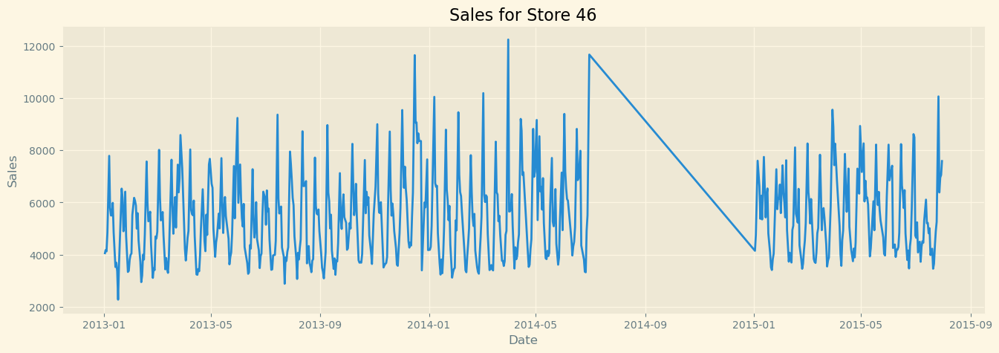

In [43]:
# Apply data filling and interpolation for each store in key_stores

for store in key_stores:
    store_data = keystore_Data[store]
    store_data_filled = fill_Dates(store_data)
    
    store_data_filled['Sales'] = store_data_filled['Sales'].interpolate(method='linear')
    store_data_filled['Customers'] = store_data_filled['Customers'].interpolate(method='linear')
    store_data_filled['SalePerCustomer'] = store_data_filled['SalePerCustomer'].interpolate(method='linear')
    
    plt.figure(figsize=(16, 5))
    plt.plot(store_data_filled.index, store_data_filled['Sales'].astype(float))
    plt.title(f'Sales for Store {store}')
    plt.xlabel('Date')
    plt.ylabel('Sales')
    plt.show()


In [44]:
# imputing data with same date from last year  

def prev_year(data,startdate,enddate,store,column):
    for index, row in data.iterrows():
        if ((pd.isna(row[column]) and (index.strftime("%Y-%m-%d") > startdate) and (index.strftime("%Y-%m-%d") < enddate))):
            dates=pd.to_datetime(index)
            previous_Year_Date=dates- relativedelta(years=1)
            previous_Year_Date= previous_Year_Date.strftime("%Y-%m-%d")
            previous_Year_Data=keystore_Data[store][keystore_Data[store].index==previous_Year_Date][column]
            keystore_Data[store].loc[index.strftime("%Y-%m-%d"), column]=previous_Year_Data.get(previous_Year_Date)

In [45]:
# Computing metrix for the given date range for previous year

prev_year(keystore_Data[13],'2014-07-01','2015-01-02',13,'Sales')    
prev_year(keystore_Data[46],'2014-07-01','2015-01-02',46,'Sales') 
prev_year(keystore_Data[13],'2014-07-01','2015-01-02',13,'Customers')    
prev_year(keystore_Data[46],'2014-07-01','2015-01-02',46,'Customers')    

   

## Stationarity Data Check

In [46]:
# performing ADF test on the Customers variable of key store

Sales_NonStationary = []

def Customer_adfTest(data, store, signif=0.05):
    adf_test = adfuller(data['Customers'], autolag='AIC')
    output = {'test_statistic': round(adf_test[0], 4), 'pvalue': round(adf_test[1], 4), 'n_lags': round(adf_test[2], 4), 'n_obs': adf_test[3]}
    p_value = output['pvalue']
    
    def adjust(val, length=6):
        return str(val).ljust(length)

  
    print('\033[1mADF Test on Store:', store, '\033[0m')
    print(f'Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f'Significance Level    = {signif}')
    print(f'Test Statistic        = {output["test_statistic"]}')
    print(f'No. Lags Chosen       = {output["n_lags"]}')

    for key, val in adf_test[4].items():
        print(f'Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f"=> P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f"=> Series is Stationary.")
    else:
        print(f"=> P-Value = {p_value}. Fail to reject the Null Hypothesis.")
        print(f"=> Series is Non-Stationary.")
        Sales_NonStationary.append(store)
          
    print('\n')


In [47]:
# Printing NonStationary Data

print('NonStationary:',Sales_NonStationary)

NonStationary: []


In [48]:
# Looping each key store and perform ADF test on Customers data

for store in key_stores:
    
    Customer_adfTest(store_data, store)


ADF Test on Store: 1 
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level    = 0.05
Test Statistic        = -5.4437
No. Lags Chosen       = 13
Critical value 1%     = -3.441
Critical value 5%     = -2.866
Critical value 10%    = -2.569
=> P-Value = 0.0. Rejecting Null Hypothesis.
=> Series is Stationary.


ADF Test on Store: 3 
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level    = 0.05
Test Statistic        = -5.4437
No. Lags Chosen       = 13
Critical value 1%     = -3.441
Critical value 5%     = -2.866
Critical value 10%    = -2.569
=> P-Value = 0.0. Rejecting Null Hypothesis.
=> Series is Stationary.


ADF Test on Store: 8 
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level    = 0.05
Test Statistic        = -5.4437
No. Lags Chosen       = 13
Critical value 1%     = -3.441
Critical value 5%     = -2.866
Critical value 10%    = -2.569
=> P-Value = 0.0. Rejecting Null Hypothesis.
=> Series is Stationary.


ADF Test on Stor

## ADF Test Output for Customer

#### After performing ADF test on Customer variable for each store we have found data is Stationary


In [49]:
# performing ADF test on the Sales variable of key stores

Cust_NonStationary = []

def Sales_adfTest(data, store, signif=0.05):
    adf_test = adfuller(data['Sales'], autolag='AIC')
    output = {'test_statistic': round(adf_test[0], 4), 'pvalue': round(adf_test[1], 4), 'n_lags': round(adf_test[2], 4), 'n_obs': adf_test[3]}
    p_value = output['pvalue']
    
    def adjust(val, length=6):
        return str(val).ljust(length)

    
    print('\033[1mADF Test on Store:', store, '\033[0m')
    print(f'Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f'Significance Level    = {signif}')
    print(f'Test Statistic        = {output["test_statistic"]}')
    print(f'No. Lags Chosen       = {output["n_lags"]}')

    for key, val in adf_test[4].items():
        print(f'Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f"=> P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f"=> Series is Stationary.")
    else:
        print(f"=> P-Value = {p_value}. Fail to reject the Null Hypothesis.")
        print(f"=> Series is Non-Stationary.")
        Sales_NonStationary.append(store)
          
    print('\n')


In [50]:
print('NonStationary:',Cust_NonStationary)

NonStationary: []


In [51]:

# Iterate over each key store and perform ADF test on Sales data
for store in key_stores:
    
    Sales_adfTest(store_data, store)


ADF Test on Store: 1 
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level    = 0.05
Test Statistic        = -5.2153
No. Lags Chosen       = 12
Critical value 1%     = -3.441
Critical value 5%     = -2.866
Critical value 10%    = -2.569
=> P-Value = 0.0. Rejecting Null Hypothesis.
=> Series is Stationary.


ADF Test on Store: 3 
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level    = 0.05
Test Statistic        = -5.2153
No. Lags Chosen       = 12
Critical value 1%     = -3.441
Critical value 5%     = -2.866
Critical value 10%    = -2.569
=> P-Value = 0.0. Rejecting Null Hypothesis.
=> Series is Stationary.


ADF Test on Store: 8 
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level    = 0.05
Test Statistic        = -5.2153
No. Lags Chosen       = 12
Critical value 1%     = -3.441
Critical value 5%     = -2.866
Critical value 10%    = -2.569
=> P-Value = 0.0. Rejecting Null Hypothesis.
=> Series is Stationary.


ADF Test on Stor

## ADF Test Output for Sales

#### After performing ADF test on Sales variable for each store we have found data is Stationary


In [52]:
# performing ADF test on the SalePerCustomer variable of key stores


SalesPerCust_NonStationary = []

def SalePerCustomer_adfTest(data, store, signif=0.05):
    adf_test = adfuller(data['SalePerCustomer'], autolag='AIC')
    output = {'test_statistic': round(adf_test[0], 4), 'pvalue': round(adf_test[1], 4), 'n_lags': round(adf_test[2], 4), 'n_obs': adf_test[3]}
    p_value = output['pvalue']
    
    def adjust(val, length=6):
        return str(val).ljust(length)

    # Print Summary
    print('\033[1mADF Test on Store:', store, '\033[0m')
    print(f'Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f'Significance Level    = {signif}')
    print(f'Test Statistic        = {output["test_statistic"]}')
    print(f'No. Lags Chosen       = {output["n_lags"]}')

    for key, val in adf_test[4].items():
        print(f'Critical value {adjust(key)} = {round(val, 3)}')

    if p_value <= signif:
        print(f"=> P-Value = {p_value}. Rejecting Null Hypothesis.")
        print(f"=> Series is Stationary.")
    else:
        print(f"=> P-Value = {p_value}. Fail to reject the Null Hypothesis.")
        print(f"=> Series is Non-Stationary.")
        Sales_NonStationary.append(store)
          
    print('\n')


In [53]:
print('NonStationary:',SalesPerCust_NonStationary)

NonStationary: []


In [54]:

# Iterate over each key store and perform ADF test on Sales data
for store in key_stores:
    
    SalePerCustomer_adfTest(store_data, store)


ADF Test on Store: 1 
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level    = 0.05
Test Statistic        = -4.8811
No. Lags Chosen       = 12
Critical value 1%     = -3.441
Critical value 5%     = -2.866
Critical value 10%    = -2.569
=> P-Value = 0.0. Rejecting Null Hypothesis.
=> Series is Stationary.


ADF Test on Store: 3 
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level    = 0.05
Test Statistic        = -4.8811
No. Lags Chosen       = 12
Critical value 1%     = -3.441
Critical value 5%     = -2.866
Critical value 10%    = -2.569
=> P-Value = 0.0. Rejecting Null Hypothesis.
=> Series is Stationary.


ADF Test on Store: 8 
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level    = 0.05
Test Statistic        = -4.8811
No. Lags Chosen       = 12
Critical value 1%     = -3.441
Critical value 5%     = -2.866
Critical value 10%    = -2.569
=> P-Value = 0.0. Rejecting Null Hypothesis.
=> Series is Stationary.


ADF Test on Stor

## ADF Test Output for SalesPerCustomer

#### After performing ADF test on SalesPerCustomer variable for each store we have found data is Stationary


## Johansen Test

In [55]:
# Defining function for johansen test
def johansen_output(residual,store):
    print("\033[1m Johansen Test for Store: ",store,' \033[0m')
    output = pd.DataFrame([residual.lr2,residual.lr1],
                          index=['max_eig_stat',"trace_stat"])
    print(output.T,'\n')
    print("Critical values(90%, 95%, 99%) of max_eig_stat\n",residual.cvm,'\n')
    print("Critical values(90%, 95%, 99%) of trace_stat\n",residual.cvt,'\n')
    print('\n')

In [56]:
# ploting result of the Johansen test function defined earlier

for store in keystore_Data:
    
    joh_model1 = coint_johansen(keystore_Data[store][['Sales','Customers']],0,15)
    johansen_output(joh_model1,store)

 Johansen Test for Store:  1  
   max_eig_stat  trace_stat
0     44.778591   52.447477
1      7.668886    7.668886 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for Store:  3  
   max_eig_stat  trace_stat
0     41.906861   67.530410
1     25.623549   25.623549 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for Store:  8  
   max_eig_stat  trace_stat
0     38.260331   48.414746
1     10.154415   10.154415 

Critical values(90%, 95%, 99%) of max_eig_stat
 [[12.2971 14.2639 18.52  ]
 [ 2.7055  3.8415  6.6349]] 

Critical values(90%, 95%, 99%) of trace_stat
 [[13.4294 15.4943 19.9349]
 [ 2.7055  3.8415  6.6349]] 



 Johansen Test for 

### Output for Johansen test

- Stores 1 and 3 show strong evidence of cointegration, suggesting a stable long-term relationship between sales and customer variables.
- Other stores exhibit moderate levels of cointegration, indicating a relatively stable relationship but potentially with some variability.


## Grangers Causality Test

In [57]:
#Grangers Causality Test
from statsmodels.tsa.stattools import grangercausalitytests
maxlag=30
test = 'ssr_chi2test'
def grangers_causation_matrix(data, variables,store, test='ssr_chi2test', verbose=False):    
    print("\033[1m Grangers Causality Test for Store: ",store,'\033[0m')

    df = pd.DataFrame(np.zeros((len(variables), len(variables))), columns=variables, index=variables)
    for c in df.columns:
        for r in df.index:
            test_result = grangercausalitytests(data[[r, c]], maxlag=maxlag, verbose=False)
            p_values = [round(test_result[i+1][0][test][1],4) for i in range(maxlag)]
            if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')
            min_p_value = np.min(p_values)
            df.loc[r, c] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    print(df)
    print('\n')

In [58]:
# ploting result of the Grangers Causality Test function defined earlier

for store in keystore_Data:
    grangers_causation_matrix(keystore_Data[store], variables = keystore_Data[store][['Customers','Sales','SalePerCustomer']].columns,store=store)

 Grangers Causality Test for Store:  1 
                   Customers_x  Sales_x  SalePerCustomer_x
Customers_y                1.0   0.0000                0.0
Sales_y                    0.0   1.0000                0.0
SalePerCustomer_y          0.0   0.0001                1.0


 Grangers Causality Test for Store:  3 
                   Customers_x  Sales_x  SalePerCustomer_x
Customers_y                1.0      0.0                0.0
Sales_y                    0.0      1.0                0.0
SalePerCustomer_y          0.0      0.0                1.0


 Grangers Causality Test for Store:  8 
                   Customers_x  Sales_x  SalePerCustomer_x
Customers_y                1.0      0.0                0.0
Sales_y                    0.0      1.0                0.0
SalePerCustomer_y          0.0      0.0                1.0


 Grangers Causality Test for Store:  9 
                   Customers_x  Sales_x  SalePerCustomer_x
Customers_y                1.0      0.0                0.0
Sales_y 

### Output for Grangers Causality Test
- Across most stores, there is no evidence of Granger causality between Customers and Sales, suggesting that the past values of one variable do not significantly influence the other.
- Store 13 shows a unique result where past values of Sales appear to Granger-cause Customers at a relatively low significance level.
- The SalePerCustomer variable generally does not exhibit Granger causality with Customers or Sales across the stores, except for minor effects observed in Store 13.

## Creating Train-Test Split 

In [59]:
# Getting the train lenght and test lenght
# Resampling the 9 stores data week-wise:
# Creating a new dictionary for train-test

train_len = int((keystore_Data[1].resample('W').sum().shape[0]) - 7)

traintest = {}
for key, store in keystore_Data.items(): 
    store = store.resample('W').sum() 
    train = store[:train_len]
    test = store[train_len:-1]
    traintest[key] = {'train': train, 'test': test}  # Assign 'train' and 'test' keys
    


In [60]:
# Print the structure of traintest
for key, value in traintest.items():
    print(f"Store {key}:")
    print(f"  - Train data shape: {value['train'].shape if 'train' in value else None}")
    print(f"  - Test data shape: {value['test'].shape if 'test' in value else None}")
        

Store 1:
  - Train data shape: (128, 17)
  - Test data shape: (6, 17)
Store 3:
  - Train data shape: (128, 17)
  - Test data shape: (6, 17)
Store 8:
  - Train data shape: (128, 17)
  - Test data shape: (6, 17)
Store 9:
  - Train data shape: (128, 17)
  - Test data shape: (6, 17)
Store 13:
  - Train data shape: (128, 17)
  - Test data shape: (6, 17)
Store 25:
  - Train data shape: (128, 17)
  - Test data shape: (6, 17)
Store 29:
  - Train data shape: (128, 17)
  - Test data shape: (6, 17)
Store 31:
  - Train data shape: (128, 17)
  - Test data shape: (6, 17)
Store 46:
  - Train data shape: (128, 17)
  - Test data shape: (6, 17)



## Applying Holt-Winter's

In [61]:
# Function to perform Holt-Winter's for timeseriese data set

holtwinter_df = {}

def holtwinter(data, x):
    model = ExponentialSmoothing(np.asarray(data['train']['Sales']),
                                 seasonal_periods=12, trend='add', seasonal='add')
    model_fit = model.fit(optimized=True)
    print(model_fit.params)

    hw = data['test']['Sales'].copy()
    hw = pd.DataFrame(hw, index=data['test'].index)
    hw['hw_forecast'] = model_fit.forecast(len(data['test']['Sales']))

    holtwinter_df[x] = hw[['hw_forecast']]

    plt.figure(figsize=(14, 4))
    plt.plot(data['train']['Sales'], label='Train')
    plt.plot(data['test']['Sales'], label='Test')
    plt.plot(hw['hw_forecast'], label="Holt Winter's additive forecast")
    plt.legend(loc='best')
    plt.title("Holt Winter's for Store " + str(x))
    plt.show()


{'smoothing_level': 0.14642857142857144, 'smoothing_trend': 0.026623376623376625, 'smoothing_seasonal': 0.06565934065934066, 'damping_trend': nan, 'initial_level': 31745.61944444443, 'initial_trend': -281.0232323232308, 'initial_seasons': array([ 4415.57204861, -3146.10503472,  5843.95746528, -4453.77170139,
         937.71788194, -1912.16753472,  -509.78211806,  -571.79253472,
       -1485.62586806,  -286.94878472,  1220.63454861,   -51.68836806]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


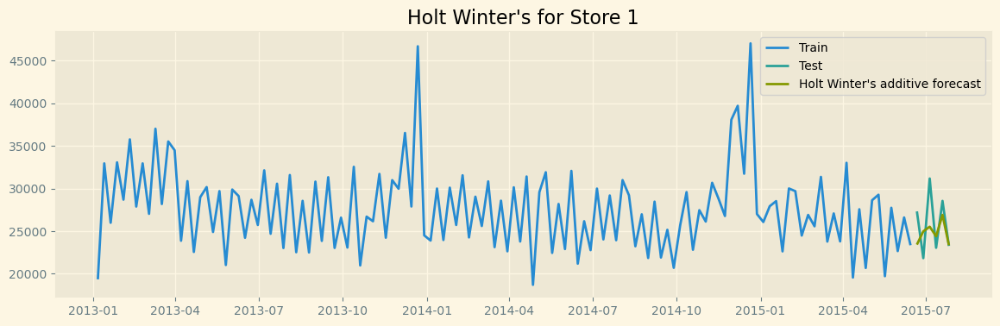

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.005, 'smoothing_trend': 0.005, 'smoothing_seasonal': 0.10660714285714287, 'damping_trend': nan, 'initial_level': 40141.194444444416, 'initial_trend': 12.192676767679131, 'initial_seasons': array([ 7955.34027778, -6602.34722222, 12981.20486111, -8607.10763889,
        3828.57986111, -1351.27430556,  -411.99305556, -2287.00347222,
       -1621.26388889, -2724.70138889,  1922.45486111, -3081.88888889]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


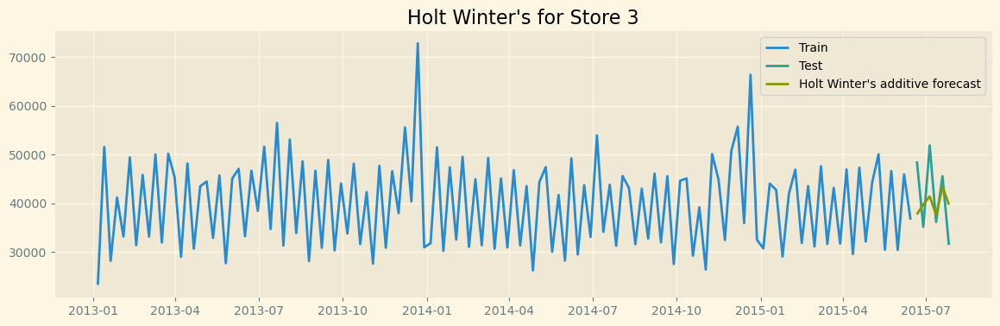

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.040357142857142855, 'smoothing_trend': 0.040357142857142855, 'smoothing_seasonal': 0.10281887755102041, 'damping_trend': nan, 'initial_level': 29667.788888888877, 'initial_trend': -34.39191919191762, 'initial_seasons': array([ 6695.15798611, -5397.51909722,  7553.58506944, -7617.19618056,
          -9.58159722, -1936.28993056,  -583.43576389,   745.51215278,
       -1037.95659722,   227.40798611,  2775.23090278, -1414.91493056]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


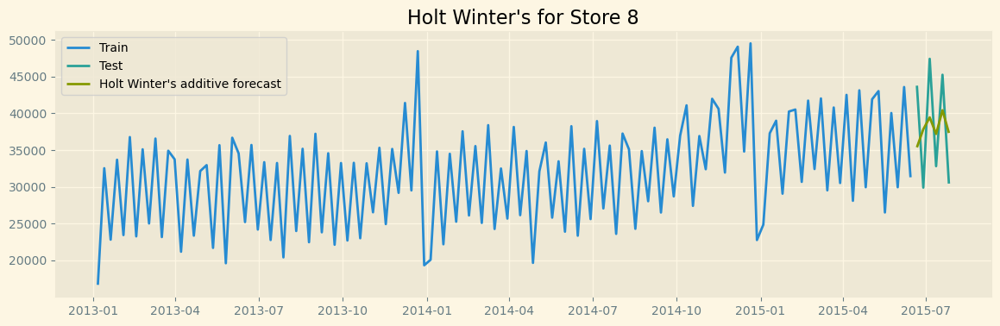

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.040357142857142855, 'smoothing_trend': 0.032285714285714286, 'smoothing_seasonal': 0.06854591836734694, 'damping_trend': nan, 'initial_level': 31091.724999999984, 'initial_trend': 50.316666666669335, 'initial_seasons': array([ 4031.01128472, -4116.28038194,  7001.50086806, -5364.45746528,
        3331.51128472,  -422.24913194,  -732.35329861, -1587.41579861,
        -681.48871528, -1676.36371528,  1240.88628472, -1024.30121528]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


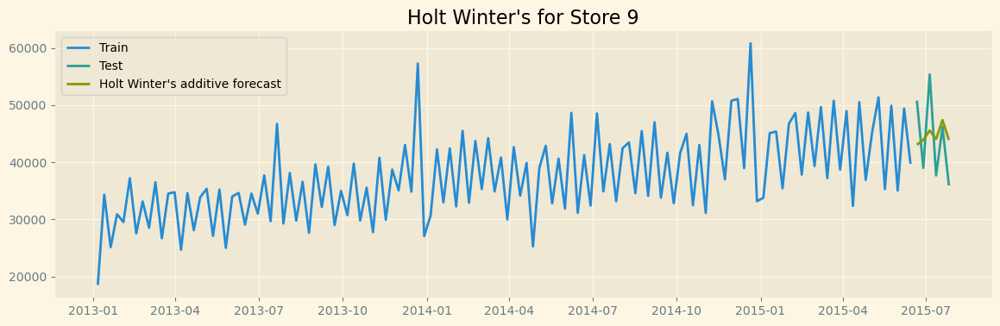

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.28785714285714287, 'smoothing_trend': 0.0001, 'smoothing_seasonal': 0.1186904761904762, 'damping_trend': nan, 'initial_level': 27237.42499999999, 'initial_trend': 86.19242424242657, 'initial_seasons': array([ 7164.48697917, -7363.35677083,  9361.95572917, -9167.3359375 ,
        2807.15364583, -1306.91927083,  1684.8203125 ,    67.6015625 ,
        -761.8671875 ,  -765.59635417,  1928.79947917, -3649.7421875 ]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


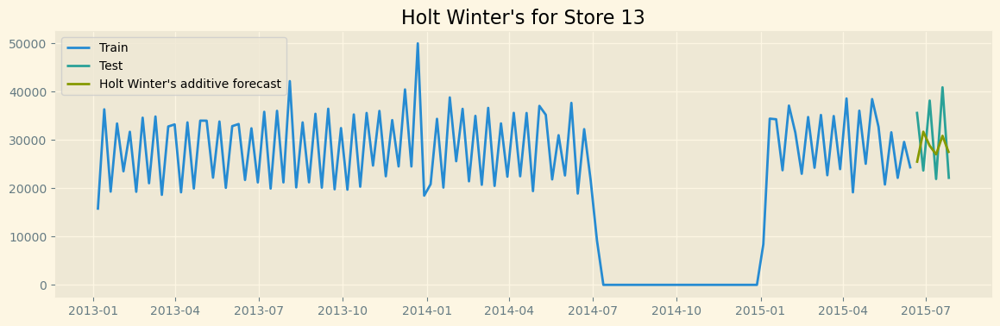

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.2525, 'smoothing_trend': 0.018035714285714287, 'smoothing_seasonal': 0.029900000000000003, 'damping_trend': nan, 'initial_level': 63857.00555555553, 'initial_trend': 915.2262626262655, 'initial_seasons': array([ 6330.14496528, -8433.05295139, 14962.23871528, -5983.68836806,
        8386.40538194,  3325.33246528, -1919.61545139,  -691.31336806,
       -4093.95920139, -7118.09461806,   142.76996528, -4907.16753472]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


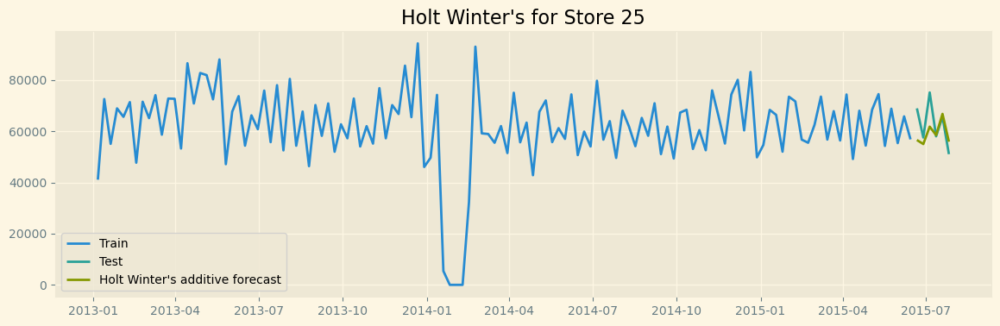

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.040357142857142855, 'smoothing_trend': 0.040357142857142855, 'smoothing_seasonal': 0.10281887755102041, 'damping_trend': nan, 'initial_level': 37119.7611111111, 'initial_trend': -112.6838383838367, 'initial_seasons': array([ 6585.90885417, -7323.33072917, 10447.65885417, -8315.80989583,
        2803.12760417, -1114.54947917,  -146.8203125 ,  -765.70572917,
        -439.77864583, -2462.0390625 ,  2668.01302083, -1936.67447917]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


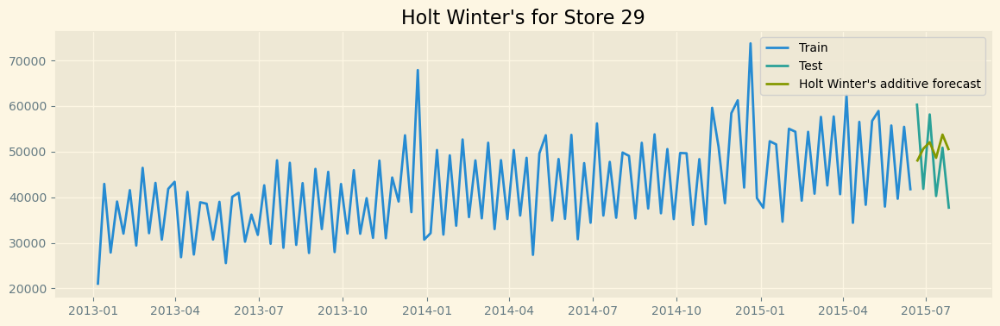

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.07571428571428572, 'smoothing_trend': 0.010816326530612248, 'smoothing_seasonal': 0.1026984126984127, 'damping_trend': nan, 'initial_level': 33476.23333333332, 'initial_trend': -94.78712121211993, 'initial_seasons': array([ 6844.96875   , -4145.16666667,  7724.8125    , -5861.44791667,
       -1202.32291667, -1982.07291667,  1177.86458333,   127.44791667,
        -811.70833333, -1806.6875    ,   719.08333333,  -784.77083333]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


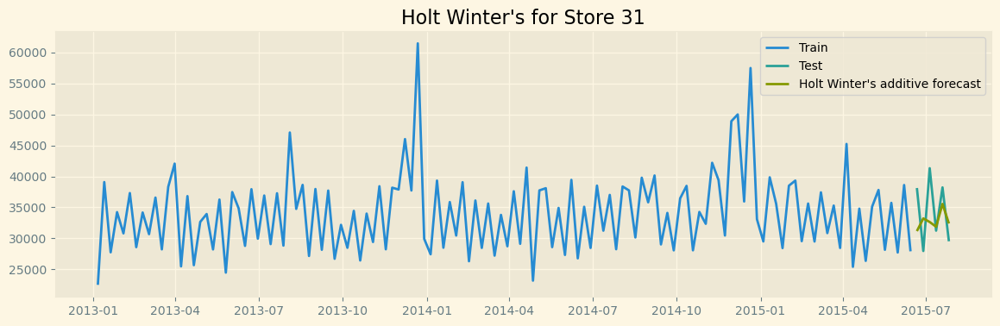

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


{'smoothing_level': 0.32321428571428573, 'smoothing_trend': 0.0001, 'smoothing_seasonal': 0.08827639751552795, 'damping_trend': nan, 'initial_level': 29175.899999999987, 'initial_trend': 54.6810606060626, 'initial_seasons': array([ 6890.14149306, -5192.45225694,  9349.67274306, -7298.82725694,
        2343.43315972, -1805.49392361,   666.87065972,  -363.13975694,
       -1393.09809028, -1292.85850694,  2063.64149306, -3967.88975694]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


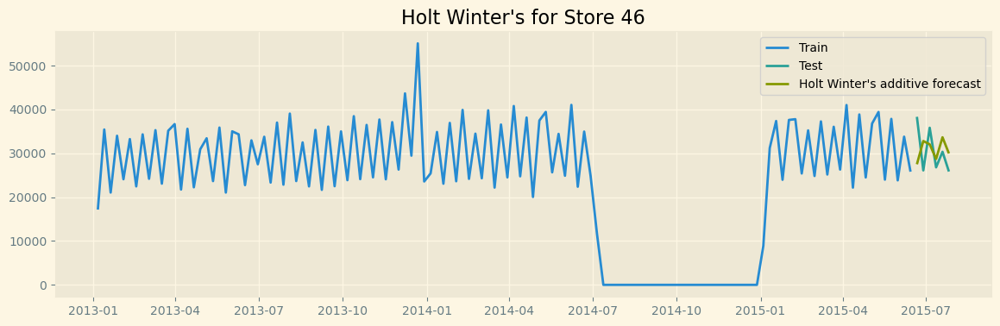

In [62]:
# Performing Holt-Winter's exponential smoothing forecasting for each store and visualize the results

for key in traintest.keys():
    holtwinter(traintest[key], key)


In [63]:
# Calculating evaluation metrics (RMSE, MAPE, Accuracy) for Holt-Winter's forecasts generated for each store.

results = pd.DataFrame(columns=['Method', 'RMSE', 'MAPE', 'Accuracy'])

for key in holtwinter_df.keys():
    if key in traintest:
        rmse = np.sqrt(mean_squared_error(y_true=traintest[key]['test']['Sales'], 
                                           y_pred=holtwinter_df[key]['hw_forecast'])).round(2)
        mape = np.round(np.mean(np.abs(traintest[key]['test']['Sales'] - holtwinter_df[key]['hw_forecast']) / 
                                traintest[key]['test']['Sales']) * 100, 2)
        acc = 100 - mape
        temp = pd.DataFrame({'Method': ["Holt Winters' for Store " + str(key)], 
                             'MAPE': [mape], 'RMSE': [rmse], 'Accuracy': [acc]})
        results = pd.concat([results, temp], ignore_index=True)

holtwinter_results = results[['Method', 'RMSE', 'MAPE', 'Accuracy']]
holtwinter_results

,Method,RMSE,MAPE,Accuracy
0,Holt Winters' for Store 1,3206.20,9.81,90.19
1,Holt Winters' for Store 3,7352.17,15.15,84.85
2,Holt Winters' for Store 8,6917.02,18.21,81.79
3,Holt Winters' for Store 9,6897.89,14.52,85.48
4,Holt Winters' for Store 13,8363.98,26.72,73.28
5,Holt Winters' for Store 25,7773.71,8.70,91.30
6,Holt Winters' for Store 29,9308.02,18.87,81.13
7,Holt Winters' for Store 31,5279.46,12.80,87.20
8,Holt Winters' for Store 46,5882.96,16.40,83.60


## Output for Holt-Winter's

- Stores 1 and 25 demonstrate relatively good forecasting accuracy with low MAPE and high accuracy scores.
- Store 13 exhibits the highest MAPE (26.72%) and lowest accuracy (73.28%), indicating less accurate forecasting compared to other stores.
- RMSE values vary across stores, with some stores having higher forecasting errors compared to others.

#### Checking uniqueness in SchoolHoliday and StateHoliday

In [64]:
# checking if there is uniqueness in SchoolHoliday and StateHoliday
for store in key_stores:
    
    State_Holiday=keystore_Data[store]['StateHoliday'].unique()
    School_Holiday=keystore_Data[store]['SchoolHoliday'].unique()
    print('Unique Values for StateHoliday for Store',store,": ",len(State_Holiday))
    print('Unique Values for SchoolHoliday for for Store ',store,': ',len(School_Holiday))
    print('\n')

Unique Values for StateHoliday for Store 1 :  1
Unique Values for SchoolHoliday for for Store  1 :  2


Unique Values for StateHoliday for Store 3 :  1
Unique Values for SchoolHoliday for for Store  3 :  2


Unique Values for StateHoliday for Store 8 :  1
Unique Values for SchoolHoliday for for Store  8 :  2


Unique Values for StateHoliday for Store 9 :  1
Unique Values for SchoolHoliday for for Store  9 :  2


Unique Values for StateHoliday for Store 13 :  1
Unique Values for SchoolHoliday for for Store  13 :  2


Unique Values for StateHoliday for Store 25 :  1
Unique Values for SchoolHoliday for for Store  25 :  2


Unique Values for StateHoliday for Store 29 :  1
Unique Values for SchoolHoliday for for Store  29 :  2


Unique Values for StateHoliday for Store 31 :  1
Unique Values for SchoolHoliday for for Store  31 :  2


Unique Values for StateHoliday for Store 46 :  1
Unique Values for SchoolHoliday for for Store  46 :  2




#### StateHoliday have 1 value hence we will use SchoolHoliday for prediction

## PACF and ACF

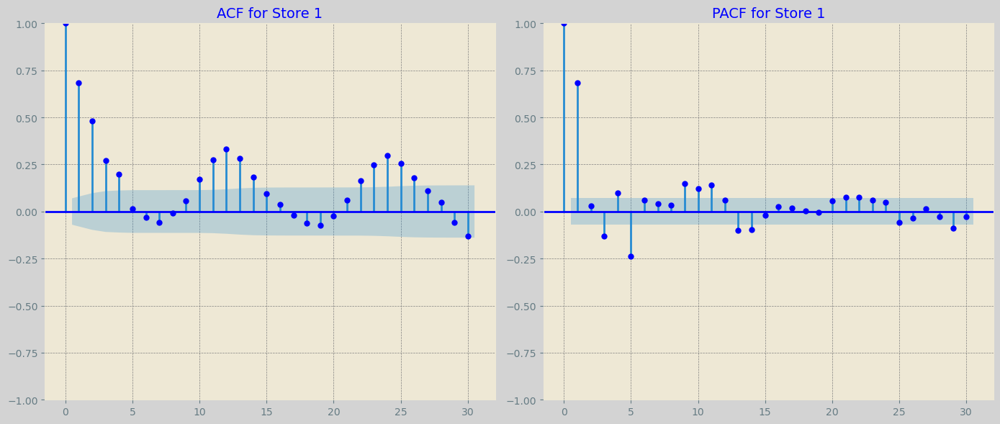

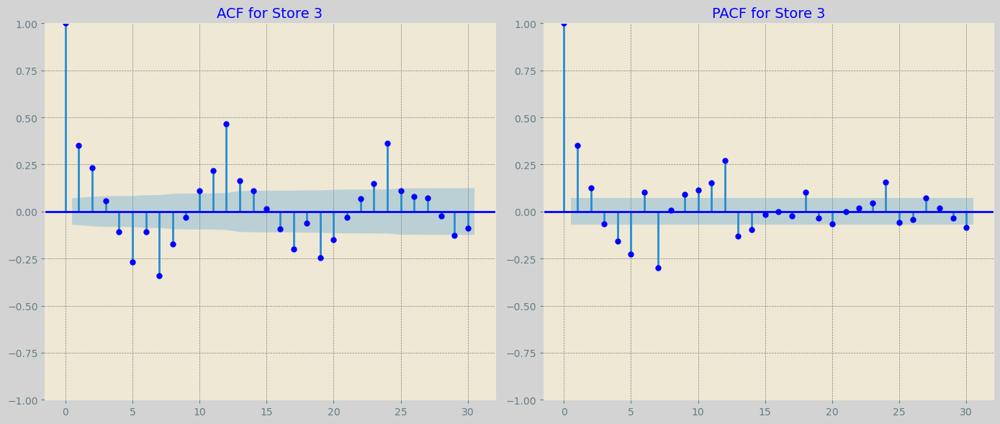

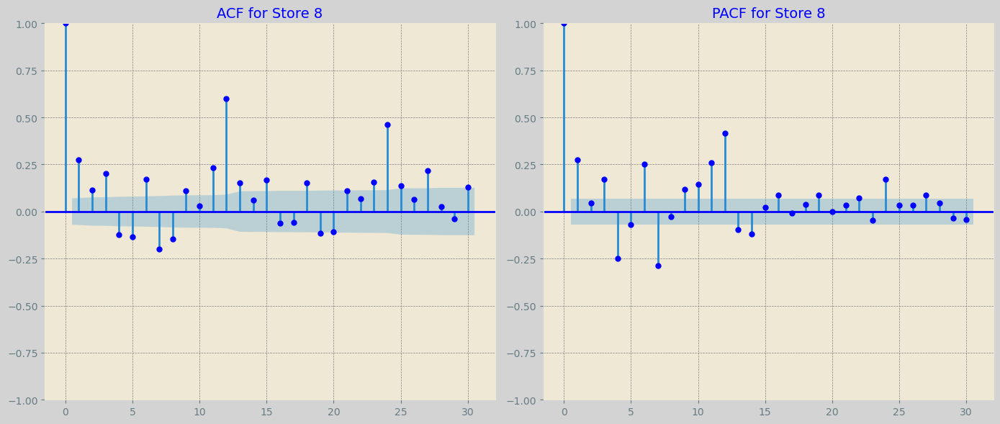

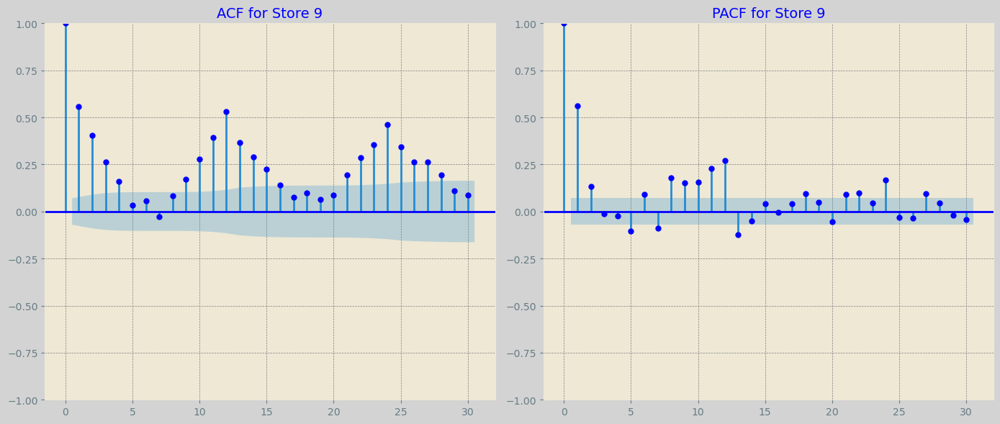

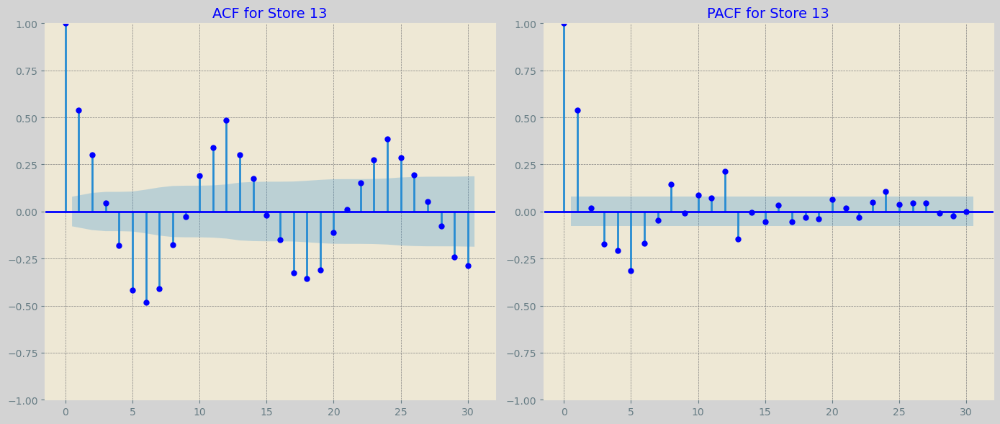

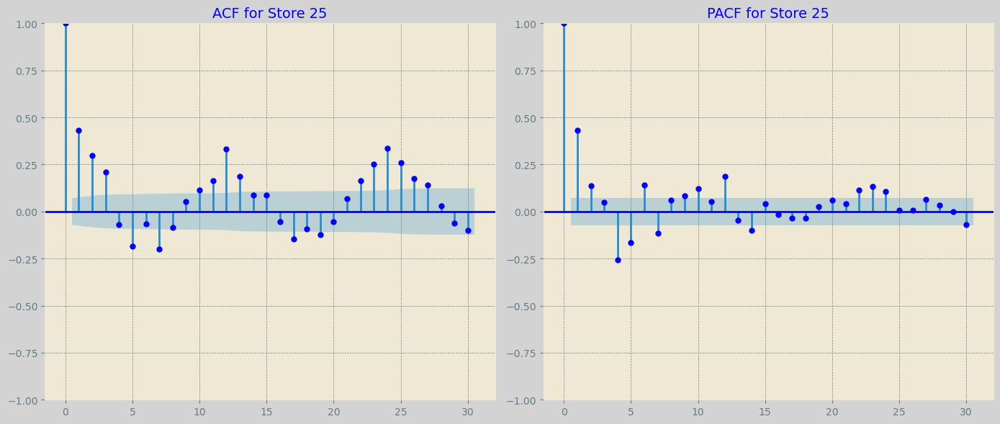

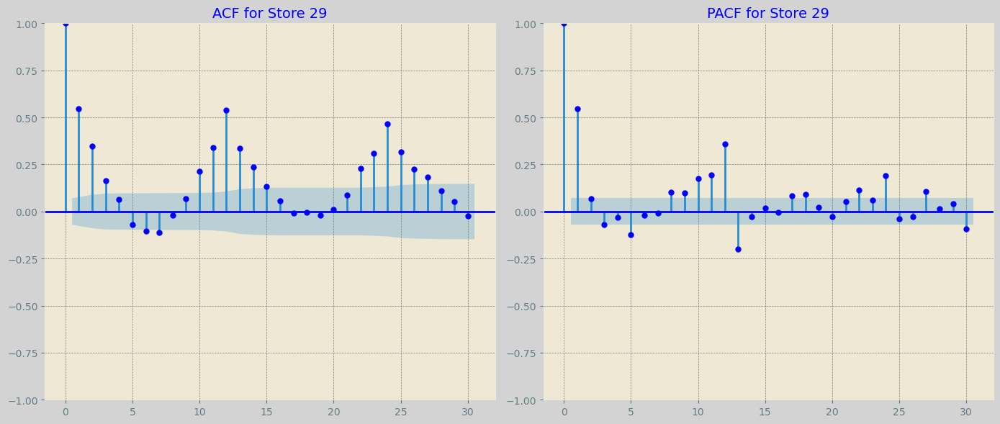

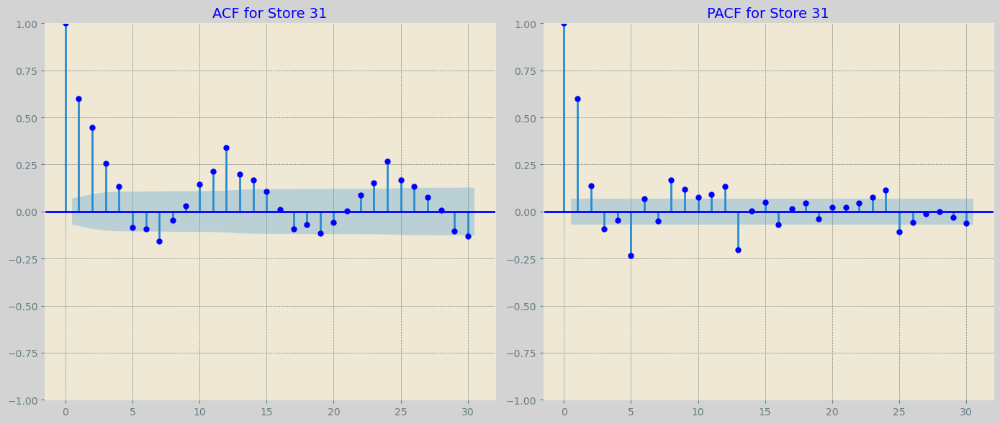

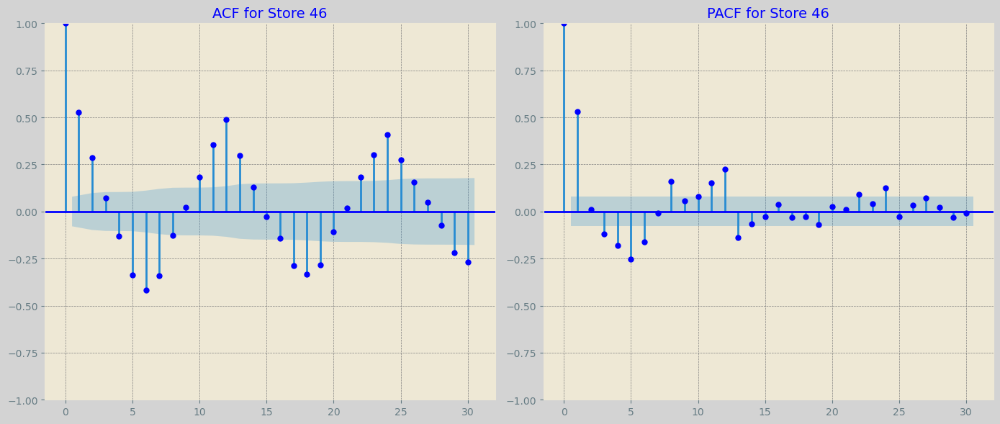

In [65]:
# Ploting ACF PACF for each Store
def acf_pacf(data):
    for key, store in data.items():
        plt.figure(figsize=(14, 6), facecolor='lightgrey')

        # Ploting ACF for each Store
        plt.subplot(1, 2, 1)
        plot_acf(store['Sales'], ax=plt.gca(), lags=30, color='b')
        plt.title(f'ACF for Store {key}', fontsize=14, color='b')
        plt.grid(True, linestyle='--', linewidth=0.5, color='grey')

        # Ploting PACF for each store
        plt.subplot(1, 2, 2)
        plot_pacf(store['Sales'], ax=plt.gca(), lags=30, color='b')
        plt.title(f'PACF for Store {key}', fontsize=14, color='b')
        plt.grid(True, linestyle='--', linewidth=0.5, color='grey')
        
        
        plt.tight_layout() 
        plt.show()

acf_pacf(keystore_Data)


## VARMAX Model

In [66]:
# Defining functions for VARMAX model for forecasting against actual value.

def varmax_model(data, key, p, q, exog, hasTrend='n', printStats=False):
    exog_data = data[key]['train'][exog]
    endog_data = data[key]['train'][['Sales', 'Customers']]
    mod = sm.tsa.VARMAX(endog_data, order=(p, q), trend=hasTrend, exog=exog_data)
    res = mod.fit(maxiter=1000, disp=False)
    if printStats:
        print(res.summary())
    return mod, res

def predict_varmax(data, key, mod, res, exog):
    start_idx = data[key]['test'].index.min()
    end_idx = data[key]['test'].index.max()
    exog_data = data[key]['test'][exog]
    predictions = res.predict(start=start_idx, end=end_idx, exog=exog_data)
    data[key]['predictions_varmax'] = predictions
    return predictions

def plot_pred_varmax(data, key, res, model_name='VARMAX'):
    plt.figure(figsize=(15, 5))
    plt.plot(data[key]['train']['Sales'], label='Train')
    plt.plot(data[key]['test']['Sales'], label='Test')
    plt.plot(data[key]['predictions_varmax']['Sales'], label='VARMAX Prediction')
    plt.legend(loc='best')
    plt.title(f"{model_name} Model - Sales of Store {key}")
    plt.show()

def varmax_model_metrics(data, key, model_name):
    rmse = np.sqrt(mean_squared_error(data[key]['test']['Sales'], data[key]['predictions_varmax']['Sales'])).round(2)
    mape = np.round(np.mean(np.abs(data[key]['test']['Sales'] - data[key]['predictions_varmax']['Sales']) / data[key]['test']['Sales']) * 100, 2)
    acc = 100 - mape
    temp = pd.DataFrame({'Method': [f"{model_name} for Store {key}"], 'MAPE': [mape], 'RMSE': [rmse], 'Accuracy': [acc]})
    return temp


C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


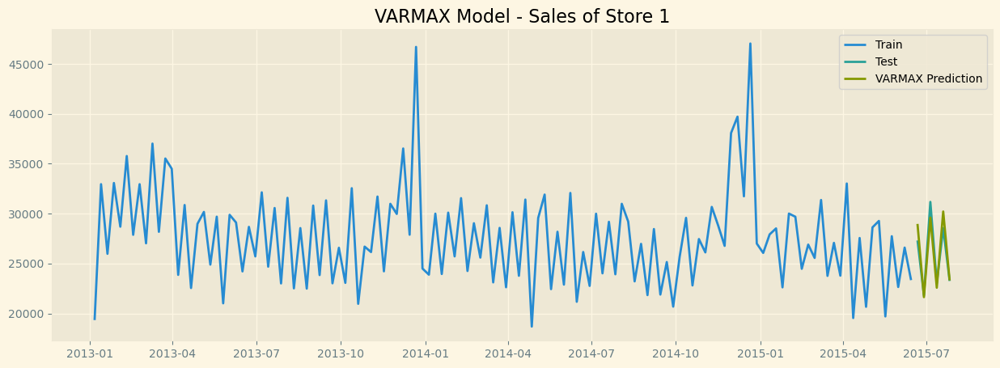

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


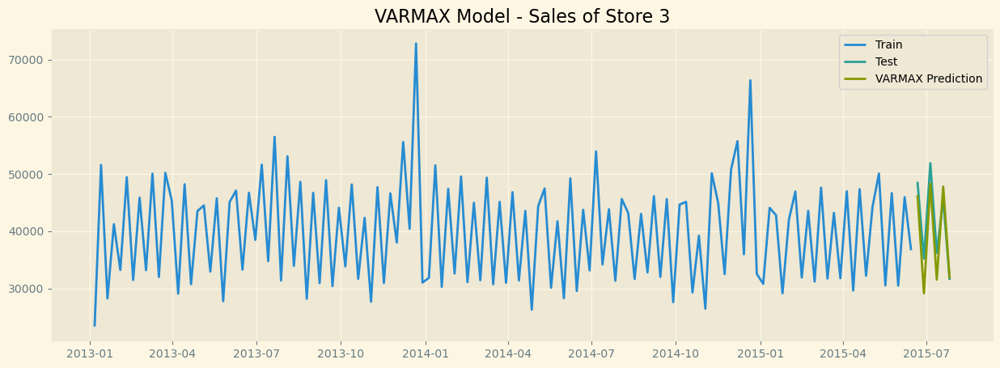

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA

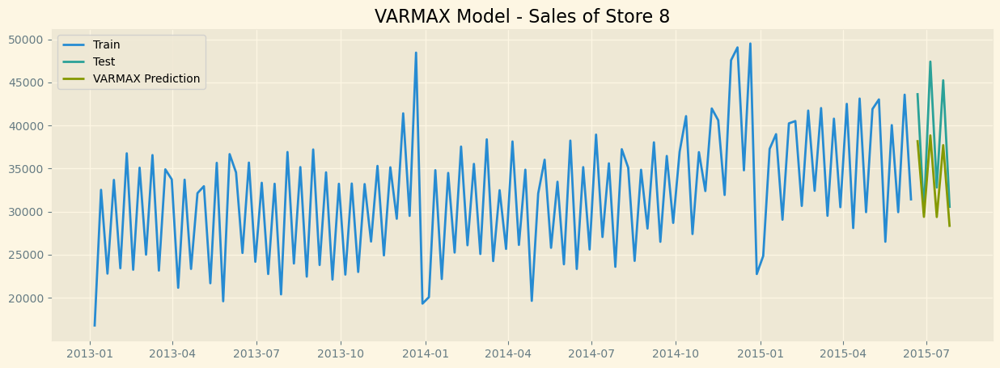

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


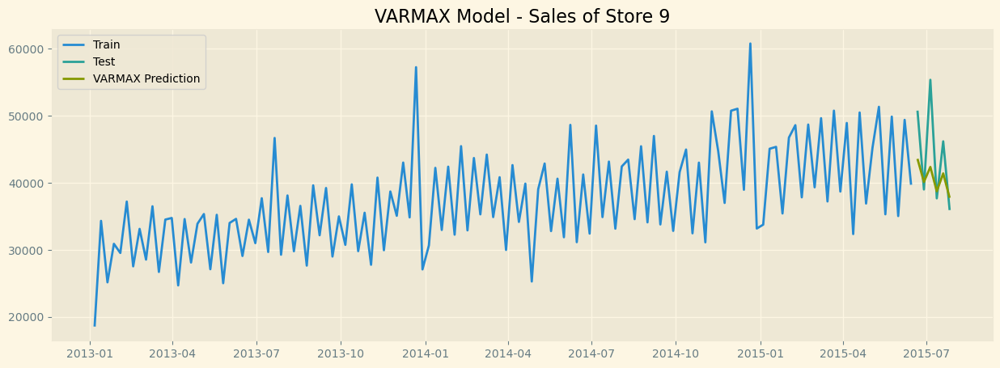

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


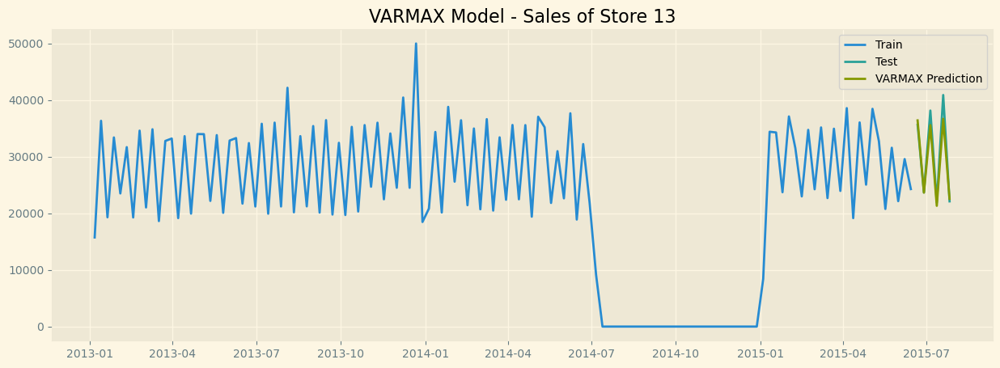

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA

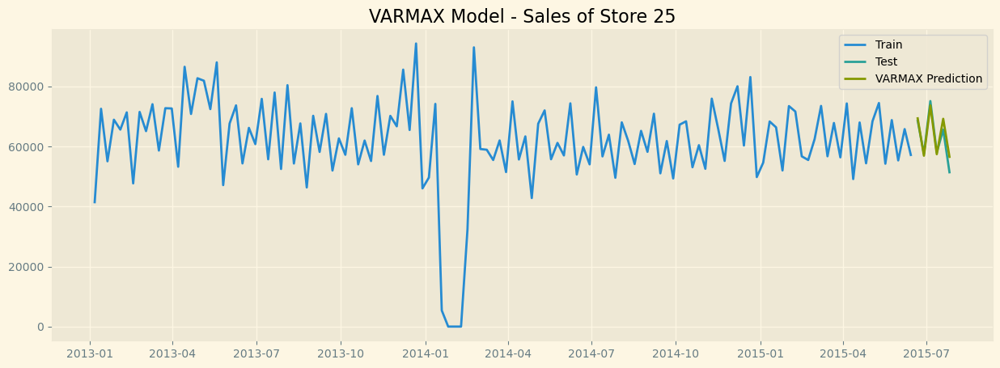

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


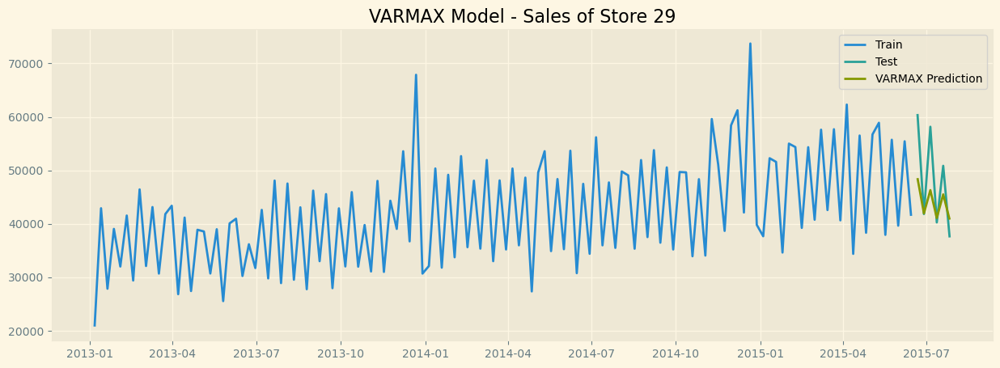

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


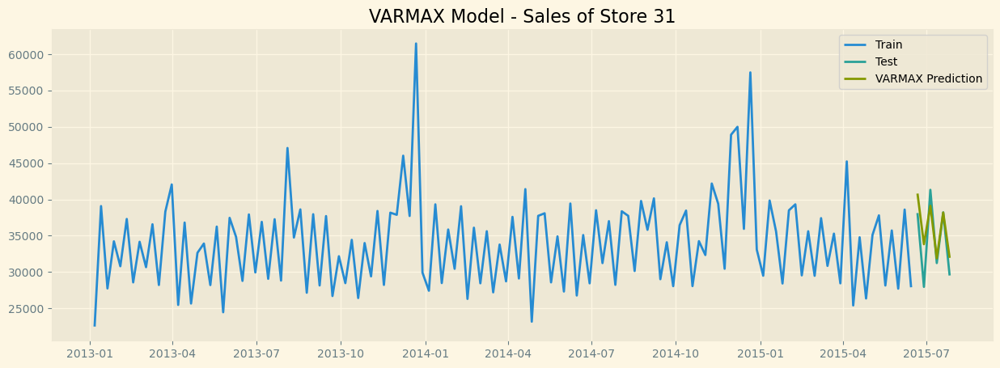

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


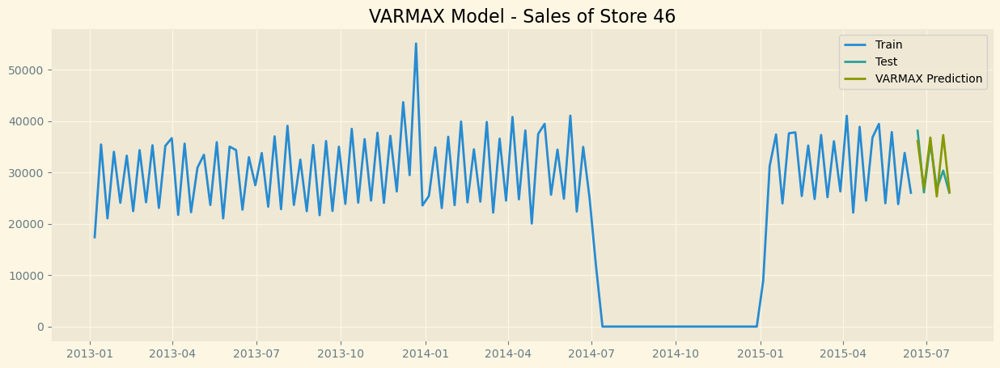

In [67]:
# Performing VARMAX modeling on key stores with exogvariables variables and evaluating the performance using RMSE, MAPE, and Accuracy metrics

# List of exogenous variables
exogvariables = ['Promo', 'SchoolHoliday', 'DayOfWeek', 'Day']

# Initialize results DataFrame
results = pd.DataFrame(columns=['Method', 'RMSE', 'MAPE', 'Accuracy'])

for key in traintest.keys():
    mod, res = varmax_model(traintest, key, p=2, q=2, exog=exogvariables)

    predict_varmax(traintest, key, mod, res, exog=exogvariables)

    # Plot VARMAX predictions
    plot_pred_varmax(traintest, key, res, model_name='VARMAX')

    # Evaluate VARMAX model metrics and store results
    varmax_results = varmax_model_metrics(traintest, key, model_name='VARMAX')
    results = pd.concat([results, varmax_results], ignore_index=True)


In [68]:
# Display the results DataFrame

results

,Method,RMSE,MAPE,Accuracy
0,VARMAX for Store 1,1172.23,3.34,96.66
1,VARMAX for Store 3,3690.74,7.91,92.09
2,VARMAX for Store 8,5426.93,11.09,88.91
3,VARMAX for Store 9,6448.63,9.81,90.19
4,VARMAX for Store 13,2060.13,4.00,96.00
5,VARMAX for Store 25,2676.28,3.46,96.54
6,VARMAX for Store 29,7354.13,10.33,89.67
7,VARMAX for Store 31,2969.73,7.30,92.70
8,VARMAX for Store 46,3034.02,6.53,93.47


## Output for VARMAX Model

- The VARMAX models performed well across the selected stores, with low RMSE values, indicating small average forecast errors
- The models achieved high accuracy rates reflecting strong predictive capabilities.
- Based on these metrics, it appears that some stores (Store 1, Store 25) achieved high accuracy with low error rates, while others (Store 29, Store 8) exhibited higher error rates and lower accuracy.

## SARIMAX Model

In [69]:
# Defining functions for SARIMAX model for forecasting against actual value.

def sarimax_model(data, key, order, seasonal_order, exog=None, printStats=False):
    endog_data = data[key]['train']['Sales'].astype(float)  # Convert to float if needed
    
    exog_data = data[key]['train'][exog].astype(float)  # Convert to float if needed

    mod = SARIMAX(endog=endog_data, exog=exog_data, order=order, seasonal_order=seasonal_order)
    res = mod.fit(disp=printStats)

    if printStats:
        print(res.summary())
    
    return mod, res

def predict_sarimax(data, key, mod, res, exog=None):
    exog_data = data[key]['test'][exog].astype(float)

    # Making predictions using SARIMAX model
    start_idx = data[key]['test'].index.min()
    end_idx = data[key]['test'].index.max()
    predictions = res.get_prediction(start=start_idx, end=end_idx, exog=exog_data)
    data[key]['predictions_sarimax'] = predictions.predicted_mean
    
    return predictions

# Function to plot SARIMAX predictions
def plot_pred_sarimax(data, key, res, model_name='SARIMAX'):
    plt.figure(figsize=(15, 5))
    plt.plot(data[key]['train']['Sales'], label='Train')
    plt.plot(data[key]['test']['Sales'], label='Test')
    plt.plot(data[key]['predictions_sarimax'], label='SARIMAX Prediction')
    plt.legend(loc='best')
    plt.title(f"{model_name} Model - Sales of Store {key}")
    plt.show()

# Function to calculate SARIMAX model metrics
def sarimax_model_metrics(data, key, model_name):
    rmse = np.sqrt(mean_squared_error(data[key]['test']['Sales'], data[key]['predictions_sarimax'])).round(2)
    mape = np.round(np.mean(np.abs(data[key]['test']['Sales'] - data[key]['predictions_sarimax']) / data[key]['test']['Sales']) * 100, 2)
    acc = 100 - mape
    temp = pd.DataFrame({'Method': [f"{model_name} for Store {key}"], 'MAPE': [mape], 'RMSE': [rmse], 'Accuracy': [acc]})
    
    return temp



C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


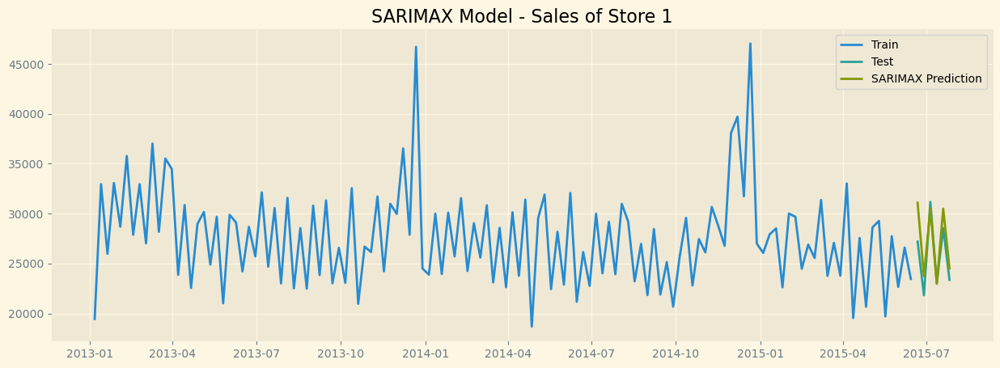

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


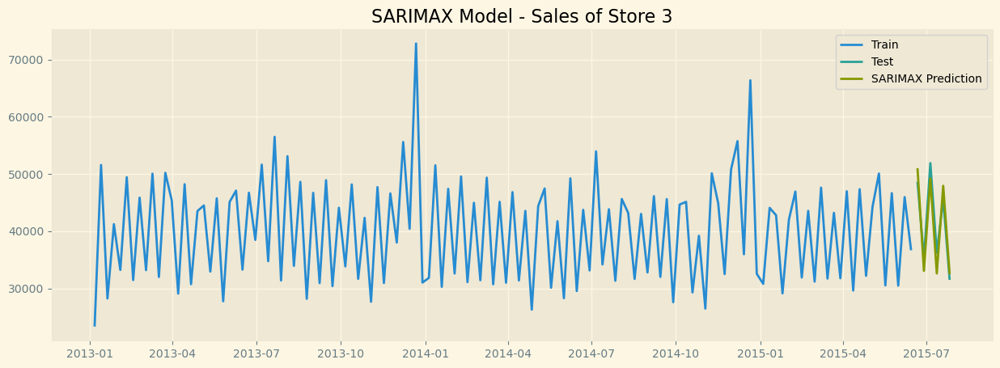

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


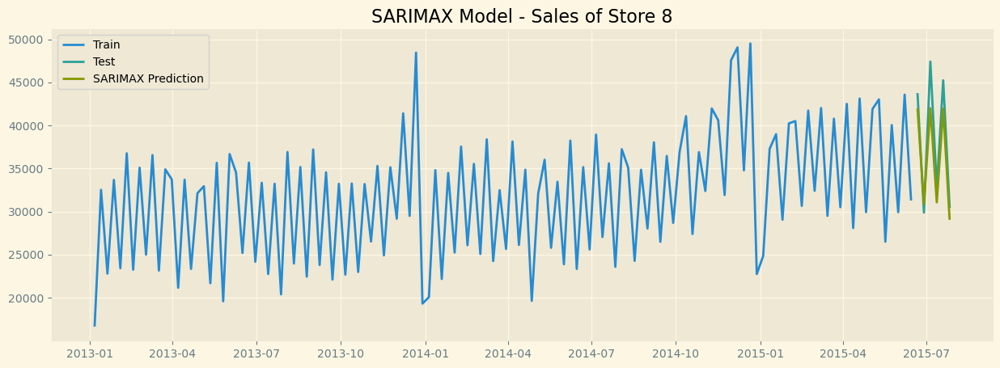

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


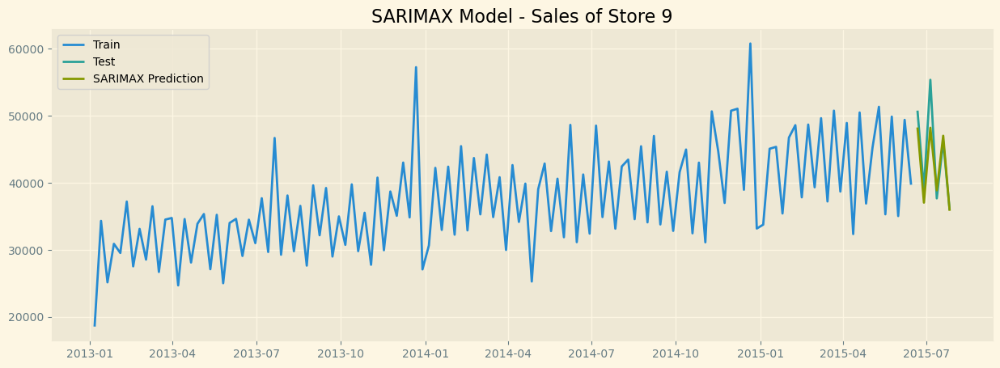

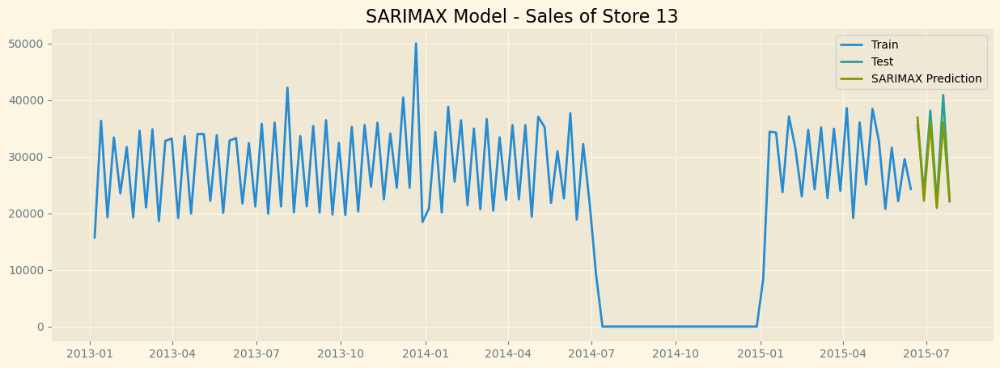

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


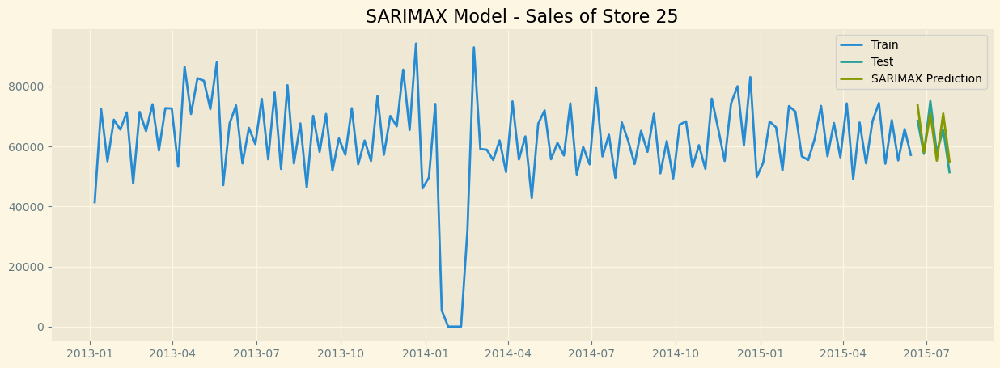

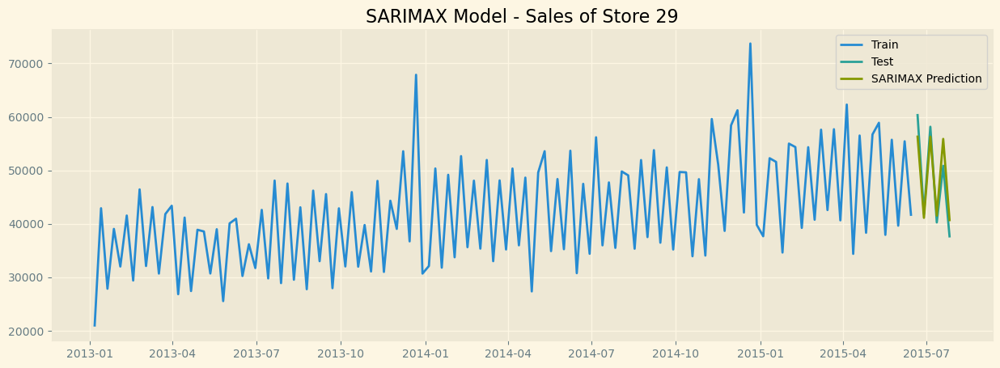

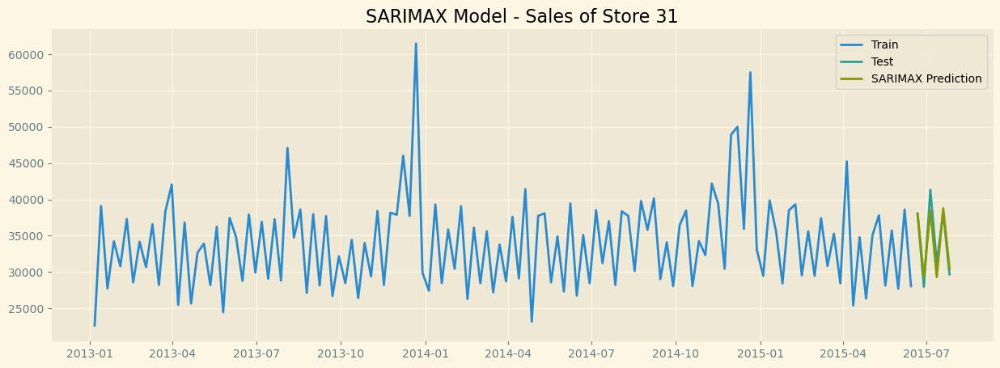

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


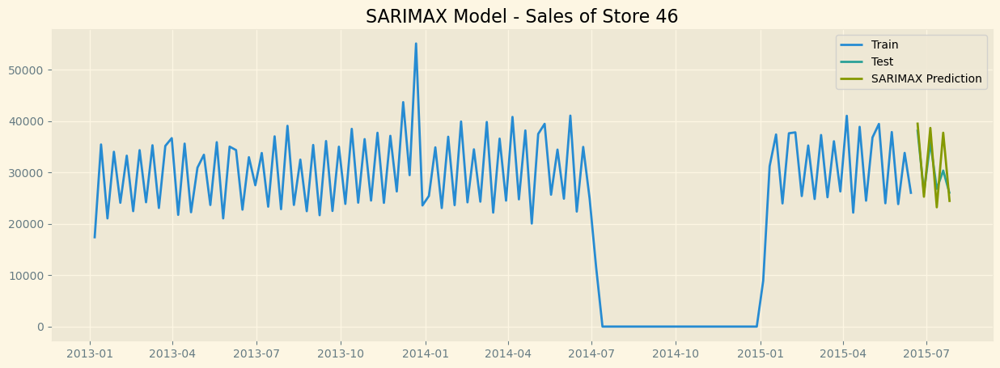

In [70]:
# Performing SARIMAX modeling on key stores with exogvariables variables and evaluating the performance using RMSE, MAPE, and Accuracy metrics

exogvariables = ['Promo', 'SchoolHoliday', 'DayOfWeek', 'Day']

results = pd.DataFrame(columns=['Method', 'RMSE', 'MAPE', 'Accuracy'])

for key in traintest.keys():
    mod_sarimax, res_sarimax = sarimax_model(traintest, key, order=(1, 0, 1), seasonal_order=(1, 0, 1, 7), exog=exogvariables)

    predict_sarimax(traintest, key, mod_sarimax, res_sarimax, exog=exogvariables)

    # Plot SARIMAX predictions
    plot_pred_sarimax(traintest, key, res_sarimax, model_name='SARIMAX')

    # Evaluate SARIMAX model metrics and store results
    sarimax_results = sarimax_model_metrics(traintest, key, model_name='SARIMAX')
    results = pd.concat([results, sarimax_results])


In [71]:

# Display results

results

,Method,RMSE,MAPE,Accuracy
0,SARIMAX for Store 1,2017.22,6.21,93.79
0,SARIMAX for Store 3,2478.31,5.72,94.28
0,SARIMAX for Store 8,2862.32,5.98,94.02
0,SARIMAX for Store 9,3252.96,4.70,95.30
0,SARIMAX for Store 13,2305.40,5.35,94.65
0,SARIMAX for Store 25,3953.73,5.66,94.34
0,SARIMAX for Store 29,3063.57,5.45,94.55
0,SARIMAX for Store 31,1551.24,3.69,96.31
0,SARIMAX for Store 46,3658.69,9.77,90.23


## Output for SARIMAX Model
- The SARIMAX models applied to various stores showed good performance in forecasting sales data. 
- The RMSE values ranged from approximately 1551 to 3954, indicating varying levels of forecast accuracy across different stores. 
- The models achieved high accuracy rates from 90% to over 96%, suggesting effective predictive capabilities for most stores.

# Next 6 Week Forecast Using VARMAX for All Store

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


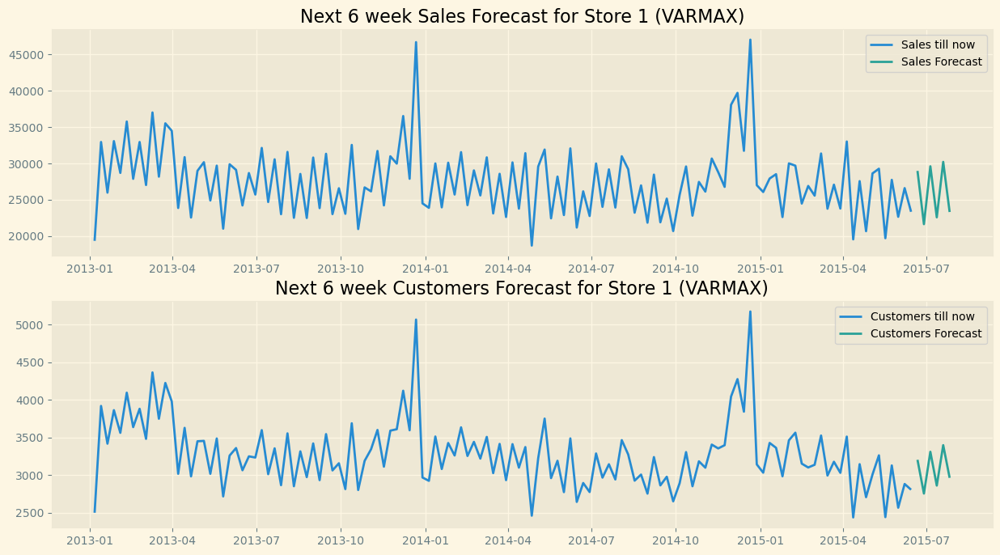

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


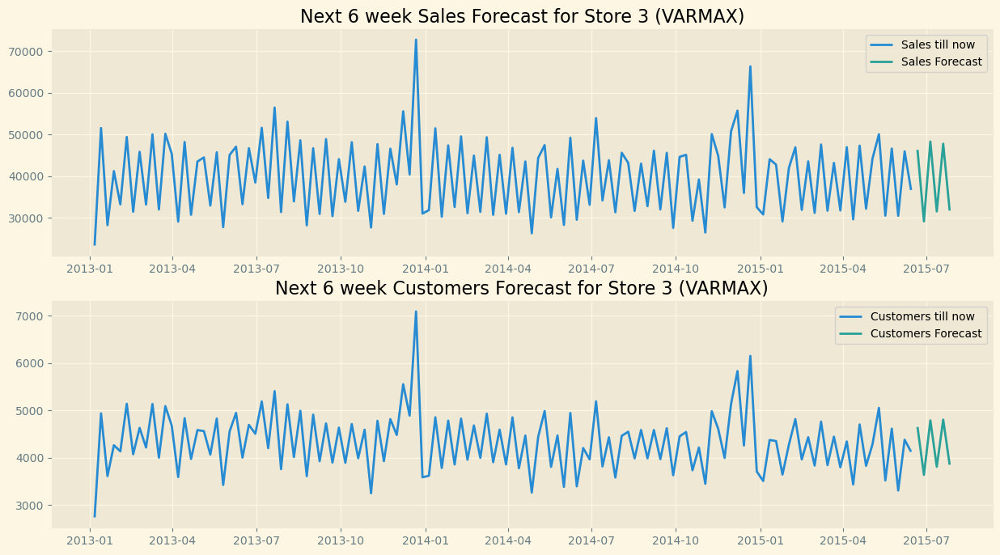

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA

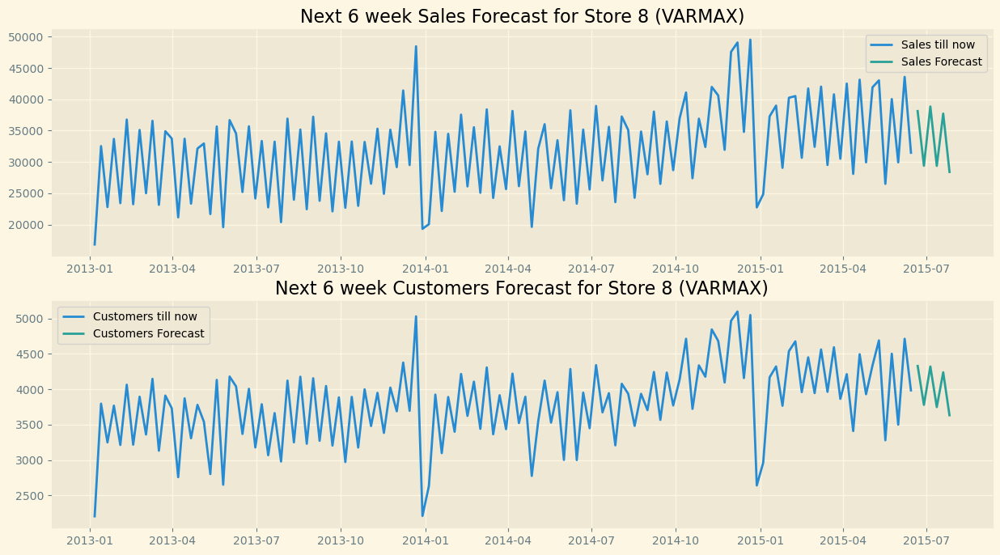

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


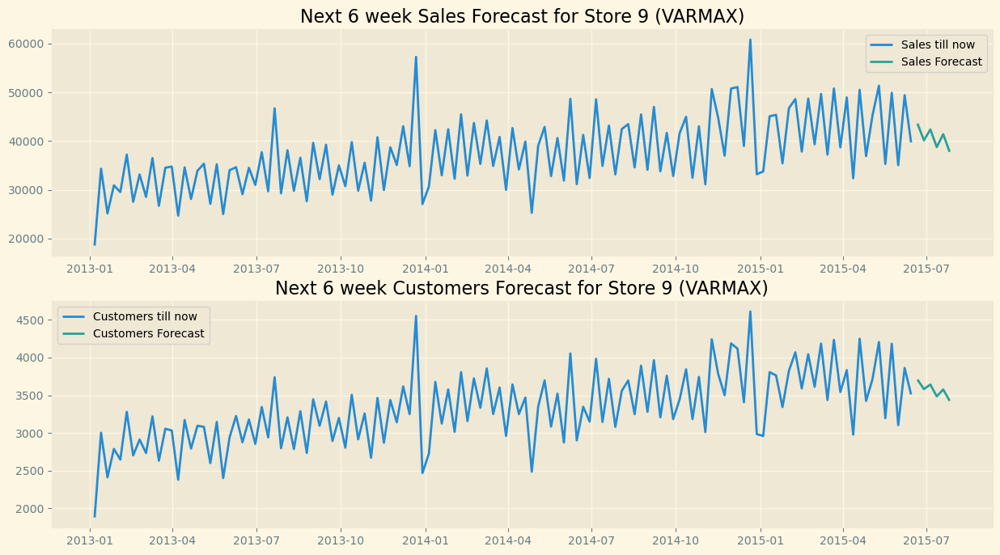

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


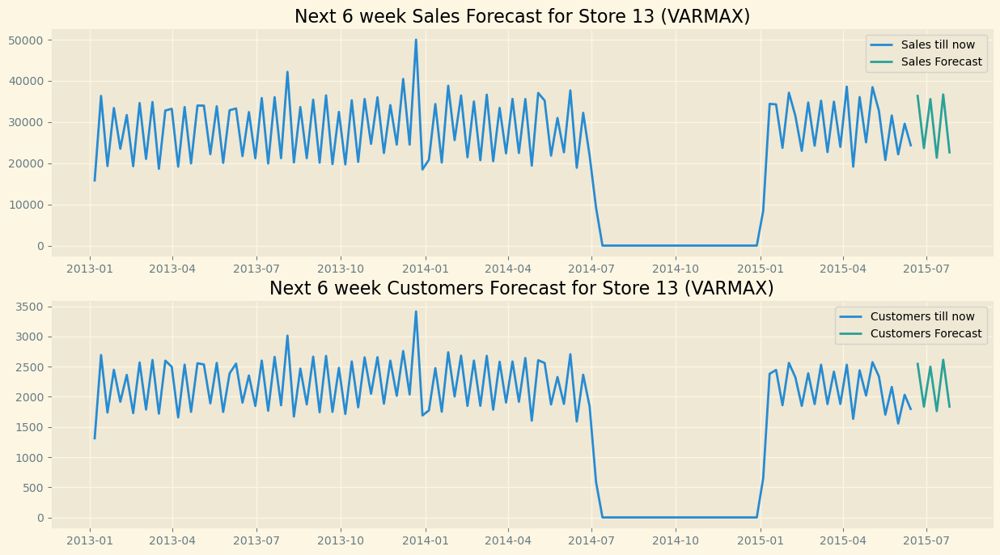

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA

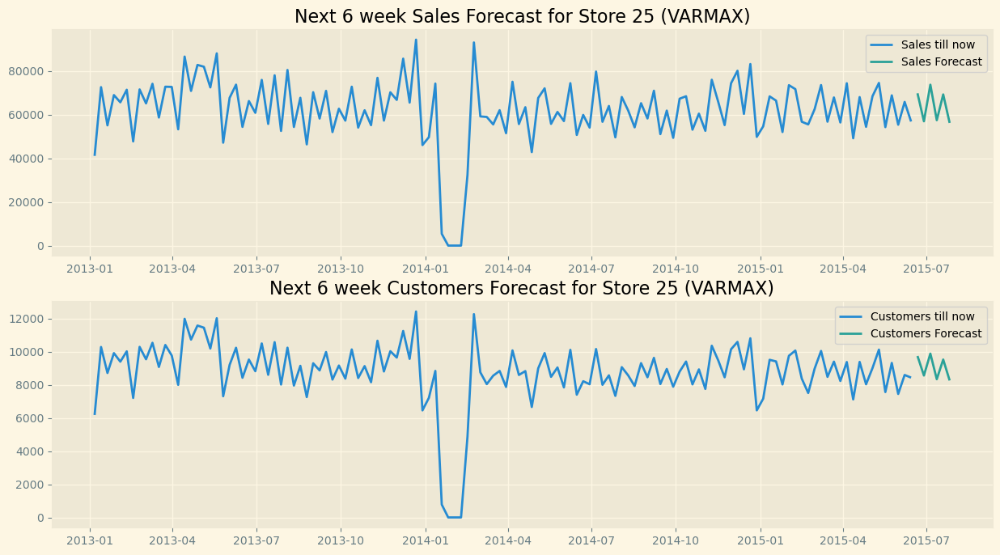

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


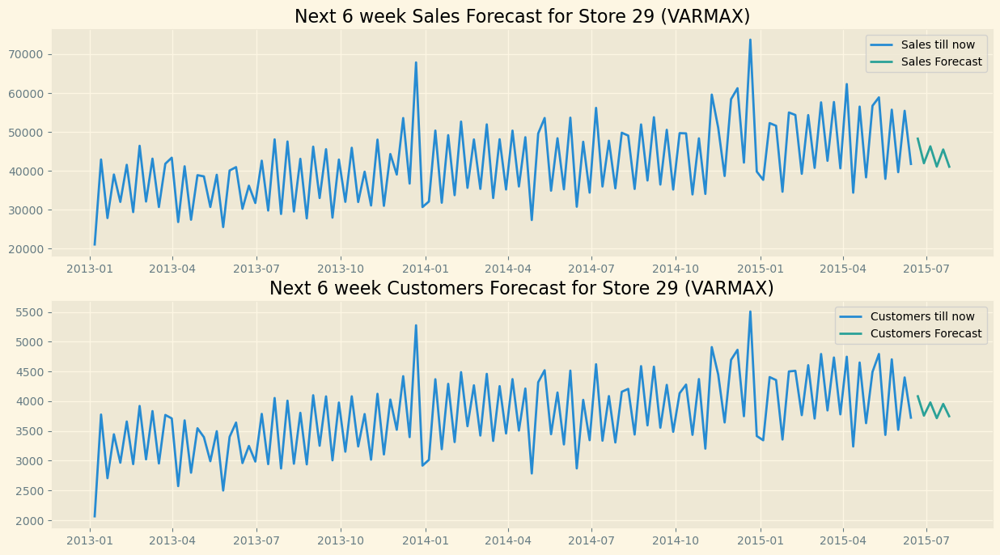

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


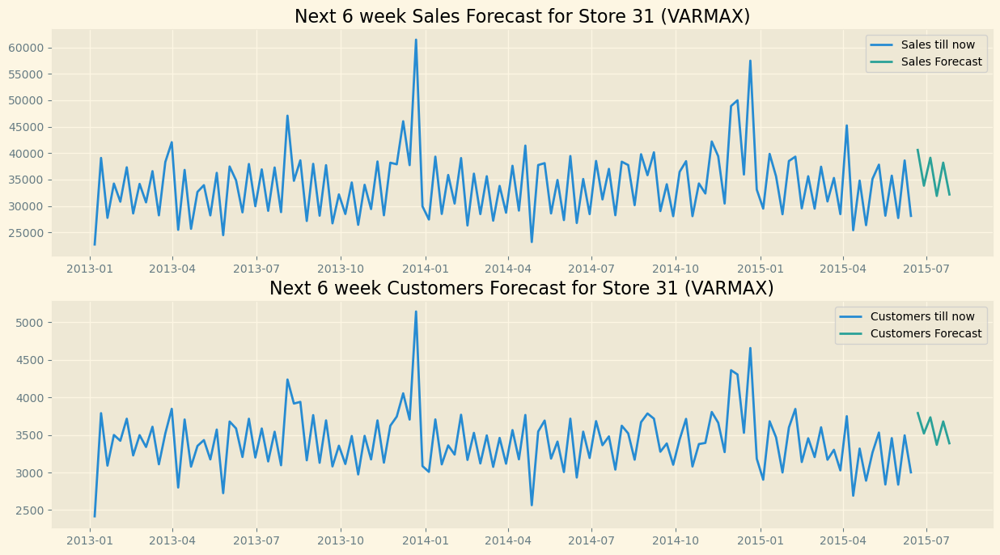

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


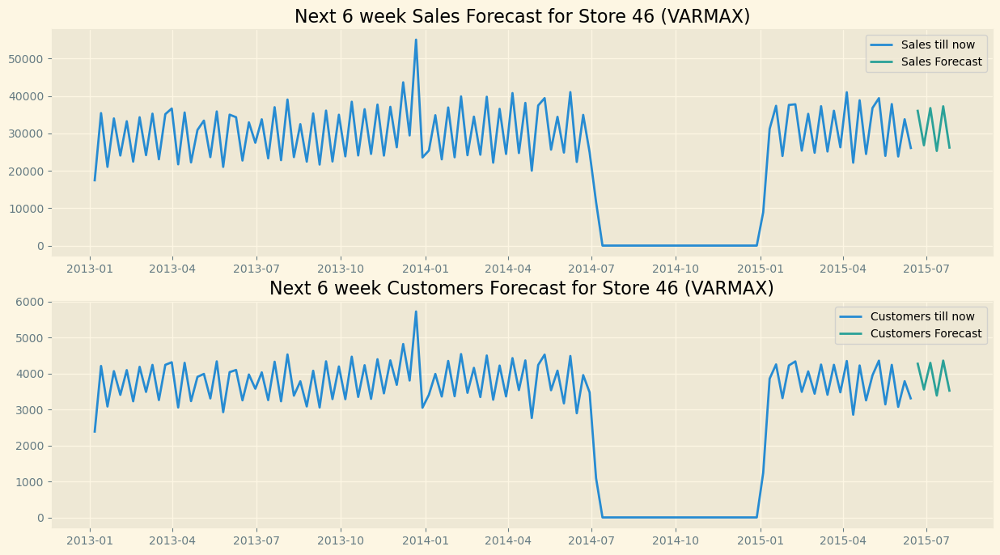

In [72]:
# Performing next 6 week forecast using varmax
# Define the exogenous variables
exogvariables = ['Promo', 'SchoolHoliday', 'DayOfWeek', 'Day']

# Create an empty DataFrame to store forecasted results
forecast_table_varmax = pd.DataFrame(columns=['Week', 'Store', 'Sales', 'Customers'])

# Iterate over each store (assuming traintest is a dictionary of DataFrames)
for store_id in traintest.keys():
    # Get training and testing data for the current store
    train_data = traintest[store_id]['train']
    test_data = traintest[store_id]['test']
    
    # Resample Sales and Customers to weekly sums for training data
    endog_train = train_data[['Sales', 'Customers']].resample('W').sum()
    
    # Resample exogenous variables to weekly sums for training data
    exog_train = train_data[exogvariables].resample('W').sum()
    
    # Fit VARMAX model
    mod_varmax = VARMAX(endog=endog_train, order=(2, 2), trend='n', exog=exog_train)
    res_varmax = mod_varmax.fit(maxiter=1000, disp=False)
    
    # Resample exogenous variables to weekly sums for testing data
    exog_test = test_data[exogvariables].resample('W').sum()
    
    # Generate week dates for the forecasted period starting from 21st June
    start_date = endog_train.index[-1] + pd.DateOffset(days=7)  # Next week after the last training date
    forecast_dates = pd.date_range(start=start_date, periods=6, freq='W')  # 21st June and next 6 weeks
    
    # Forecast next 6 weeks using VARMAX model
    result_forecast_varmax = res_varmax.forecast(steps=6, exog=exog_test)
    
    # Store forecasted Sales and Customers along with week dates in the table
    for i in range(6):
        week_date = forecast_dates[i]
        sales_forecast = result_forecast_varmax['Sales'].iloc[i]  # Access Sales forecast
        customers_forecast = result_forecast_varmax['Customers'].iloc[i]  # Access Customers forecast
        forecast_table_varmax = forecast_table_varmax.append({'Week': week_date,
                                                              'Store': f'Store {store_id}',
                                                              'Sales': sales_forecast,
                                                              'Customers': customers_forecast},
                                                              ignore_index=True)

    # Plot forecasted Sales and Customers for VARMAX
    plt.figure(figsize=(15, 8))
    
    # Plot Sales
    plt.subplot(2, 1, 1)
    plt.plot(endog_train['Sales'], label='Sales till now')
    plt.plot(forecast_dates, result_forecast_varmax['Sales'], label='Sales Forecast')
    plt.title(f'Next 6 week Sales Forecast for Store {store_id} (VARMAX)')
    plt.legend()
    
    # Plot Customers
    plt.subplot(2, 1, 2)
    plt.plot(endog_train['Customers'], label='Customers till now')
    plt.plot(forecast_dates, result_forecast_varmax['Customers'], label='Customers Forecast')
    plt.title(f'Next 6 week Customers Forecast for Store {store_id} (VARMAX)')
    plt.legend()
    
    plt.show()


In [73]:
# Display the forecast table with week dates for VARMAX forecasts
print("Sales and Customers Forecast for the Next 6 Weeks (VARMAX):")
print(forecast_table_varmax)


Sales and Customers Forecast for the Next 6 Weeks (VARMAX):
         Week     Store         Sales    Customers
0  2015-06-21   Store 1  28972.651180  3202.940236
1  2015-06-28   Store 1  21638.900916  2754.951661
2  2015-07-05   Store 1  29604.196409  3309.401270
3  2015-07-12   Store 1  22580.062260  2860.812914
4  2015-07-19   Store 1  30214.351362  3397.471001
5  2015-07-26   Store 1  23311.583922  2963.422986
6  2015-06-21   Store 3  46316.989621  4652.134973
7  2015-06-28   Store 3  29127.948995  3641.030277
8  2015-07-05   Store 3  48308.264142  4792.301039
9  2015-07-12   Store 3  31517.739125  3812.059376
10 2015-07-19   Store 3  47790.167706  4807.226689
11 2015-07-26   Store 3  31734.896721  3854.541591
12 2015-06-21   Store 8  38301.493024  4345.348796
13 2015-06-28   Store 8  29394.026998  3780.060481
14 2015-07-05   Store 8  38845.185482  4322.647392
15 2015-07-12   Store 8  29374.956775  3748.566384
16 2015-07-19   Store 8  37718.379046  4240.720748
17 2015-07-26   Store 

### Output for Next 6 week forecast result using VARMAX for Sales and Customer for each Store

- The forecasted sales vary widely across different stores, ranging from 21,000 to 74,000 per week.
- Customer forecasts also exhibit variation, with customer counts ranging from  1,800 to 9,700 customers per week.
- Each store shows unique patterns in sales and customer projections, highlighting the importance of store-level forecasting.
- The forecast capture temporal trends, such as fluctuations in sales and customer demand over the upcoming weeks.


# Next 6 Week Forecast Using SARIMAX for All Store

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


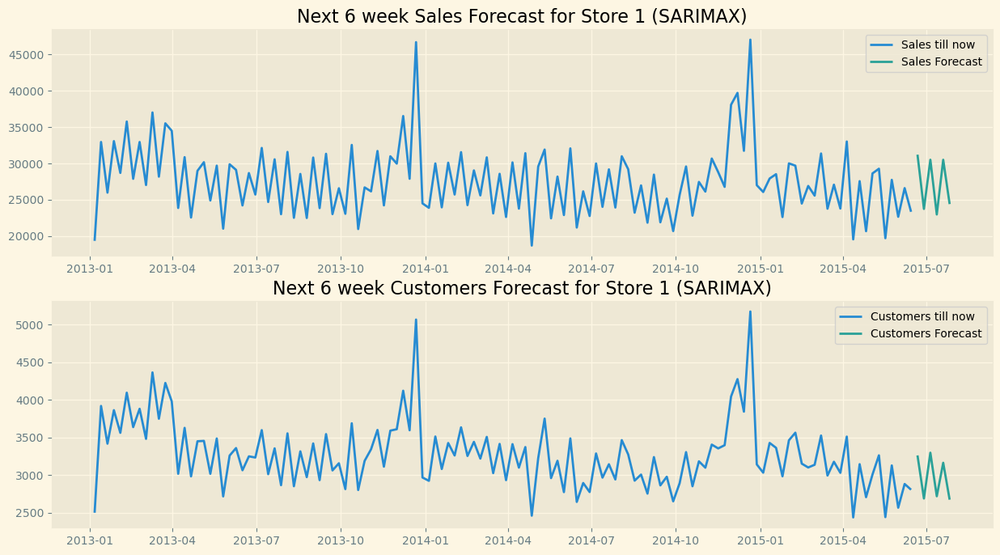

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


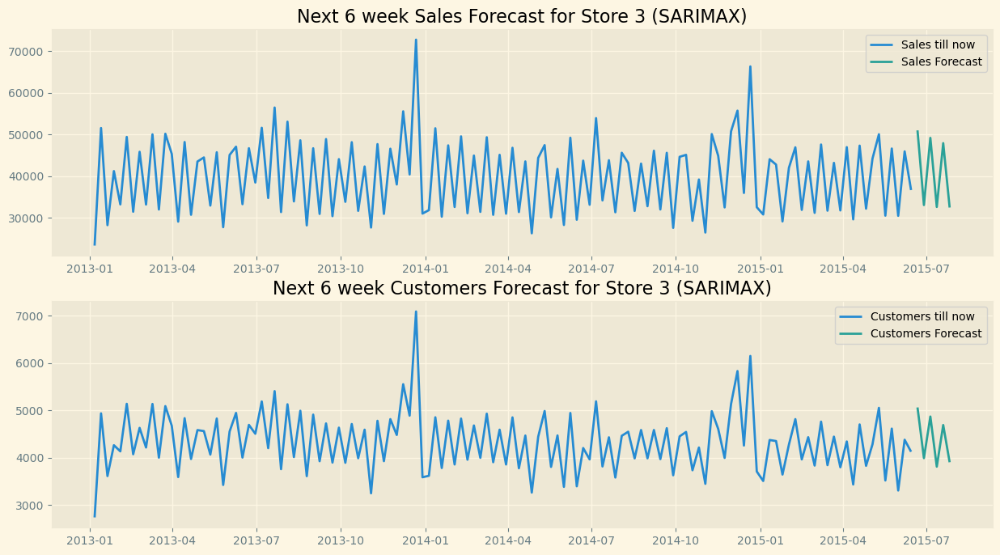

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


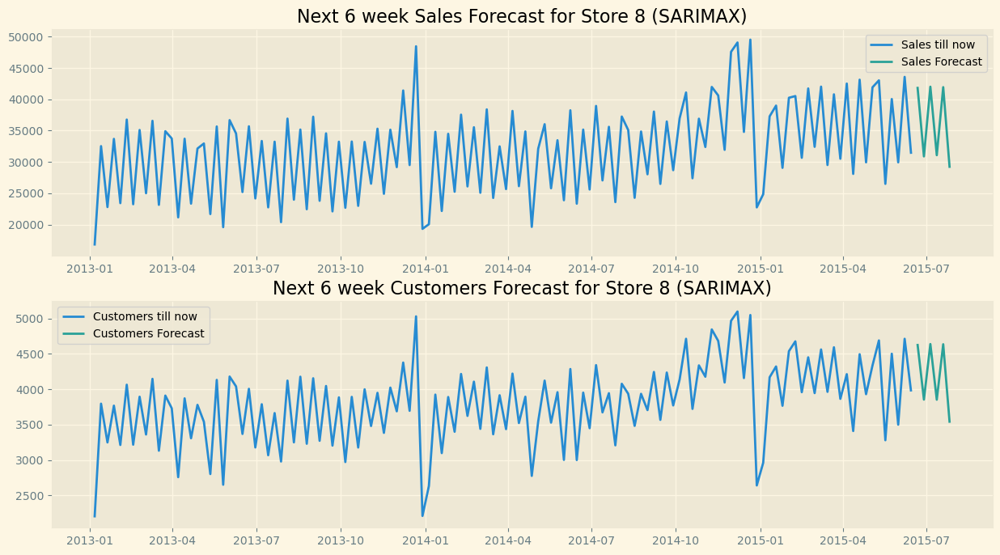

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


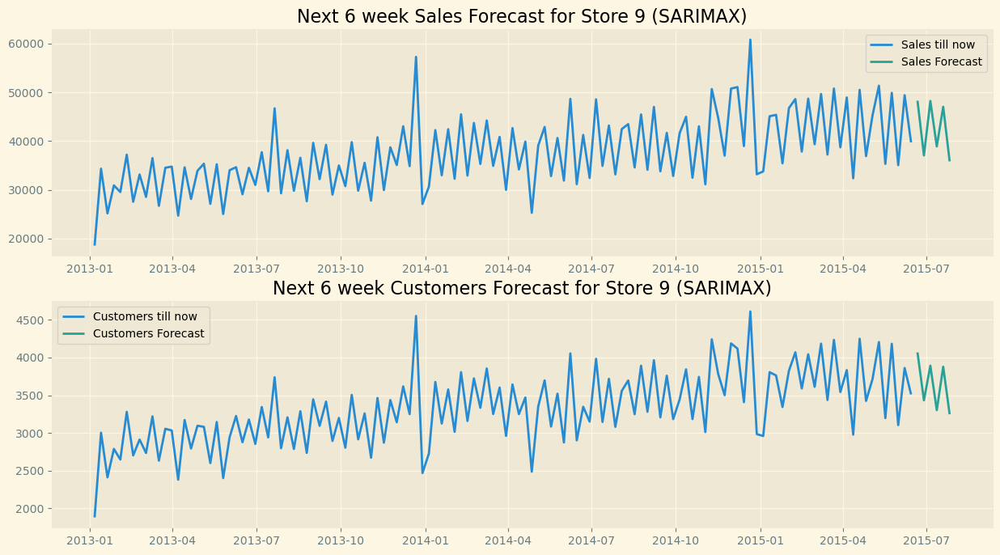

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


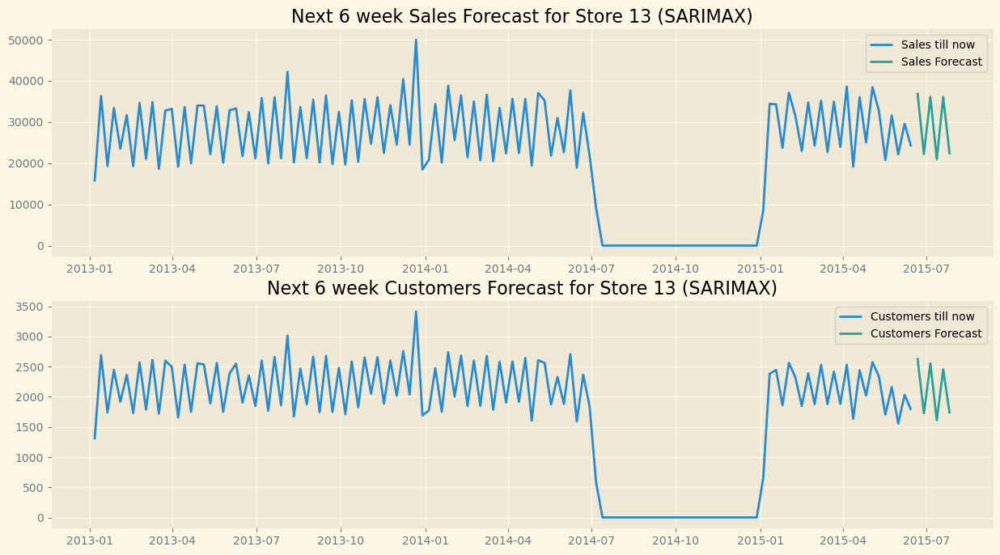

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


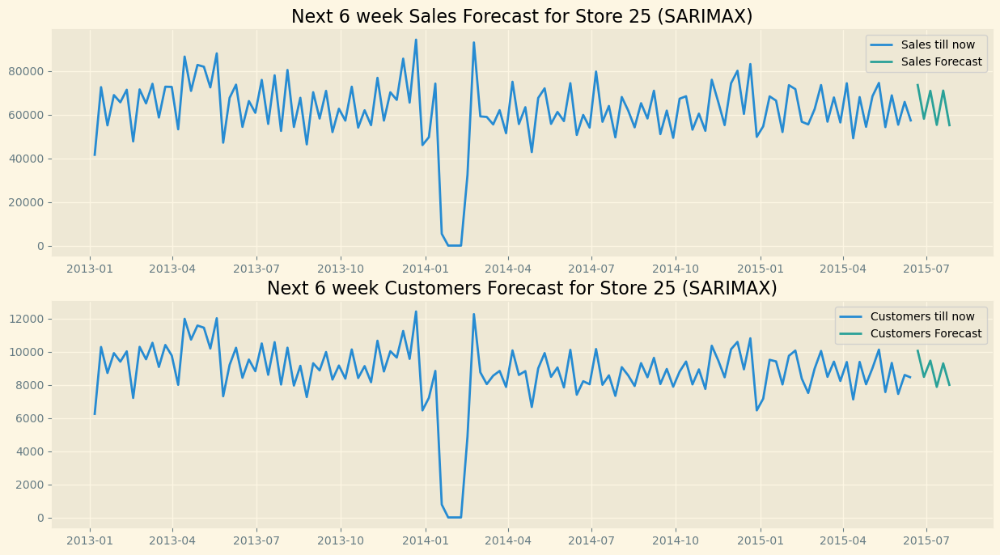

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


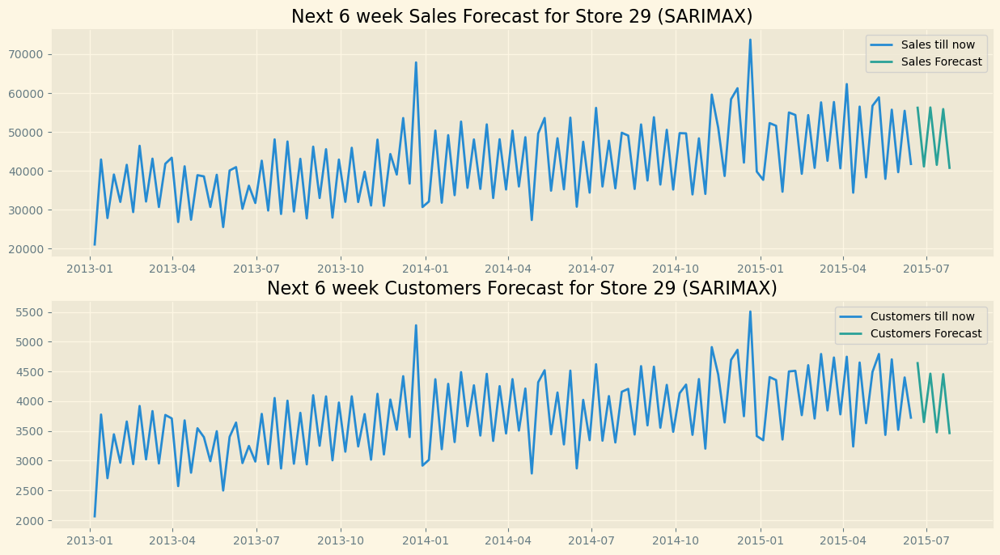

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


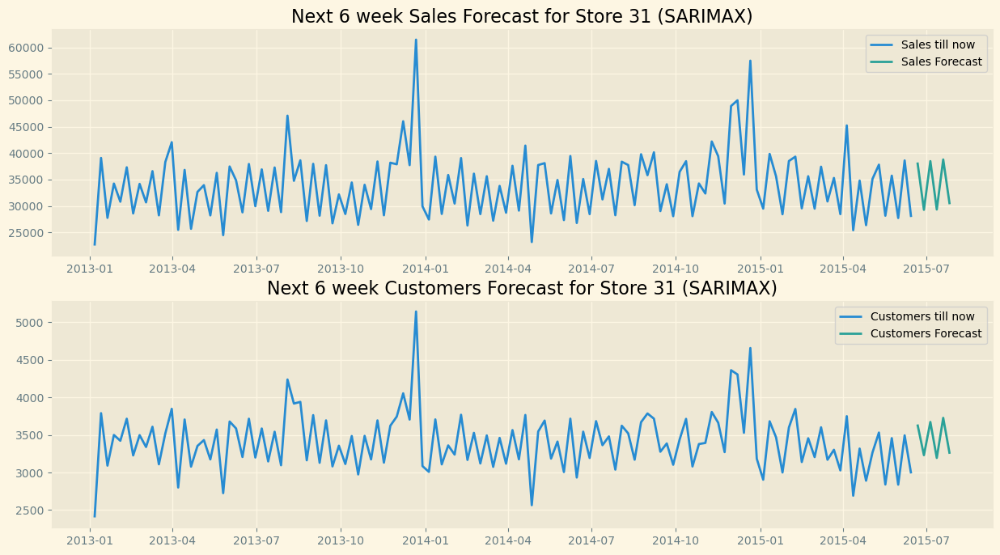

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


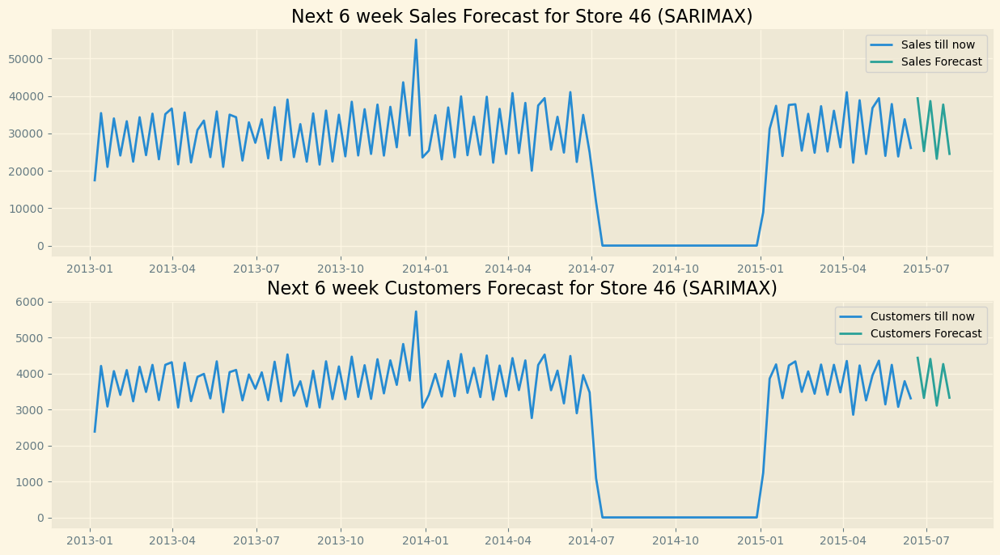

In [74]:
# Performing next 6 week forecast using SARIMAX

# Define the exogenous variables
exogvariables = ['Promo', 'SchoolHoliday', 'DayOfWeek', 'Day']

forecast_table_sarimax = pd.DataFrame(columns=['Week', 'Store', 'Sales', 'Customers'])

for store_id in traintest.keys():
    train_data = traintest[store_id]['train']
    test_data = traintest[store_id]['test']
    
    endog_train_sales = train_data['Sales'].resample('W').sum()
    endog_train_customers = train_data['Customers'].resample('W').sum()
    
    mod_sarimax_sales = SARIMAX(endog=endog_train_sales,
                                exog=train_data[exogvariables].resample('W').sum(),
                                order=(1, 0, 1),
                                seasonal_order=(1, 0, 1, 7))
    res_sarimax_sales = mod_sarimax_sales.fit()
    
    # Forecast next 6 weeks using SARIMAX model for Sales
    forecast_start = endog_train_sales.index[-1] + pd.DateOffset(1)
    forecast_end = forecast_start + pd.DateOffset(6 * 7 - 1)
    result_forecast_sarimax_sales = res_sarimax_sales.get_forecast(steps=6, 
                                                                   exog=test_data[exogvariables].resample('W').sum())
    
    mod_sarimax_customers = SARIMAX(endog=endog_train_customers,
                                    exog=train_data[exogvariables].resample('W').sum(),
                                    order=(1, 0, 1),
                                    seasonal_order=(1, 0, 1, 7))
    res_sarimax_customers = mod_sarimax_customers.fit()
    
    # Forecast next 6 weeks using SARIMAX model for Customers
    result_forecast_sarimax_customers = res_sarimax_customers.get_forecast(steps=6, 
                                                                            exog=test_data[exogvariables].resample('W').sum())
    
    forecast_dates = pd.date_range(start=forecast_start, periods=6, freq='W')

    # Store forecasted Sales and Customers along with week dates in the table
    for i, week_date in enumerate(forecast_dates):
        sales_forecast = result_forecast_sarimax_sales.predicted_mean[i]
        customers_forecast = result_forecast_sarimax_customers.predicted_mean[i]
        forecast_table_sarimax = forecast_table_sarimax.append({'Week': week_date,
                                                                'Store': f'Store {store_id}',
                                                                'Sales': sales_forecast,
                                                                'Customers': customers_forecast},
                                                               ignore_index=True)

    # Plot forecasted Sales and Customers for SARIMAX
    plt.figure(figsize=(15, 8))
    
    plt.subplot(2, 1, 1)
    plt.plot(endog_train_sales, label='Sales till now')
    plt.plot(forecast_dates, result_forecast_sarimax_sales.predicted_mean, label='Sales Forecast')
    plt.title(f'Next 6 week Sales Forecast for Store {store_id} (SARIMAX)')
    plt.legend()
    
    plt.subplot(2, 1, 2)
    plt.plot(endog_train_customers, label='Customers till now')
    plt.plot(forecast_dates, result_forecast_sarimax_customers.predicted_mean, label='Customers Forecast')
    plt.title(f'Next 6 week Customers Forecast for Store {store_id} (SARIMAX)')
    plt.legend()
    
    plt.show()


In [75]:
# Display the forecast table with week dates for SARIMAX forecasts
print("Forecasted Sales and Customers for Each Store Over the Next 6 Weeks (SARIMAX):")
print(forecast_table_sarimax)


Forecasted Sales and Customers for Each Store Over the Next 6 Weeks (SARIMAX):
         Week     Store         Sales     Customers
0  2015-06-21   Store 1  31207.389049   3261.318286
1  2015-06-28   Store 1  23738.659683   2689.196987
2  2015-07-05   Store 1  30506.545723   3297.088363
3  2015-07-12   Store 1  22971.720931   2718.920167
4  2015-07-19   Store 1  30502.934693   3163.642153
5  2015-07-26   Store 1  24402.007177   2673.686528
6  2015-06-21   Store 3  51000.467916   5065.107054
7  2015-06-28   Store 3  33056.684297   3994.101486
8  2015-07-05   Store 3  49195.743567   4872.765726
9  2015-07-12   Store 3  32602.241802   3813.987814
10 2015-07-19   Store 3  47927.092247   4693.567034
11 2015-07-26   Store 3  32461.835620   3907.180346
12 2015-06-21   Store 8  41993.690872   4642.103474
13 2015-06-28   Store 8  30886.493318   3854.478663
14 2015-07-05   Store 8  42007.864085   4639.706292
15 2015-07-12   Store 8  31077.894937   3852.995017
16 2015-07-19   Store 8  41937.743754

## Output for SARIMAX Model

- The forecasted sales vary significantly across stores, reflecting differing demand patterns. 
- Store 25 is projected to have the highest sales, exceeding 70,000 units, while other stores Store 1 and Store 3 have sales projections ranging between approximately 20,000 to 50,000 units.
- Customer forecasts also exhibit variation, with some stores expecting higher customer footfall compared to others. 
- Store 25 and Store 3 have notably higher customer forecasts, suggesting higher traffic and demand.
- Across all stores, the forecasts capture trends over time, showcasing fluctuation by factors such as promotions, seasonality, and local market conditions. Understanding these variations enables targeted strategies to optimize performance and meet customer expectations.

##  VARMAX Vs SARIMAX Model Comparision for each Store

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA

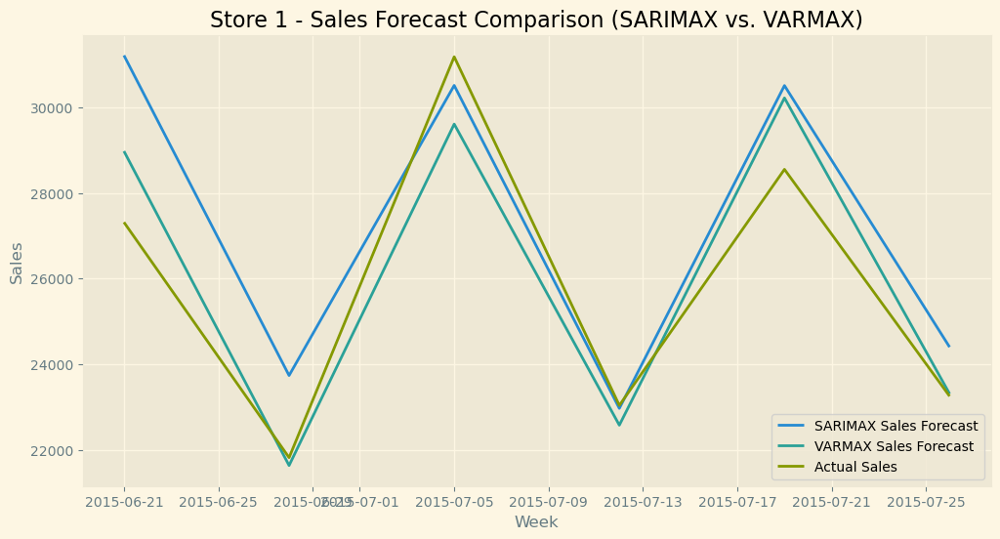

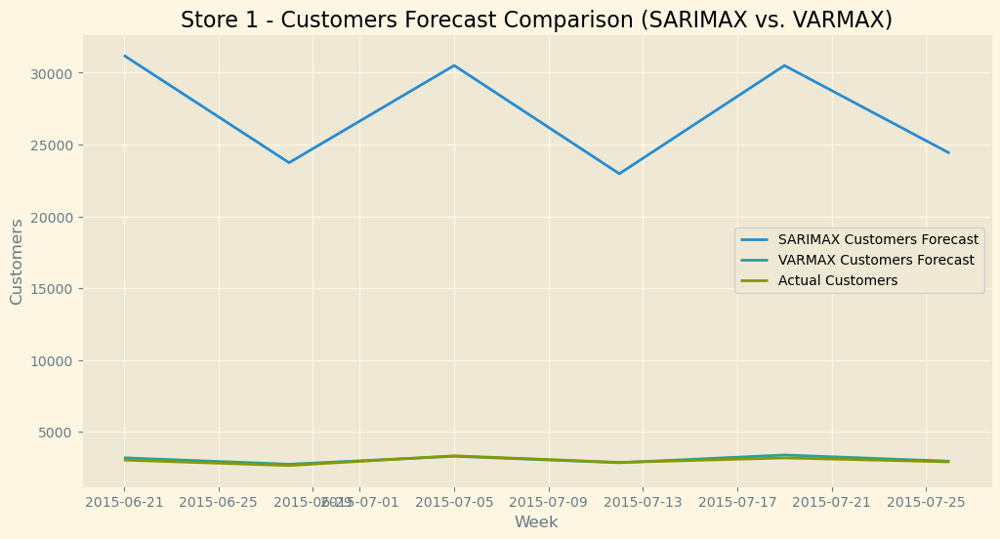

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA

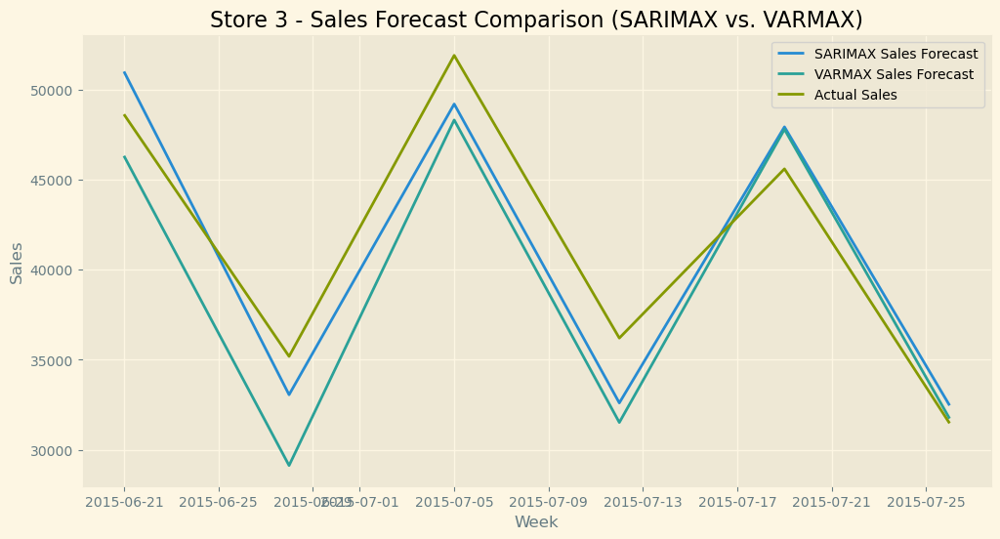

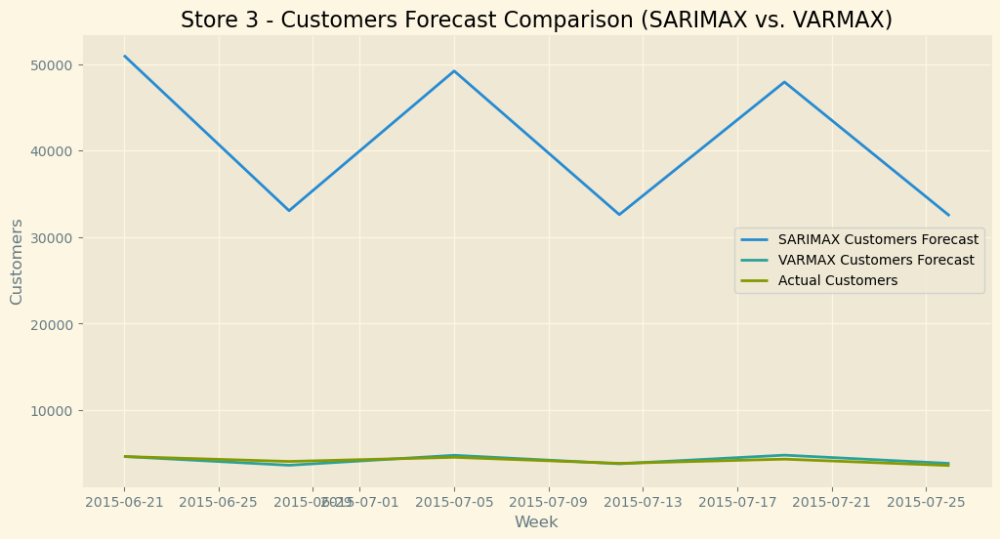

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Use

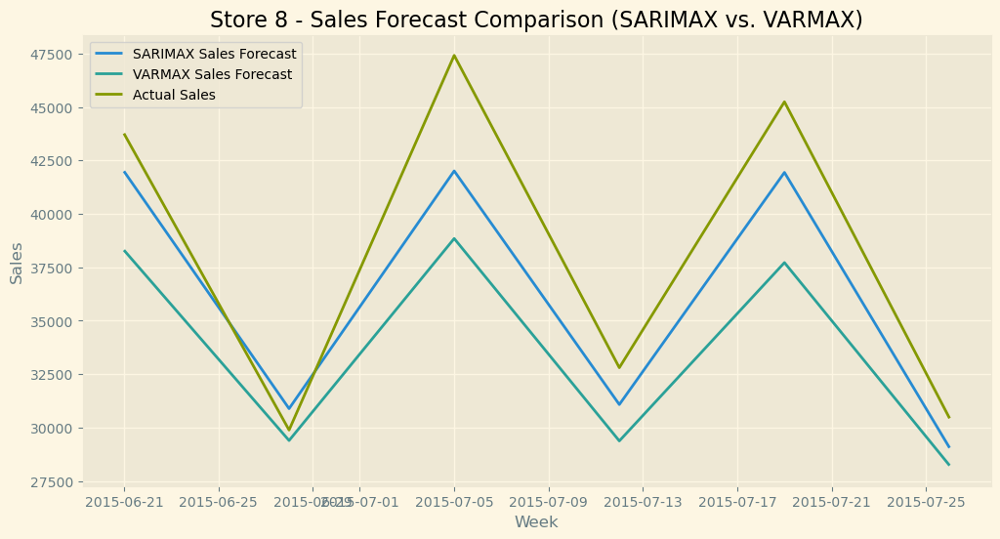

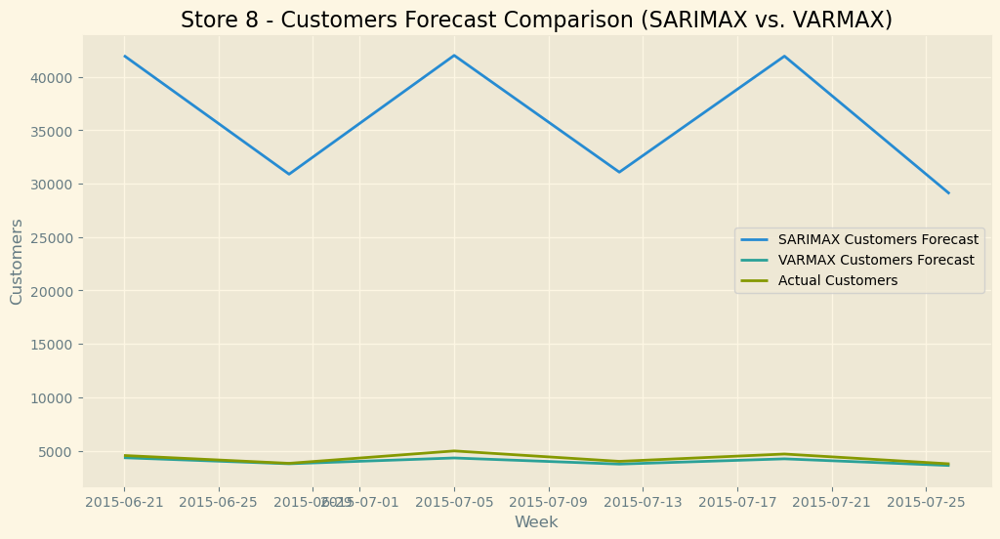

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA

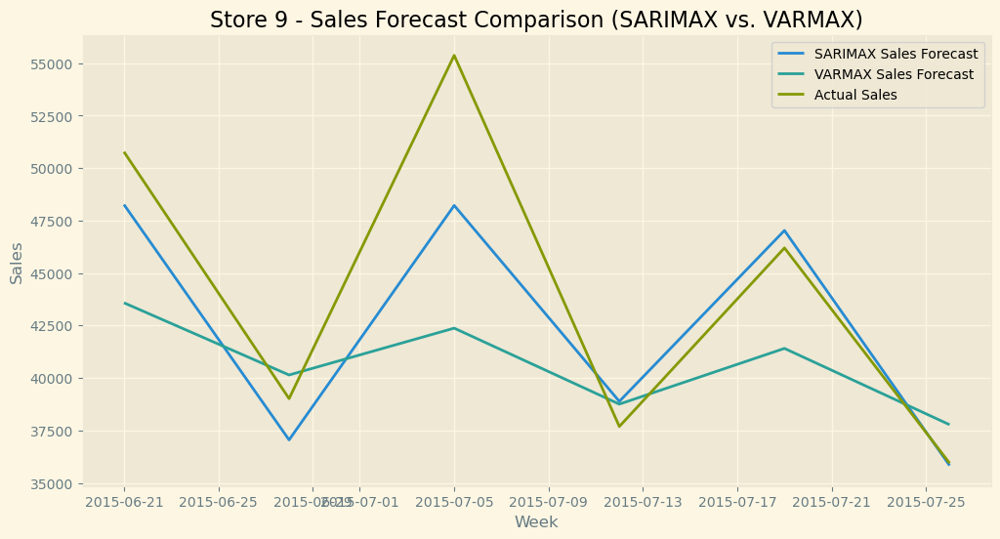

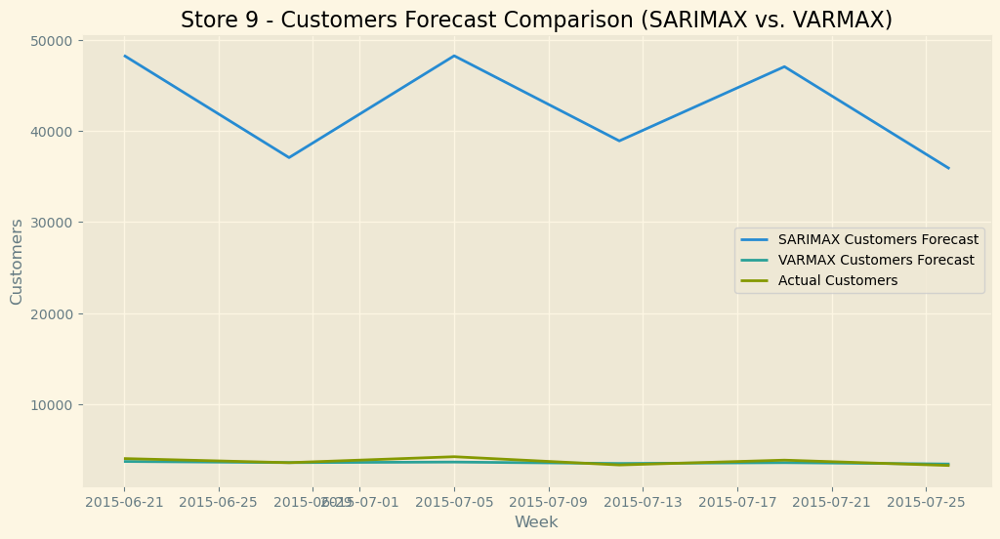

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


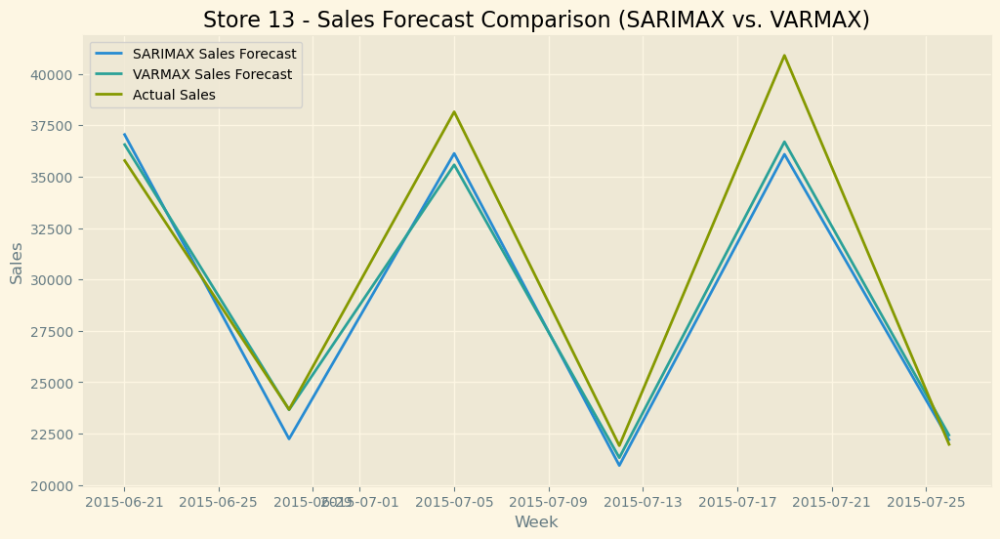

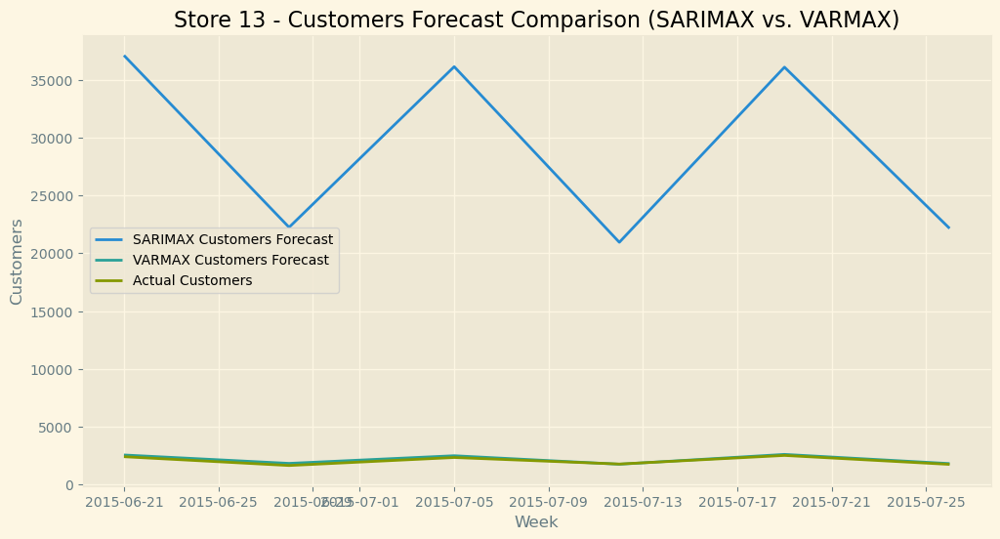

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Use

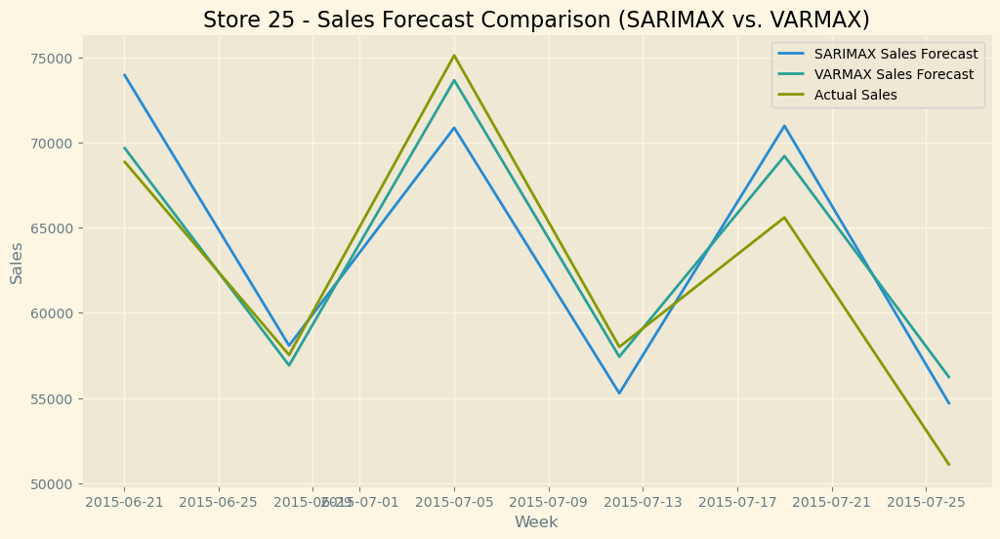

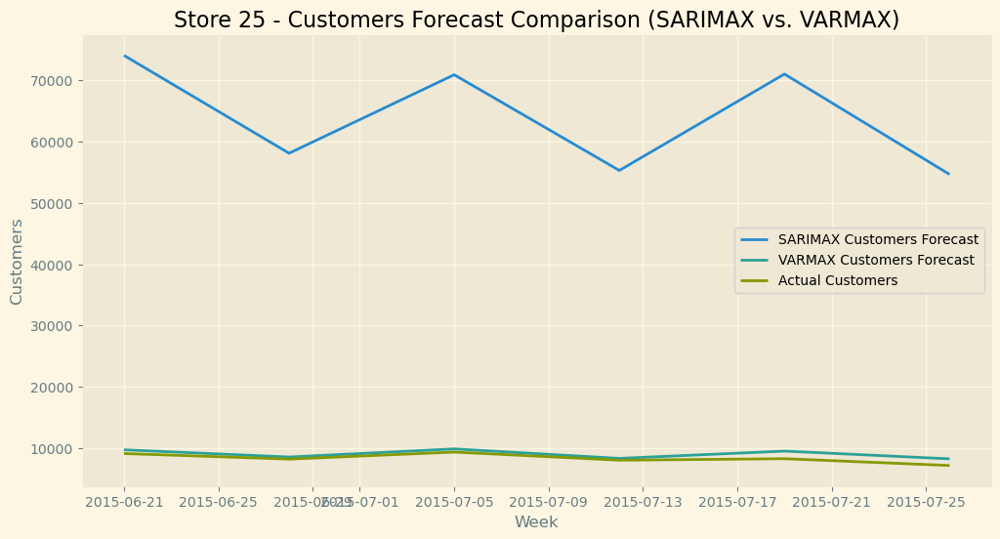

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


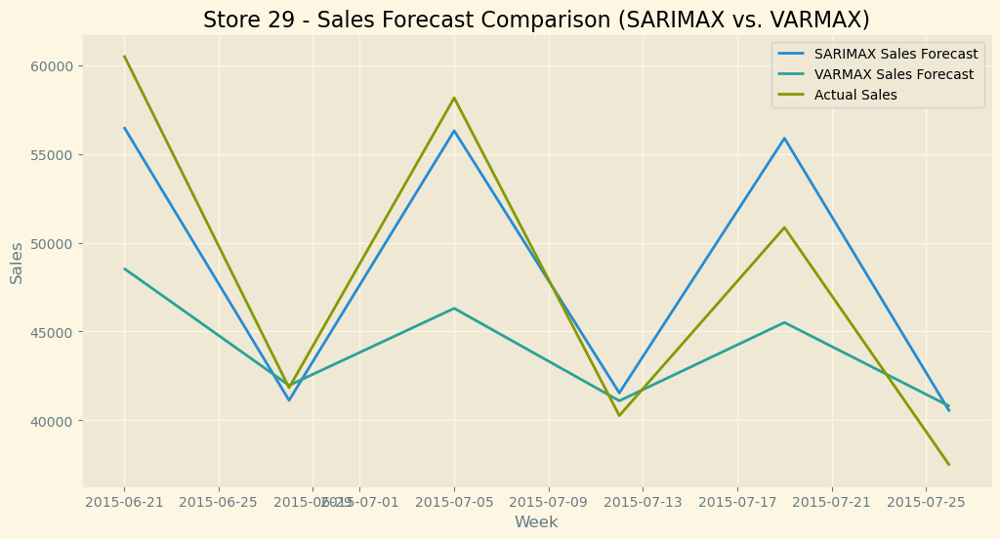

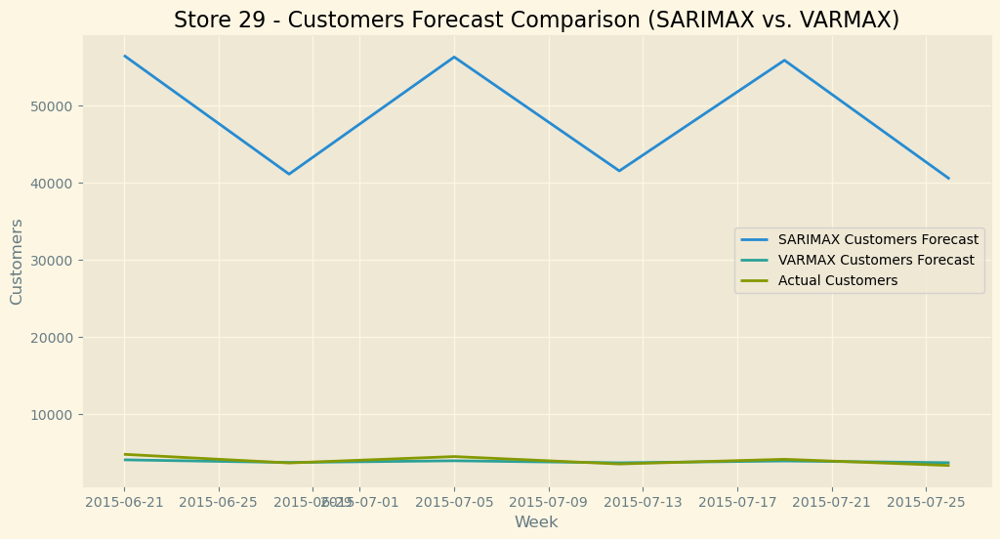

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'


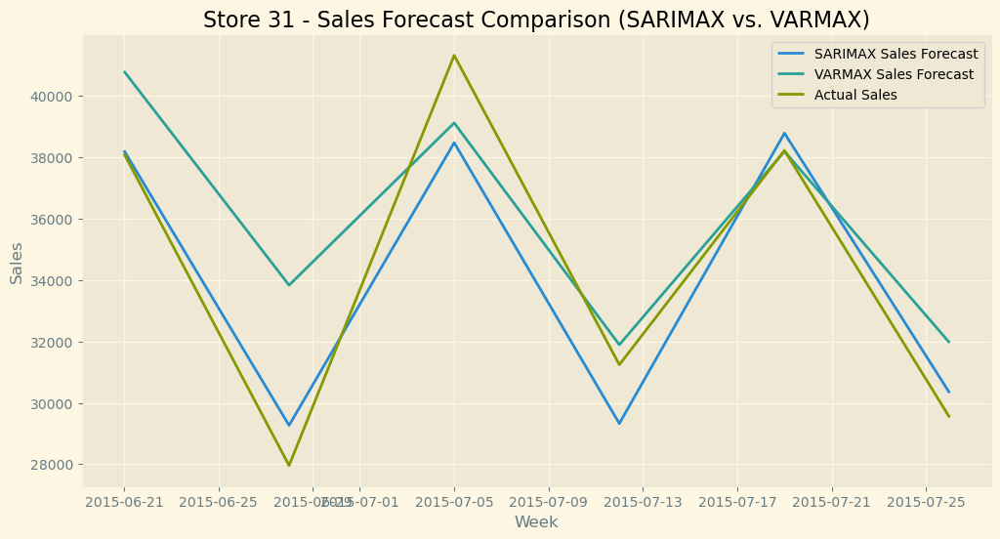

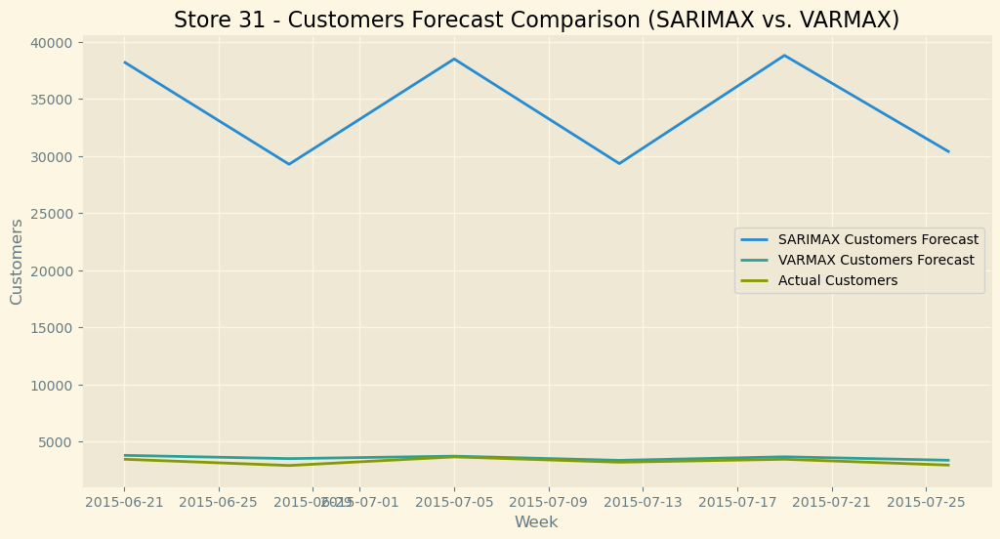

C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA(p,q) models is not generically robust,'
C:\Users\Admin\anaconda3\lib\site-packages\statsmodels\tsa\statespace\varmax.py:161: EstimationWarning: Estimation of VARMA(p,q) models is not generically robust, due especially to identification issues.
  warn('Estimation of VARMA

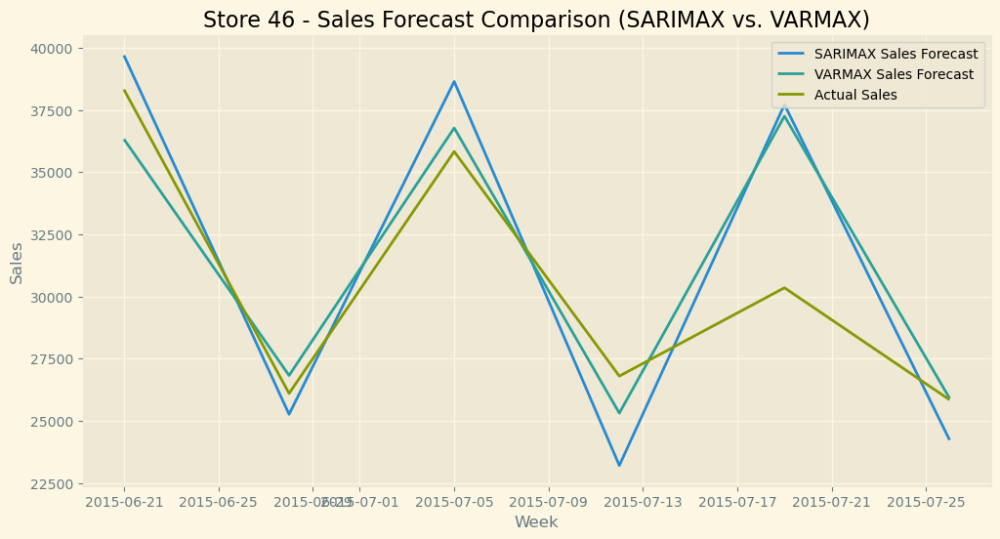

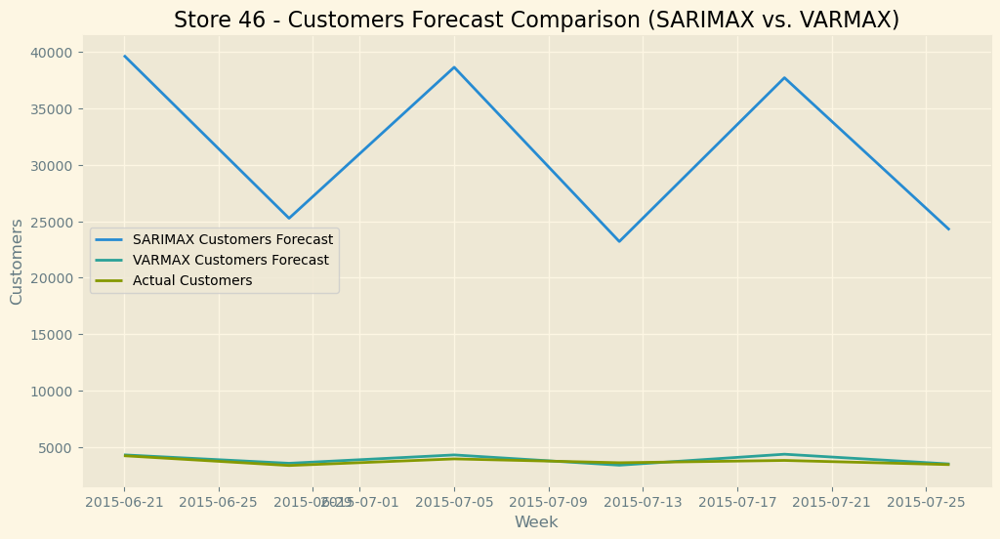

In [76]:
# Define the exogenous variables
exogvariables = ['Promo', 'SchoolHoliday', 'DayOfWeek', 'Day']

# Create empty DataFrames to store forecasted results
forecast_table_sarimax = pd.DataFrame(columns=['Week', 'Store', 'Sales', 'Customers'])
forecast_table_varmax = pd.DataFrame(columns=['Week', 'Store', 'Sales', 'Customers'])
forecast_errors = pd.DataFrame(columns=['Store', 'Sales_Error_SARIMAX', 'Sales_Error_VARMAX', 'Customers_Error_SARIMAX', 'Customers_Error_VARMAX'])

for store_id in traintest.keys():
    actual_sales_test_data = traintest[store_id]['test']['Sales']
    actual_customers_test_data = traintest[store_id]['test']['Customers']

    # SARIMAX model
    train_data_sarimax = traintest[store_id]['train']
    test_data_sarimax = traintest[store_id]['test']
    endog_train_sarimax = train_data_sarimax['Sales'].resample('W').sum()
    exog_train_sarimax = train_data_sarimax[exogvariables].resample('W').sum()
    mod_sarimax = SARIMAX(endog=endog_train_sarimax, exog=exog_train_sarimax,
                          order=(1, 0, 1), seasonal_order=(1, 0, 1, 7))
    res_sarimax = mod_sarimax.fit()
    result_forecast_sarimax = res_sarimax.forecast(steps=6, exog=test_data_sarimax[exogvariables].resample('W').sum())
    forecast_dates_sarimax = pd.date_range(start=endog_train_sarimax.index[-1] + pd.DateOffset(days=7),
                                           periods=6, freq='W')
    for i in range(6):
        week_date = forecast_dates_sarimax[i]
        sales_forecast = result_forecast_sarimax.values[i]
        customers_forecast = result_forecast_sarimax.values[i]
        forecast_table_sarimax = forecast_table_sarimax.append({'Week': week_date,
                                                                'Store': f'Store {store_id}',
                                                                'Sales': sales_forecast,
                                                                'Customers': customers_forecast},
                                                                ignore_index=True)

    # VARMAX model
    train_data_varmax = traintest[store_id]['train']
    test_data_varmax = traintest[store_id]['test']
    endog_train_varmax = train_data_varmax[['Sales', 'Customers']].resample('W').sum()
    exog_train_varmax = train_data_varmax[exogvariables].resample('W').sum()
    mod_varmax = VARMAX(endog=endog_train_varmax, order=(2, 2), trend='n', exog=exog_train_varmax)
    res_varmax = mod_varmax.fit(maxiter=1000, disp=False)
    result_forecast_varmax = res_varmax.forecast(steps=6, exog=test_data_varmax[exogvariables].resample('W').sum())
    forecast_dates_varmax = pd.date_range(start=endog_train_varmax.index[-1] + pd.DateOffset(days=7),
                                          periods=6, freq='W')
    for i in range(6):
        week_date = forecast_dates_varmax[i]
        sales_forecast = result_forecast_varmax['Sales'].values[i]
        customers_forecast = result_forecast_varmax['Customers'].values[i]
        forecast_table_varmax = forecast_table_varmax.append({'Week': week_date,
                                                              'Store': f'Store {store_id}',
                                                              'Sales': sales_forecast,
                                                              'Customers': customers_forecast},
                                                              ignore_index=True)

    # Calculate forecast errors (MAE) for Sales and Customers
    sarimax_sales_forecasts = forecast_table_sarimax[forecast_table_sarimax['Store'] == f'Store {store_id}']['Sales']
    varmax_sales_forecasts = forecast_table_varmax[forecast_table_varmax['Store'] == f'Store {store_id}']['Sales']
    sarimax_customers_forecasts = forecast_table_sarimax[forecast_table_sarimax['Store'] == f'Store {store_id}']['Customers']
    varmax_customers_forecasts = forecast_table_varmax[forecast_table_varmax['Store'] == f'Store {store_id}']['Customers']

    sales_sarimax_error = mean_absolute_error(actual_sales_test_data, sarimax_sales_forecasts)
    sales_varmax_error = mean_absolute_error(actual_sales_test_data, varmax_sales_forecasts)
    customers_sarimax_error = mean_absolute_error(actual_customers_test_data, sarimax_customers_forecasts)
    customers_varmax_error = mean_absolute_error(actual_customers_test_data, varmax_customers_forecasts)

    # Determine which model has lower forecast errors (for Sales and Customers)
    sales_best_model = 'SARIMAX' if sales_sarimax_error < sales_varmax_error else 'VARMAX'
    customers_best_model = 'SARIMAX' if customers_sarimax_error < customers_varmax_error else 'VARMAX'

    # Append forecast errors to DataFrame
    forecast_errors = forecast_errors.append({'Store': f'Store {store_id}',
                                              'Sales_Error_SARIMAX': sales_sarimax_error,
                                              'Sales_Error_VARMAX': sales_varmax_error,
                                              'Customers_Error_SARIMAX': customers_sarimax_error,
                                              'Customers_Error_VARMAX': customers_varmax_error},
                                              ignore_index=True)

    # Plot Sales Forecast Comparison for the current store
    plt.figure(figsize=(12, 6))
    plt.plot(forecast_table_sarimax[forecast_table_sarimax['Store'] == f'Store {store_id}']['Week'],
             forecast_table_sarimax[forecast_table_sarimax['Store'] == f'Store {store_id}']['Sales'],
             label='SARIMAX Sales Forecast')
    plt.plot(forecast_table_varmax[forecast_table_varmax['Store'] == f'Store {store_id}']['Week'],
             forecast_table_varmax[forecast_table_varmax['Store'] == f'Store {store_id}']['Sales'],
             label='VARMAX Sales Forecast')
    plt.plot(traintest[store_id]['test'].index, actual_sales_test_data,
             label='Actual Sales')
    plt.title(f'Store {store_id} - Sales Forecast Comparison (SARIMAX vs. VARMAX)')
    plt.xlabel('Week')
    plt.ylabel('Sales')
    plt.legend()
    plt.show()

    # Plot Customers Forecast Comparison for the current store
    plt.figure(figsize=(12, 6))
    plt.plot(forecast_table_sarimax[forecast_table_sarimax['Store'] == f'Store {store_id}']['Week'],
             forecast_table_sarimax[forecast_table_sarimax['Store'] == f'Store {store_id}']['Customers'],
             label='SARIMAX Customers Forecast')
    plt.plot(forecast_table_varmax[forecast_table_varmax['Store'] == f'Store {store_id}']['Week'],
             forecast_table_varmax[forecast_table_varmax['Store'] == f'Store {store_id}']['Customers'],
             label='VARMAX Customers Forecast')
    plt.plot(traintest[store_id]['test'].index, actual_customers_test_data,
             label='Actual Customers')
    plt.title(f'Store {store_id} - Customers Forecast Comparison (SARIMAX vs. VARMAX)')
    plt.xlabel('Week')
    plt.ylabel('Customers')
    plt.legend()
    plt.show()


In [77]:
# Display forecast tables for SARIMAX and VARMAX

print("Forecasted Sales and Customers for Each Store (SARIMAX and VARMAX) for 6 Week:\n")

for store_id in traintest.keys():
    sarimax_store_forecast = forecast_table_sarimax[forecast_table_sarimax['Store'] == f'Store {store_id}']
    
    varmax_store_forecast = forecast_table_varmax[forecast_table_varmax['Store'] == f'Store {store_id}']
    
    combined_forecast = sarimax_store_forecast.merge(varmax_store_forecast, on='Week', suffixes=('_SARIMAX', '_VARMAX'))
    
    combined_forecast['Week'] = pd.to_datetime(combined_forecast['Week']).dt.date
    
    combined_forecast['Store_No'] = f'Store {store_id}'  # Create a single store name column
    
    combined_forecast = combined_forecast[['Week', 'Store_No', 'Sales_SARIMAX', 'Sales_VARMAX', 'Customers_SARIMAX', 'Customers_VARMAX']]
    
    # Display forecast for the current store
    print(f"Store {store_id} Forecast:")
    print(tabulate(combined_forecast, headers='keys', showindex=False, tablefmt='psql'))
    print("\n")


Forecasted Sales and Customers for Each Store (SARIMAX and VARMAX) for 6 Week:

Store 1 Forecast:
+------------+------------+-----------------+----------------+---------------------+--------------------+
| Week       | Store_No   |   Sales_SARIMAX |   Sales_VARMAX |   Customers_SARIMAX |   Customers_VARMAX |
|------------+------------+-----------------+----------------+---------------------+--------------------|
| 2015-06-21 | Store 1    |         31207.4 |        28972.7 |             31207.4 |            3202.94 |
| 2015-06-28 | Store 1    |         23738.7 |        21638.9 |             23738.7 |            2754.95 |
| 2015-07-05 | Store 1    |         30506.5 |        29604.2 |             30506.5 |            3309.4  |
| 2015-07-12 | Store 1    |         22971.7 |        22580.1 |             22971.7 |            2860.81 |
| 2015-07-19 | Store 1    |         30502.9 |        30214.4 |             30502.9 |            3397.47 |
| 2015-07-26 | Store 1    |         24402   |        2

## Output for Sales and Customer for Each Store using VARMAX and SARIMAX

- Each store's forecasted sales and customer counts vary based on the chosen model (SARIMAX vs. VARMAX). Store 1 generally sees slightly higher sales projections with VARMAX, while Store 3 and Store 25 exhibit significant differences in both sales and customer projections between the two models.

- Comparing the SARIMAX and VARMAX models reveals differences in forecasting accuracy across stores. In some cases, like Store 31, SARIMAX outperforms VARMAX in projecting both sales and customer counts. Other stores like Store 8 show closer performance between the two models.

- The Store 31 might benefit more from SARIMAX due to its simpler time series behavior, while other stores with more complex dynamics could benefit from VARMAX's ability to capture additional explanatory variables.

- These forecasts enables store managers to make decisions regarding inventory management, staffing, and resource allocation based on expected customer demand and sales trends. 


In [78]:
# Display forecast Errors for each store for SARIMAX and VARMAX for Sales
print("Forecast Errors for Each Store (Sales):")

forecast_errors['Best_Model_Sales'] = forecast_errors.apply(lambda row: 'SARIMAX' if row['Sales_Error_SARIMAX'] < row['Sales_Error_VARMAX'] else 'VARMAX', axis=1)

display_columns = ['Store', 'Sales_Error_SARIMAX', 'Sales_Error_VARMAX', 'Best_Model_Sales']
display_data = forecast_errors[display_columns]

print(tabulate(display_data, headers='keys', tablefmt='psql'))



Forecast Errors for Each Store (Sales):
+----+----------+-----------------------+----------------------+--------------------+
|    | Store    |   Sales_Error_SARIMAX |   Sales_Error_VARMAX | Best_Model_Sales   |
|----+----------+-----------------------+----------------------+--------------------|
|  0 | Store 1  |               1607.95 |              932.738 | VARMAX             |
|  1 | Store 3  |               2354.62 |             3182.52  | SARIMAX            |
|  2 | Store 8  |               2430.9  |             4613.23  | SARIMAX            |
|  3 | Store 9  |               2295.35 |             4835.37  | SARIMAX            |
|  4 | Store 13 |               1788.94 |             1435.46  | VARMAX             |
|  5 | Store 25 |               3602.25 |             2036.31  | VARMAX             |
|  6 | Store 29 |               2655.78 |             5579.73  | SARIMAX            |
|  7 | Store 31 |               1254.69 |             2312.01  | SARIMAX            |
|  8 | Store 4

### Output for Sales Error Ananlysis using SARIMAX and VARMAX

- Each store exhibits varying levels of forecast error between SARIMAX and VARMAX models. SARIMAX performs better for Store 3, Store 8, Store 9, Store 29, and Store 31 in terms of sales forecasting error, while VARMAX is more accurate for Store 1, Store 13, Store 25, and Store 46.
- The table which model (SARIMAX or VARMAX) yields lower forecast errors for each store's sales. Based on these results, Store 1, Store 13, Store 25, and Store 46 might benefit from using VARMAX due to its superior performance in reducing sales forecasting errors.


In [79]:
# Display forecast Errors for each store for SARIMAX and VARMAX for Customer

print("Forecast Errors for Each Store (Customers):")

forecast_errors['Best_Model_Customers'] = forecast_errors.apply(lambda row: 'SARIMAX' if row['Customers_Error_SARIMAX'] < row['Customers_Error_VARMAX'] else 'VARMAX', axis=1)

display_columns = ['Store', 'Customers_Error_SARIMAX', 'Customers_Error_VARMAX', 'Best_Model_Customers']
display_data = forecast_errors[display_columns]

print(tabulate(display_data, headers='keys', tablefmt='psql'))


Forecast Errors for Each Store (Customers):
+----+----------+---------------------------+--------------------------+------------------------+
|    | Store    |   Customers_Error_SARIMAX |   Customers_Error_VARMAX | Best_Model_Customers   |
|----+----------+---------------------------+--------------------------+------------------------|
|  0 | Store 1  |                   24213.7 |                  90.9286 | VARMAX                 |
|  1 | Store 3  |                   36855   |                 237.186  | VARMAX                 |
|  2 | Store 8  |                   31855.3 |                 295.019  | VARMAX                 |
|  3 | Store 9  |                   38834.4 |                 251.781  | VARMAX                 |
|  4 | Store 13 |                   27032.2 |                 110.044  | VARMAX                 |
|  5 | Store 25 |                   55597.4 |                 681.63   | VARMAX                 |
|  6 | Store 29 |                   44618.5 |                 341.364  | V

## Output for Sales Error Ananlysis using SARIMAX and VARMAX

- Across all stores, VARMAX consistently outperforms SARIMAX in terms of customer prediction accuracy. The errors associated with VARMAX are notably lower compared to SARIMAX for all stores, indicating that VARMAX is the preferred model for customer forecasting in this dataset.
- Based on the forecast error analysis, VARMAX emerges as the optimal choice for customer prediction across all stores due to its substantially lower error rates compared to SARIMAX.


========================================================================================================================

##### The project aimed to develop accurate sales forecasting models for Rossmann's 3,000 drug stores across seven European countries, leveraging historical sales data and considering various influencing factors such as promotions, competition, holidays, and seasonality.


### Overall Output 

- Exploratory Data Analysis (EDA):

        Identified key categorical trends including the impact of state holidays on sales, prevalence of store types, and assortment distribution.
        Analyzed store types, highlighting the relationship between sales, customers, and average spending per customer across different store categories.
        Investigated holiday impacts on sales, noting consistent average sales irrespective of state or school holidays.
        Conducted time series analysis, revealing stable sales trends across days, years, and months, with significant promotional effects observed.

- Correlation and Cointegration Analysis:

        Strong positive correlation (0.824) between sales and customers, indicating customer footfall drives increased sales.
        Stores exhibited cointegration between sales and customer variables, with varying levels of stability in long-term relationships.

- Modeling and Forecasting:

        Applied statistical tests (ADF, Johansen) to confirm stationarity and cointegration of data.
        Implemented forecasting models (Holt-Winter's, SARIMAX, VARMAX) across stores, assessing accuracy metrics (RMSE, MAPE, accuracy scores).
        VARMAX models performed well, demonstrating strong predictive capabilities with low forecast errors.
        Forecasted sales and customer counts varied by store, capturing unique demand patterns and temporal trends.
        Model Comparison and Error Analysis:

        Compared SARIMAX and VARMAX models for sales and customer forecasts, identifying superior performance of VARMAX in most cases.
        Conducted error analysis, determining optimal models (VARMAX) for reducing forecast errors in both sales and customer predictions.




### Final Conclusion:

The project successfully addressed Rossmann's need for accurate sales forecasting by leveraging advanced statistical methods and time series modeling. Insights gained from EDA, correlation analysis, and forecasting enabled informed decision-making for store managers, optimizing inventory management, staffing, and resource allocation based on expected customer demand and sales trends. Overall, the project outcomes contribute to improving retail performance and strategic planning within Rossmann's expansive network of drug stores.


